# **Thank You for opening this notebook!!!**
## **If you find this notebook useful then please upvote.**

# Introduction to Exploritary Data Analysis
Analyzing a dataset typically involves several key steps :
1. [Step 0: Imports and Reading data](#1)
2. [Step 1: data Understanding](#2)
3. [Step 2: data Prep](#3)
4. [Step 3: Feature Understanding](#4)
5. [Step 4: Feature Relationships](#5)
6. [Step 5: Analyse Hypothese](#6)
7. [Step 6: data Cleaning](#7)
8. [Step 7: Model Building (If Applicable):](#8)
9. [Step 8: Model Evaluation:](#9)
10. [Step 9: Make Pipline:](#10)
11. [Step 10: Feature Engineering:](#11)
12. [Step 11: Feature Scalling:](#12)

# [Step 0: Imports and Reading data]()<a id="1"></a> <br>

- Attribute Information: 
- classes: edible=e, poisonous=p
- cap-shape: bell=b,conical=c,convex=x,flat=f, knobbed=k,sunken=s
- cap-surface: fibrous=f,grooves=g,scaly=y,smooth=s
- cap-color: brown=n,buff=b,cinnamon=c,gray=g,green=r,pink=p,purple=u,red=e,white=w,yellow=y
- bruises: bruises=t,no=f
- odor: almond=a,anise=l,creosote=c,fishy=y,foul=f,musty=m,none=n,pungent=p,spicy=s
- gill-attachment: attached=a,descending=d,free=f,notched=n
- gill-spacing: close=c,crowded=w,distant=d
- gill-size: broad=b,narrow=n
- gill-color: black=k,brown=n,buff=b,chocolate=h,gray=g, green=r,orange=o,pink=p,purple=u,red=e,white=w,yellow=y
- stalk-shape: enlarging=e,tapering=t
- stalk-root: bulbous=b,club=c,cup=u,equal=e,rhizomorphs=z,rooted=r,missing=?
- stalk-surface-above-ring: fibrous=f,scaly=y,silky=k,smooth=s
- stalk-surface-below-ring: fibrous=f,scaly=y,silky=k,smooth=s
- stalk-color-above-ring: brown=n,buff=b,cinnamon=c,gray=g,orange=o,pink=p,red=e,white=w,yellow=y
- stalk-color-below-ring: brown=n,buff=b,cinnamon=c,gray=g,orange=o,pink=p,red=e,white=w,yellow=y
- veil-type: partial=p,universal=u
- veil-color: brown=n,orange=o,white=w,yellow=y
- ring-number: none=n,one=o,two=t
- ring-type: cobwebby=c,evanescent=e,flaring=f,large=l,none=n,pendant=p,sheathing=s,zone=z
- spore-print-color: black=k,brown=n,buff=b,chocolate=h,green=r,orange=o,purple=u,white=w,yellow=y
- population: abundant=a,clustered=c,numerous=n,scattered=s,several=v,solitary=y
- habitat: grasses=g,leaves=l,meadows=m,paths=p,urban=u,waste=w,woods=d

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import scipy.stats as sc
import statistics as st
pd.set_option('display.max_row',111)
pd.set_option('display.max_column',111)
# plt.style.use('dark_background')
plt.style.use('ggplot')

df = pd.read_csv('D:\Paractical data scientist\Mushroom Data\\mushrooms.csv')
df = df.copy()

In [5]:
attribut = {
    'class': {'e':'edible', 'p':'poisonous'},
    'cap-shape': {'b': 'bell', 'c': 'conical', 'x': 'convex', 'f': 'flat', 'k': 'knobbed', 's': 'sunken'},
    'cap-surface': {'f': 'fibrous', 'g': 'grooves', 'y': 'scaly', 's': 'smooth'},
    'cap-color': {'n': 'brown', 'b': 'buff', 'c': 'cinnamon', 'g': 'gray', 'r': 'green', 'p': 'pink', 'u': 'purple', 'e': 'red', 'w': 'white', 'y': 'yellow'},
    'bruises': {'t': 'bruises', 'f': 'no'},
    'odor': {'a': 'almond', 'l': 'anise', 'c': 'creosote', 'y': 'fishy', 'f': 'foul', 'm': 'musty', 'n': 'none', 'p': 'pungent', 's': 'spicy'},
    'gill-attachment': {'a': 'attached', 'd': 'descending', 'f': 'free', 'n': 'notched'},
    'gill-spacing': {'c': 'close', 'w': 'crowded', 'd': 'distant'},
    'gill-size': {'b': 'broad', 'n': 'narrow'},
    'gill-color': {'k': 'black', 'n': 'brown', 'b': 'buff', 'h': 'chocolate', 'g': 'gray', 'r': 'green', 'o': 'orange', 'p': 'pink', 'u': 'purple', 'e': 'red', 'w': 'white', 'y': 'yellow'},
    'stalk-shape': {'e': 'enlarging', 't': 'tapering'},
    'stalk-root': {'b': 'bulbous', 'c': 'club', 'u': 'cup', 'e': 'equal', 'z': 'rhizomorphs', 'r': 'rooted', '?': 'missing'},
    'stalk-surface-above-ring': {'f': 'fibrous', 'y': 'scaly', 'k': 'silky', 's': 'smooth'},
    'stalk-surface-below-ring': {'f': 'fibrous', 'y': 'scaly', 'k': 'silky', 's': 'smooth'},
    'stalk-color-above-ring': {'n': 'brown', 'b': 'buff', 'c': 'cinnamon', 'g': 'gray', 'o': 'orange', 'p': 'pink', 'e': 'red', 'w': 'white', 'y': 'yellow'},
    'stalk-color-below-ring': {'n': 'brown', 'b': 'buff', 'c': 'cinnamon', 'g': 'gray', 'o': 'orange', 'p': 'pink', 'e': 'red', 'w': 'white', 'y': 'yellow'},
    'veil-type': {'p': 'partial', 'u': 'universal'},
    'veil-color': {'n': 'brown', 'o': 'orange', 'w': 'white', 'y': 'yellow'},
    'ring-number': {'n': 'none', 'o': 'one', 't': 'two'},
    'ring-type': {'c': 'cobwebby', 'e': 'evanescent', 'f': 'flaring', 'l': 'large', 'n': 'none', 'p': 'pendant', 's': 'sheathing', 'z': 'zone'},
    'spore-print-color': {'k': 'black', 'n': 'brown', 'b': 'buff', 'h': 'chocolate', 'r': 'green', 'o': 'orange', 'u': 'purple', 'w': 'white', 'y': 'yellow'},
    'population': {'a': 'abundant', 'c': 'clustered', 'n': 'numerous', 's': 'scattered', 'v': 'several', 'y': 'solitary'},
    'habitat': {'g': 'grasses', 'l': 'leaves', 'm': 'meadows', 'p': 'paths', 'u': 'urban', 'w': 'waste', 'd': 'woods'}
}
df.replace(attribut, inplace=True)

# [Step 1: data Understanding]()<a id="2"></a> <br>
- Analysis the shape : We'll just focus on the form of data : Ndr of rows & columns : (150, 5)

In [6]:
df.drop_duplicates(inplace = True)
df.head(5)

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,poisonous,convex,smooth,brown,bruises,pungent,free,close,narrow,black,enlarging,equal,smooth,smooth,white,white,partial,white,one,pendant,black,scattered,urban
1,edible,convex,smooth,yellow,bruises,almond,free,close,broad,black,enlarging,club,smooth,smooth,white,white,partial,white,one,pendant,brown,numerous,grasses
2,edible,bell,smooth,white,bruises,anise,free,close,broad,brown,enlarging,club,smooth,smooth,white,white,partial,white,one,pendant,brown,numerous,meadows
3,poisonous,convex,scaly,white,bruises,pungent,free,close,narrow,brown,enlarging,equal,smooth,smooth,white,white,partial,white,one,pendant,black,scattered,urban
4,edible,convex,smooth,gray,no,none,free,crowded,broad,black,tapering,equal,smooth,smooth,white,white,partial,white,one,evanescent,brown,abundant,grasses


In [7]:
df.shape

(8124, 23)

<Axes: ylabel='proportion'>

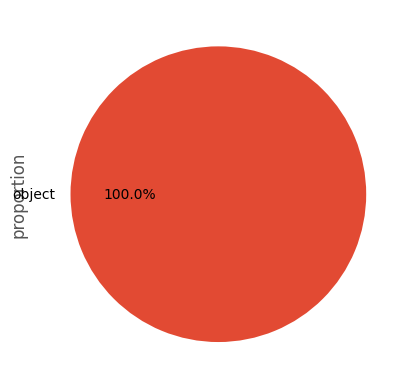

In [8]:
plt.figure()
df.dtypes.value_counts(normalize=True).plot.pie(autopct='%1.1f%%')

# [Step 2: data Preperation]()<a id="3"></a> <br>
- Dropping irrelevant columns and rows

In [10]:
for col in df.select_dtypes('object'):
    if len(df[col].unique()) == 1 :
        print("we drop "+col+" : Observing Unique Values")
        df.drop([col], axis=1, inplace=True)

- - Cleaning Column (always use it  for column_y)

In [11]:
for col in df.select_dtypes('object'):
    if len(df[col].unique()) <= 20 :
        print(f'{col :-<40} {df[col].unique()}')

class----------------------------------- ['poisonous' 'edible']
cap-shape------------------------------- ['convex' 'bell' 'sunken' 'flat' 'knobbed' 'conical']
cap-surface----------------------------- ['smooth' 'scaly' 'fibrous' 'grooves']
cap-color------------------------------- ['brown' 'yellow' 'white' 'gray' 'red' 'pink' 'buff' 'purple' 'cinnamon'
 'green']
bruises--------------------------------- ['bruises' 'no']
odor------------------------------------ ['pungent' 'almond' 'anise' 'none' 'foul' 'creosote' 'fishy' 'spicy'
 'musty']
gill-attachment------------------------- ['free' 'attached']
gill-spacing---------------------------- ['close' 'crowded']
gill-size------------------------------- ['narrow' 'broad']
gill-color------------------------------ ['black' 'brown' 'gray' 'pink' 'white' 'chocolate' 'purple' 'red' 'buff'
 'green' 'yellow' 'orange']
stalk-shape----------------------------- ['enlarging' 'tapering']
stalk-root------------------------------ ['equal' 'club' 'bulbous' 'r

In [13]:
for col in df.select_dtypes('object'):
    print(df[col].value_counts())
    print("===========================")

class
edible       4208
poisonous    3916
Name: count, dtype: int64
cap-shape
convex     3656
flat       3152
knobbed     828
bell        452
sunken       32
conical       4
Name: count, dtype: int64
cap-surface
scaly      3244
smooth     2556
fibrous    2320
grooves       4
Name: count, dtype: int64
cap-color
brown       2284
gray        1840
red         1500
yellow      1072
white       1040
buff         168
pink         144
cinnamon      44
purple        16
green         16
Name: count, dtype: int64
bruises
no         4748
bruises    3376
Name: count, dtype: int64
odor
none        3528
foul        2160
fishy        576
spicy        576
almond       400
anise        400
pungent      256
creosote     192
musty         36
Name: count, dtype: int64
gill-attachment
free        7914
attached     210
Name: count, dtype: int64
gill-spacing
close      6812
crowded    1312
Name: count, dtype: int64
gill-size
broad     5612
narrow    2512
Name: count, dtype: int64
gill-color
buff         1728


- - visualisation val missing : (visualisation of array[True, False] in order to detect nan(% of emptying))

<Axes: >

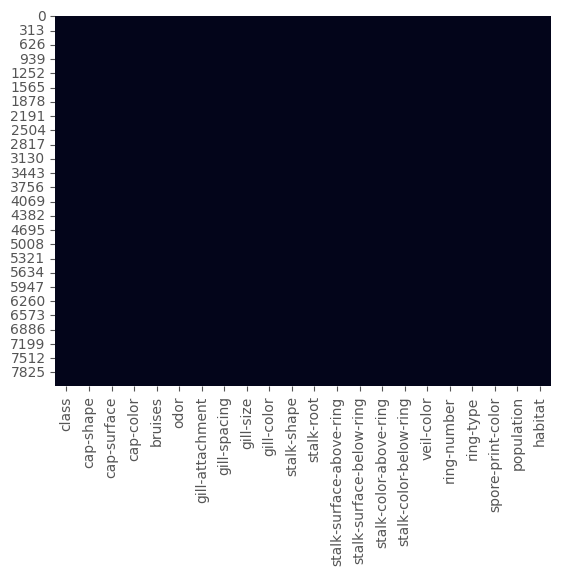

In [14]:
sns.heatmap(df.isna(), cbar=False) 

# [Step 3: Feature Understanding]()<a id="4"></a> <br>

- - Analyse target : (reg or classif) / (variables type:'numerical' or 'categorical') / (equilibre or not) classif non equilibre 10% of var1

<Axes: ylabel='proportion'>

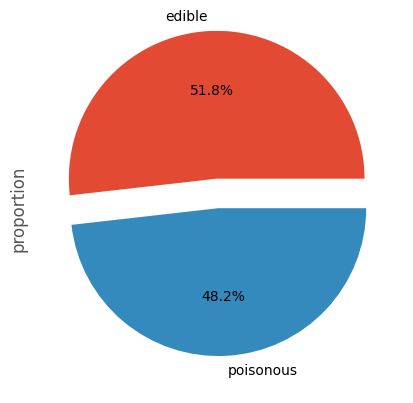

In [16]:
df['class'].value_counts(normalize=True).plot.pie(autopct='%1.1f%%', explode =(0.2,0))

- - Histo des variables columns object : (binaire(0,1) or not) / (equilibre or not)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


class--------------------------------------------- ['poisonous' 'edible']


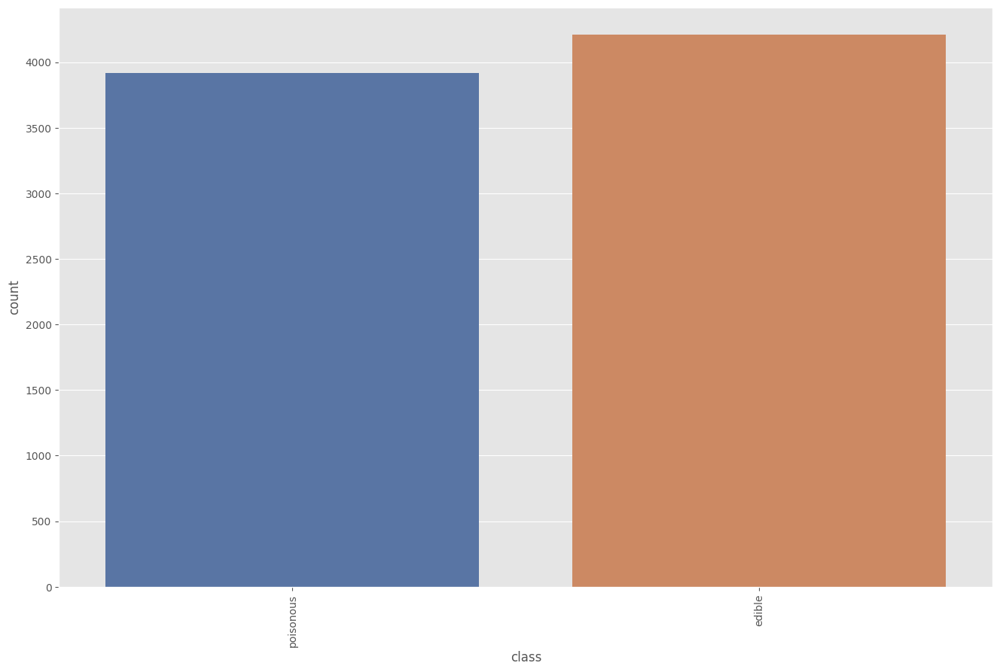

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cap-shape----------------------------------------- ['convex' 'bell' 'sunken' 'flat' 'knobbed' 'conical']


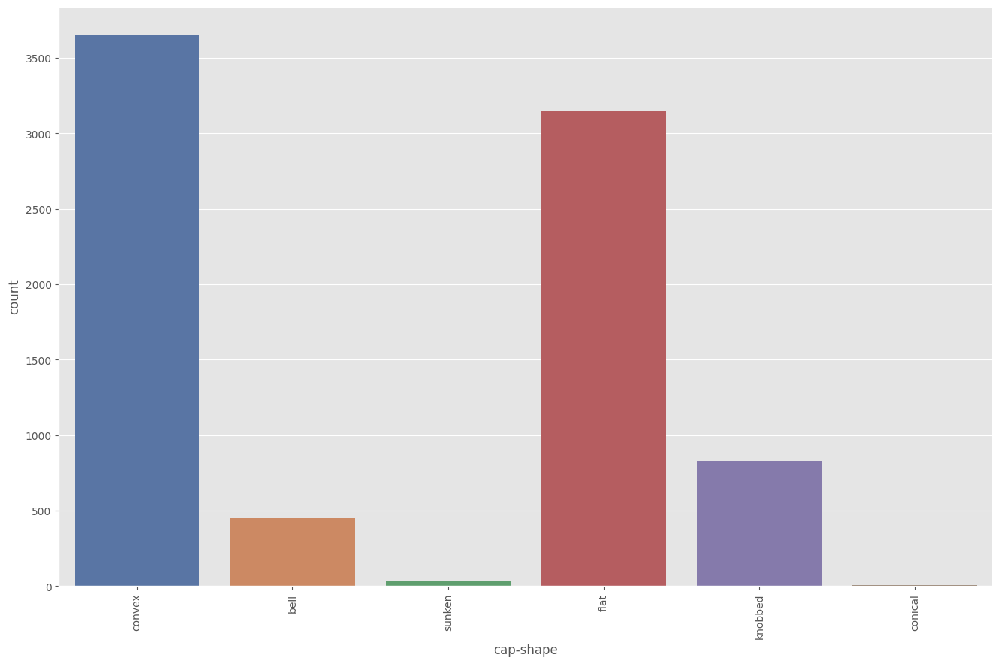

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cap-surface--------------------------------------- ['smooth' 'scaly' 'fibrous' 'grooves']


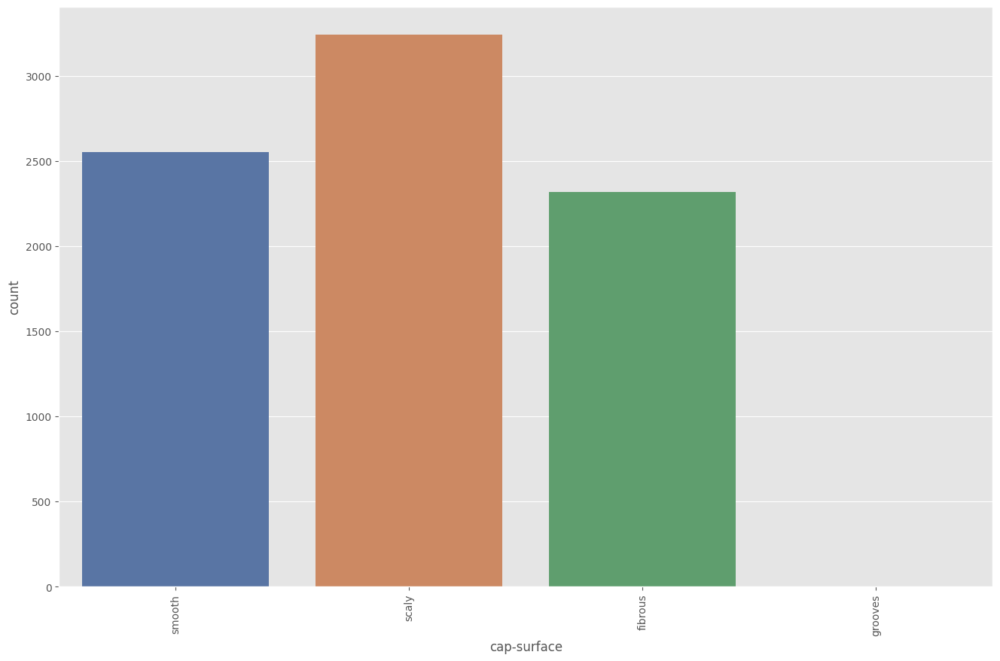

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


cap-color----------------------------------------- ['brown' 'yellow' 'white' 'gray' 'red' 'pink' 'buff' 'purple' 'cinnamon'
 'green']


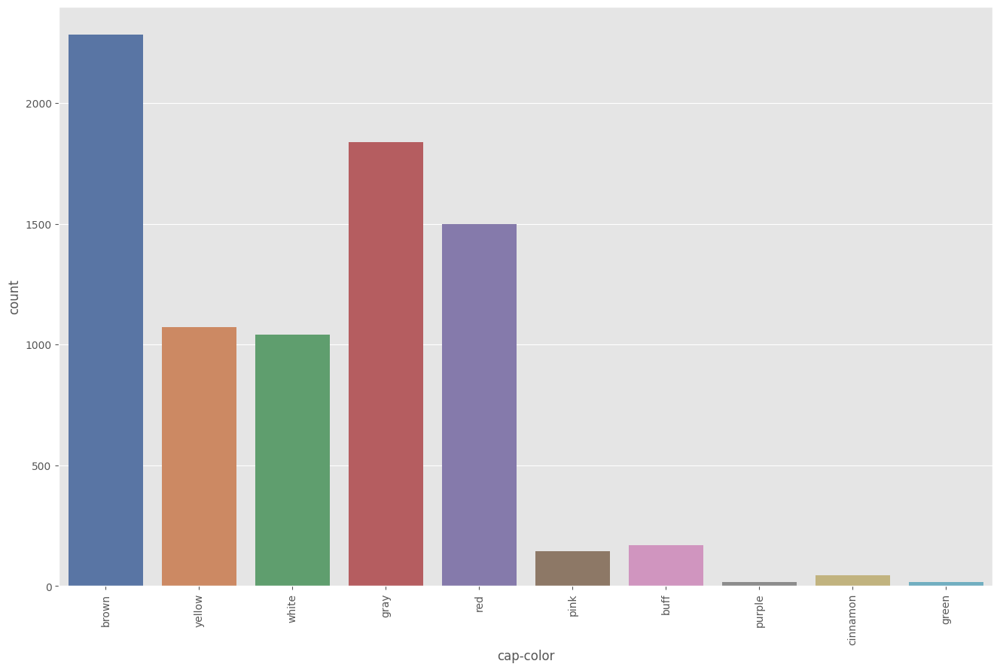

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


bruises------------------------------------------- ['bruises' 'no']


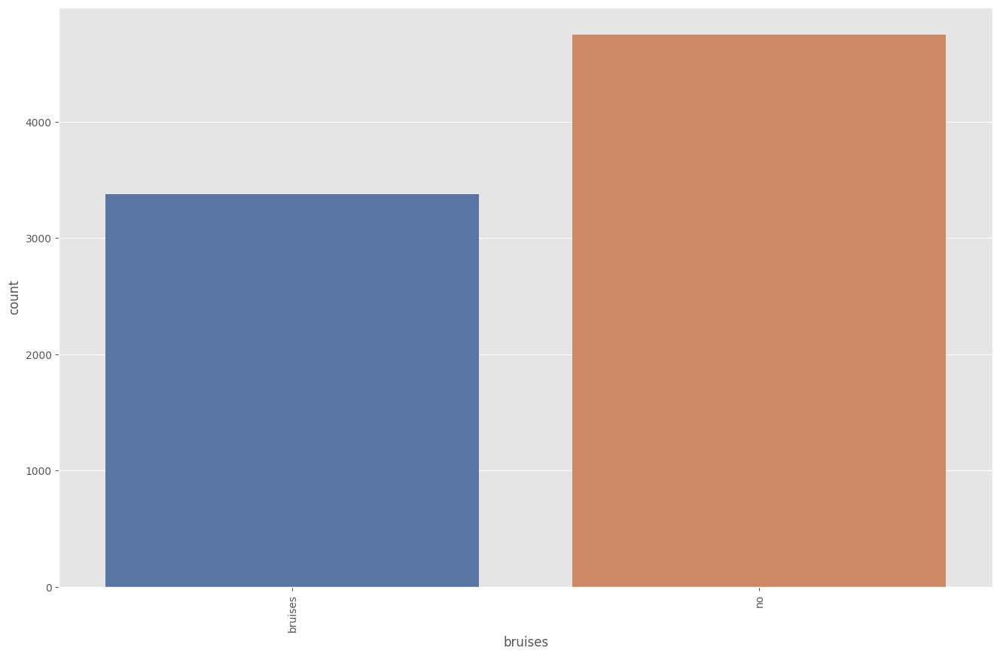

odor---------------------------------------------- ['pungent' 'almond' 'anise' 'none' 'foul' 'creosote' 'fishy' 'spicy'
 'musty']


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


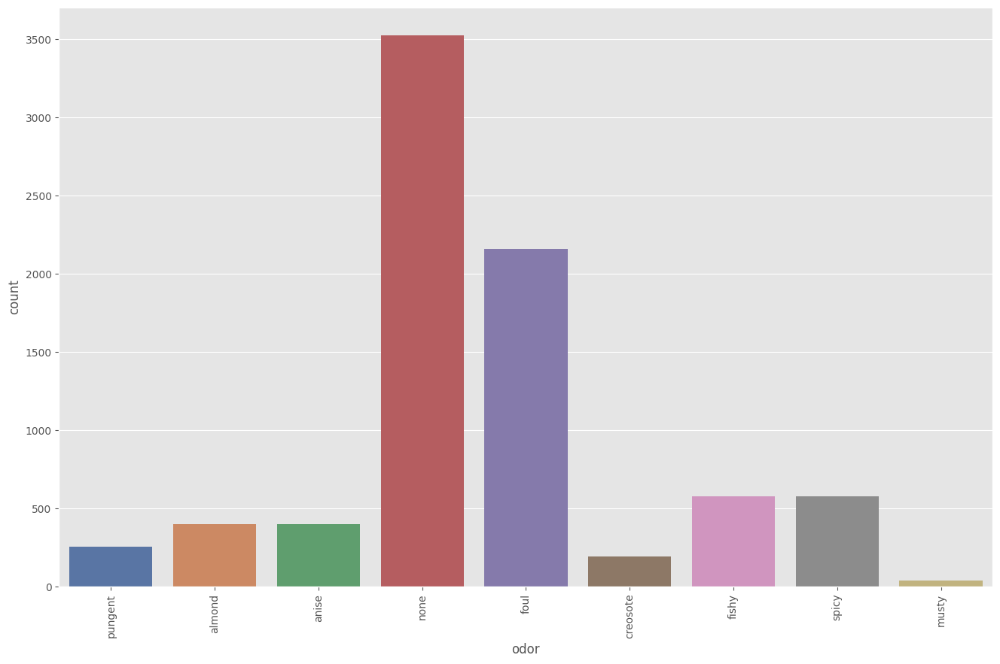

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


gill-attachment----------------------------------- ['free' 'attached']


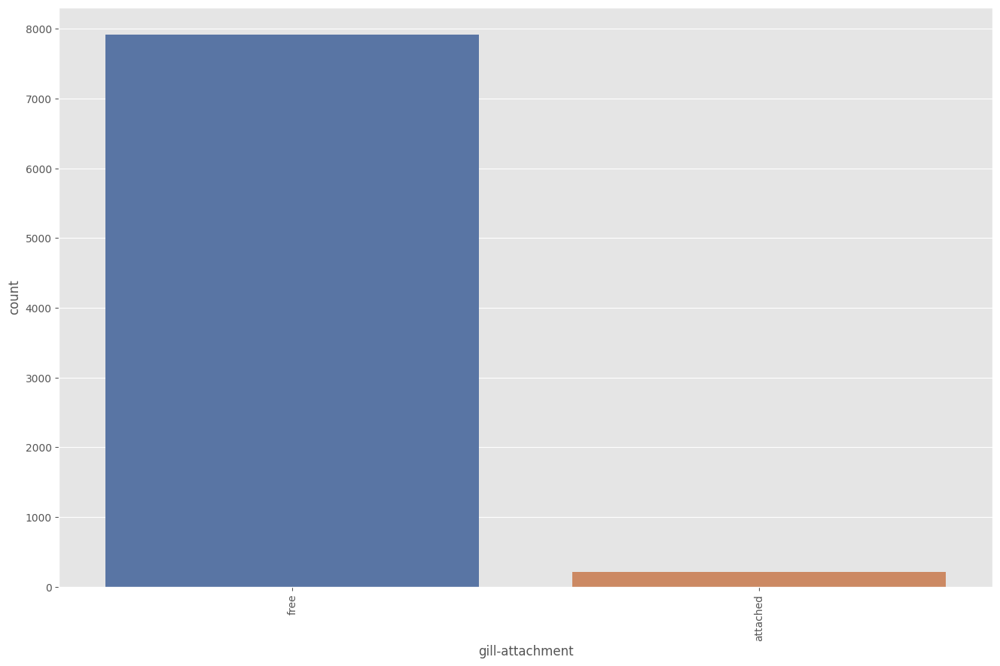

gill-spacing-------------------------------------- ['close' 'crowded']


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


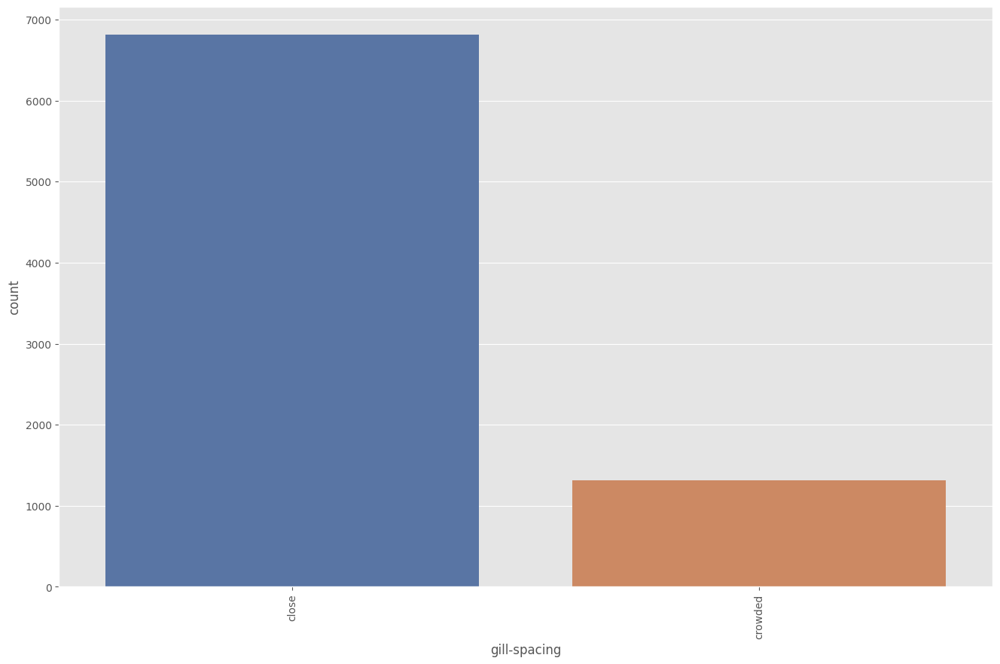

gill-size----------------------------------------- ['narrow' 'broad']


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


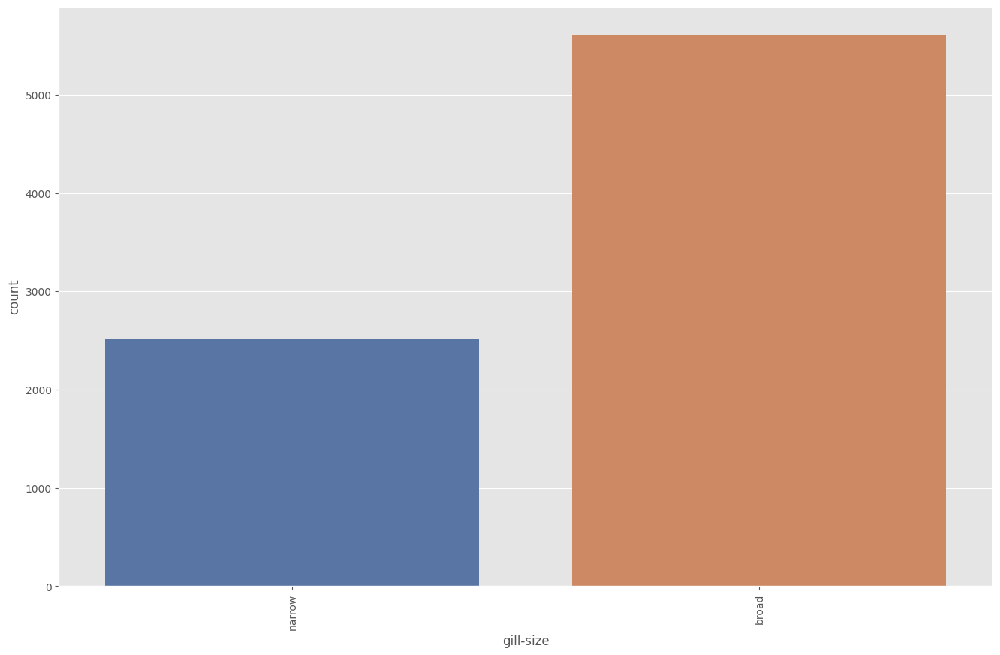

gill-color---------------------------------------- ['black' 'brown' 'gray' 'pink' 'white' 'chocolate' 'purple' 'red' 'buff'
 'green' 'yellow' 'orange']


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


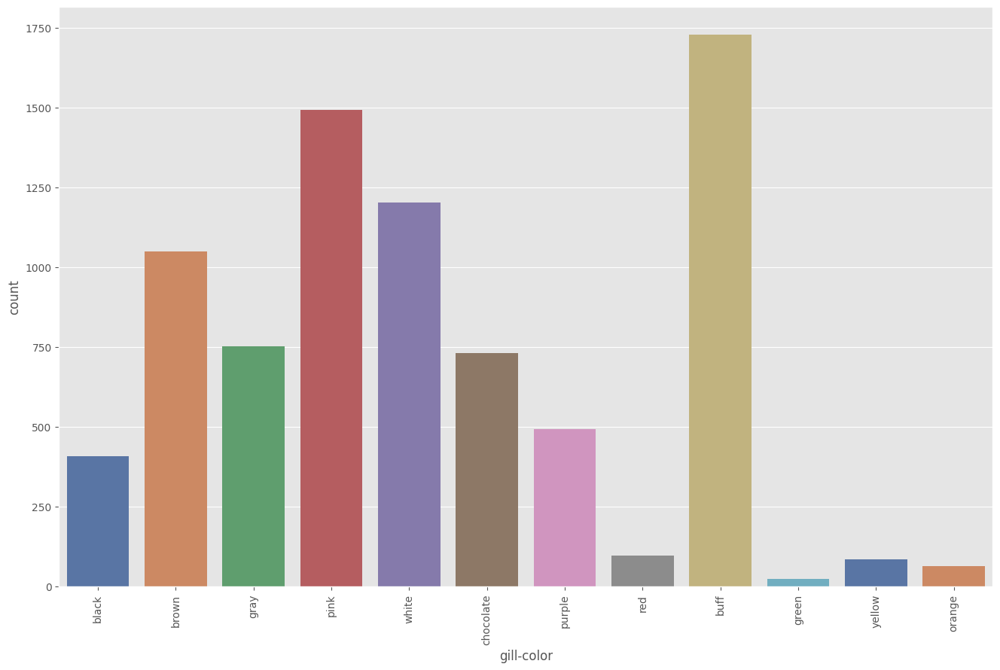

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


stalk-shape--------------------------------------- ['enlarging' 'tapering']


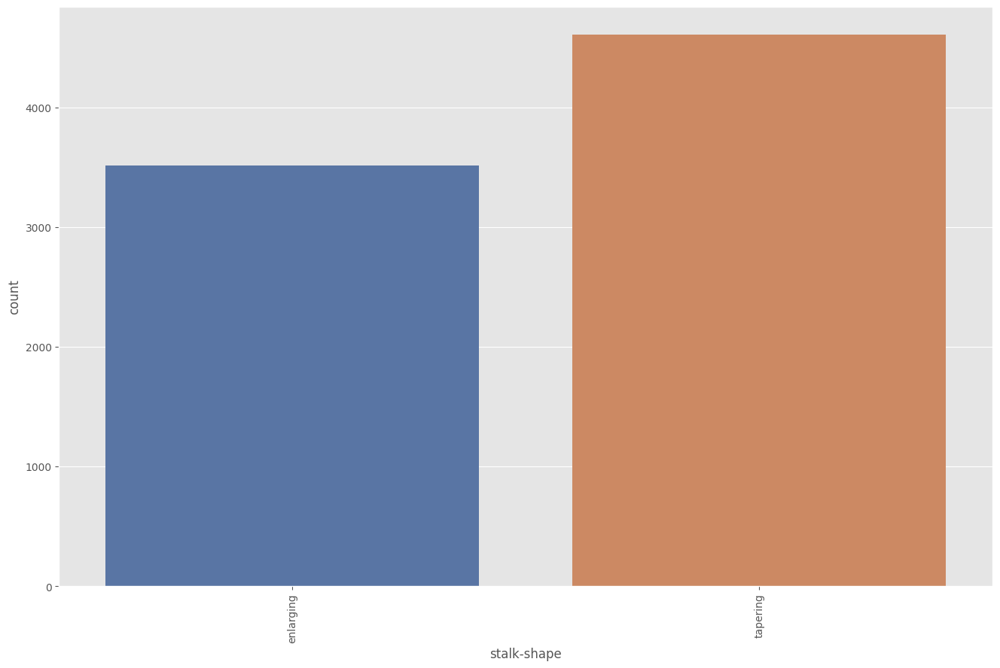

stalk-root---------------------------------------- ['equal' 'club' 'bulbous' 'rooted' 'missing']


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


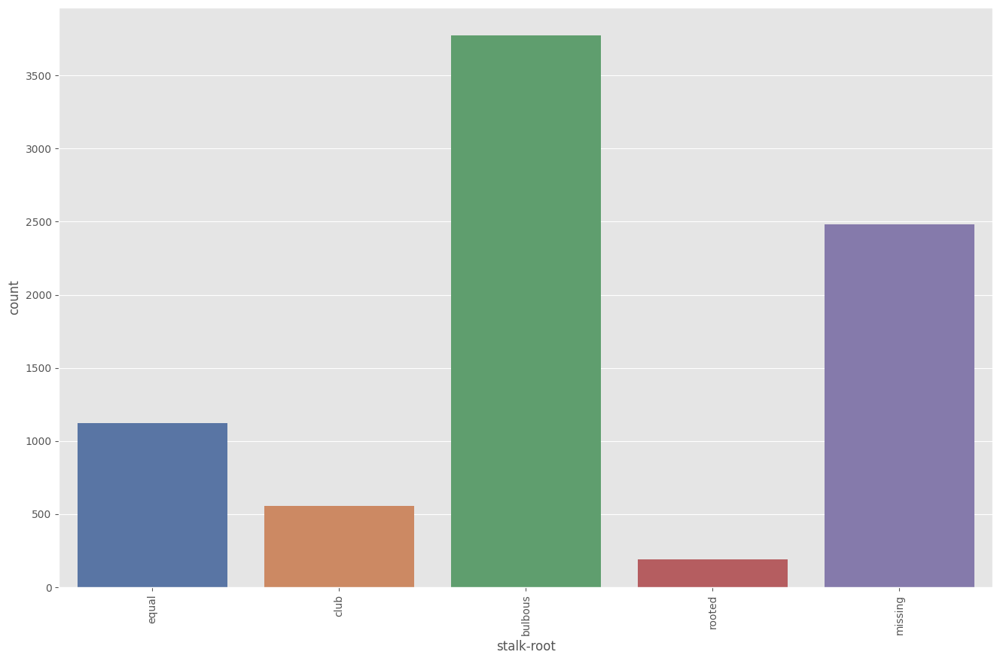

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


stalk-surface-above-ring-------------------------- ['smooth' 'fibrous' 'silky' 'scaly']


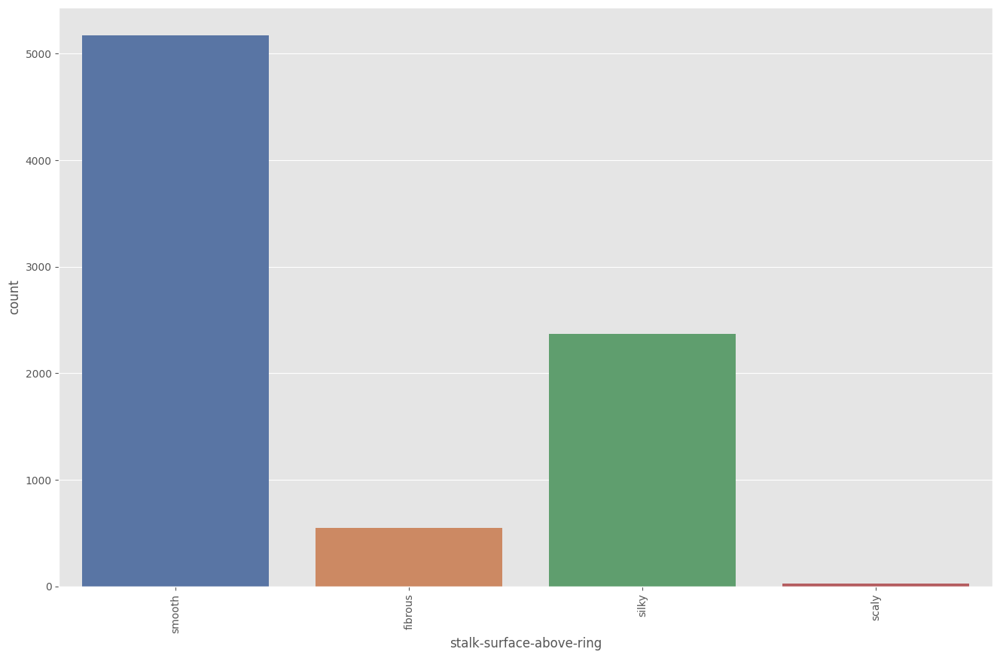

stalk-surface-below-ring-------------------------- ['smooth' 'fibrous' 'scaly' 'silky']


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


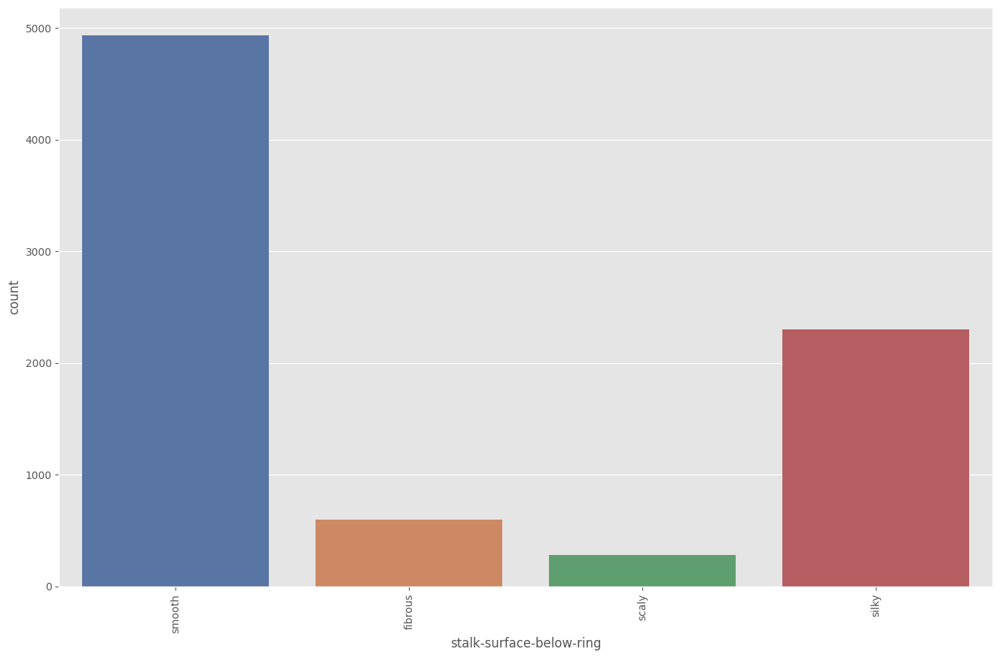

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


stalk-color-above-ring---------------------------- ['white' 'gray' 'pink' 'brown' 'buff' 'red' 'orange' 'cinnamon' 'yellow']


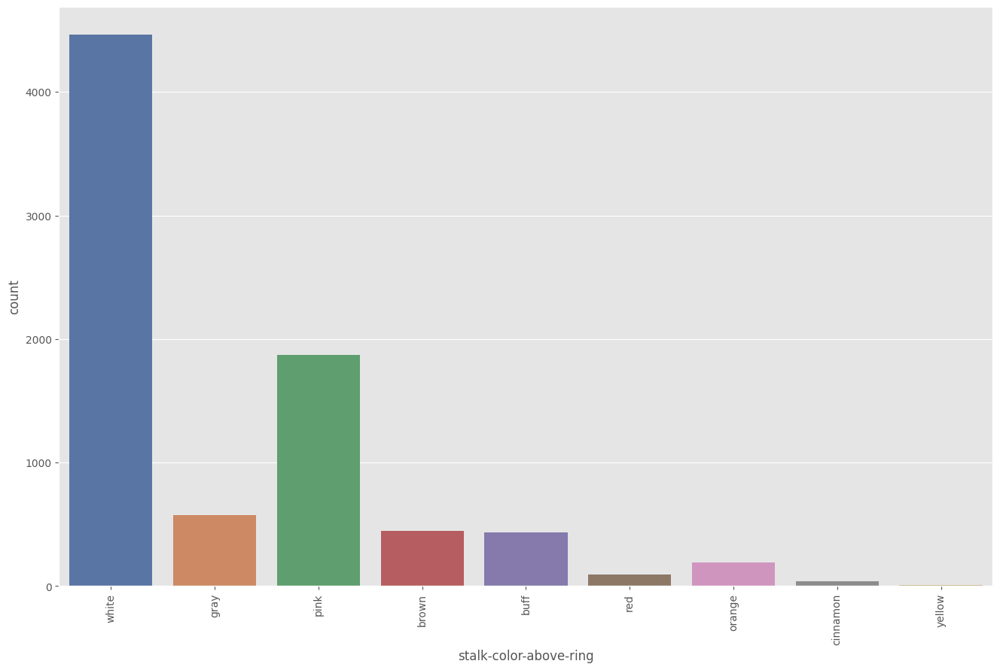

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


stalk-color-below-ring---------------------------- ['white' 'pink' 'gray' 'buff' 'brown' 'red' 'yellow' 'orange' 'cinnamon']


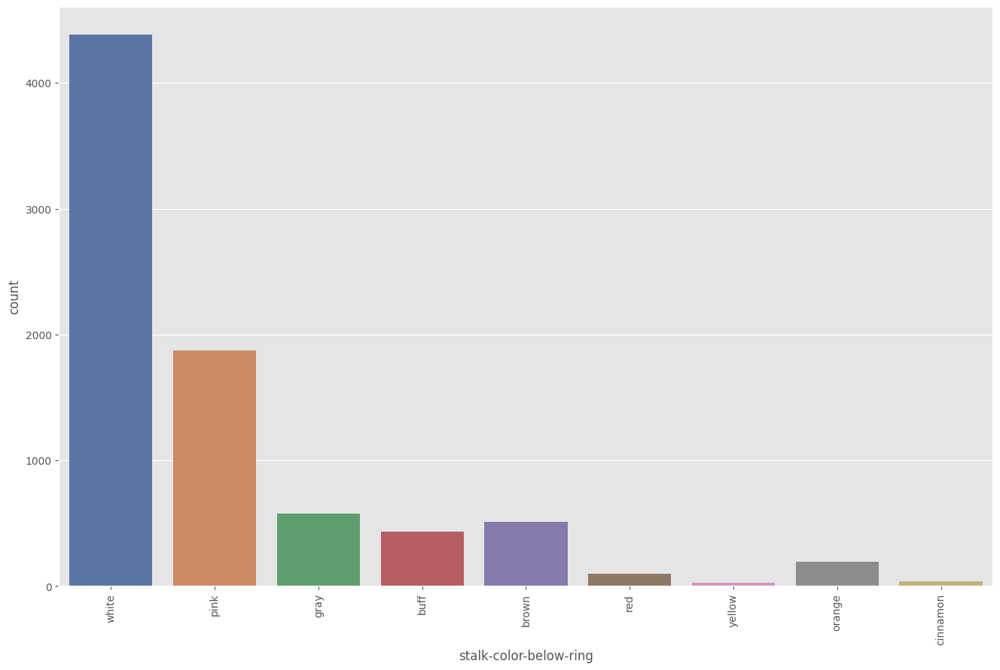

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


veil-color---------------------------------------- ['white' 'brown' 'orange' 'yellow']


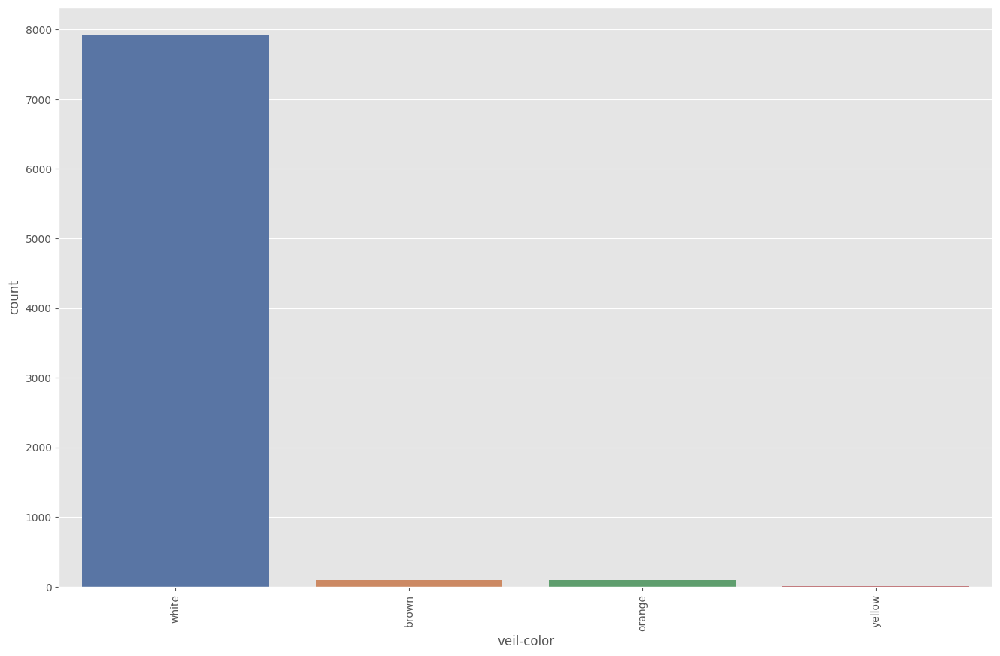

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ring-number--------------------------------------- ['one' 'two' 'none']


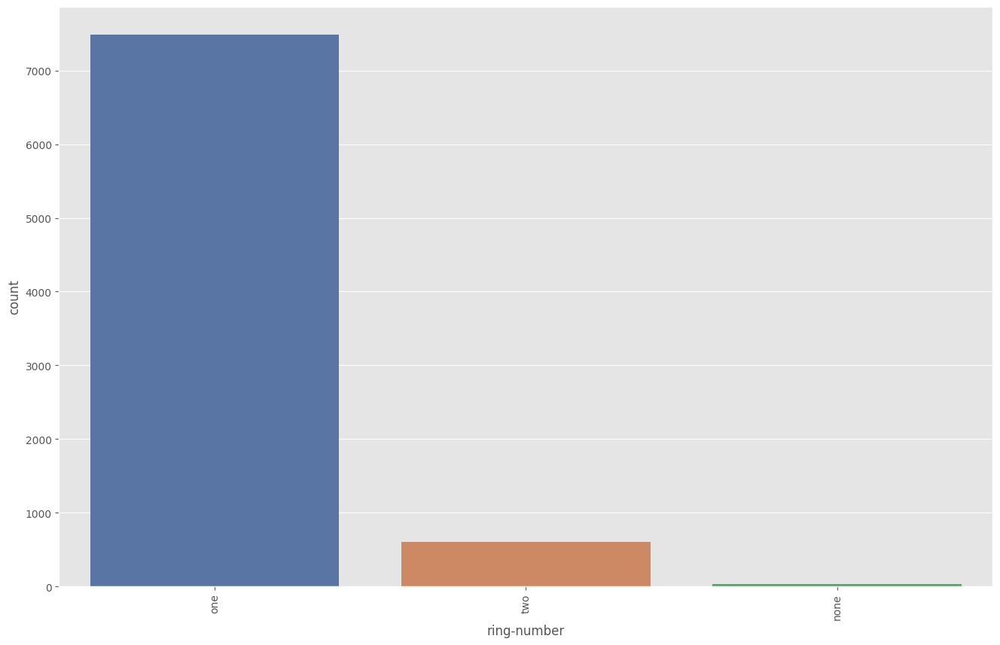

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ring-type----------------------------------------- ['pendant' 'evanescent' 'large' 'flaring' 'none']


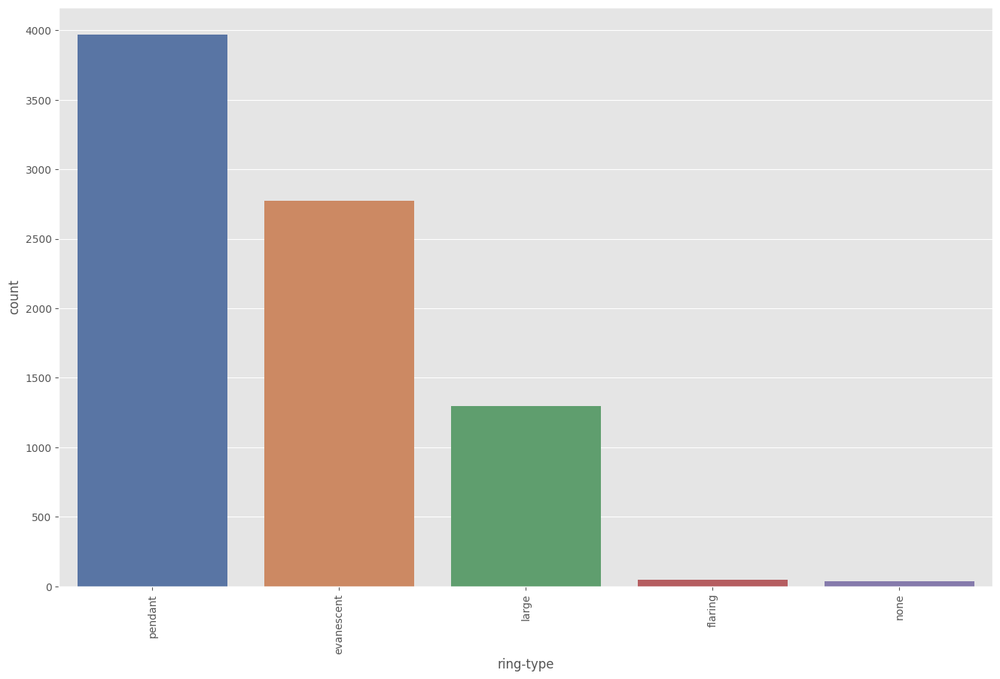

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


spore-print-color--------------------------------- ['black' 'brown' 'purple' 'chocolate' 'white' 'green' 'orange' 'yellow'
 'buff']


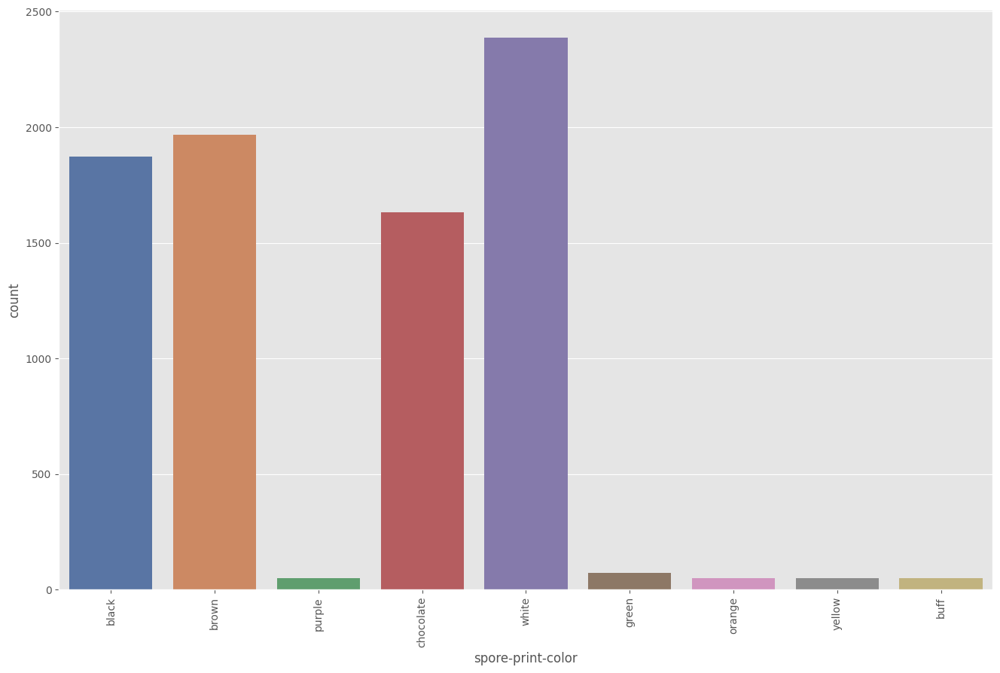

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


population---------------------------------------- ['scattered' 'numerous' 'abundant' 'several' 'solitary' 'clustered']


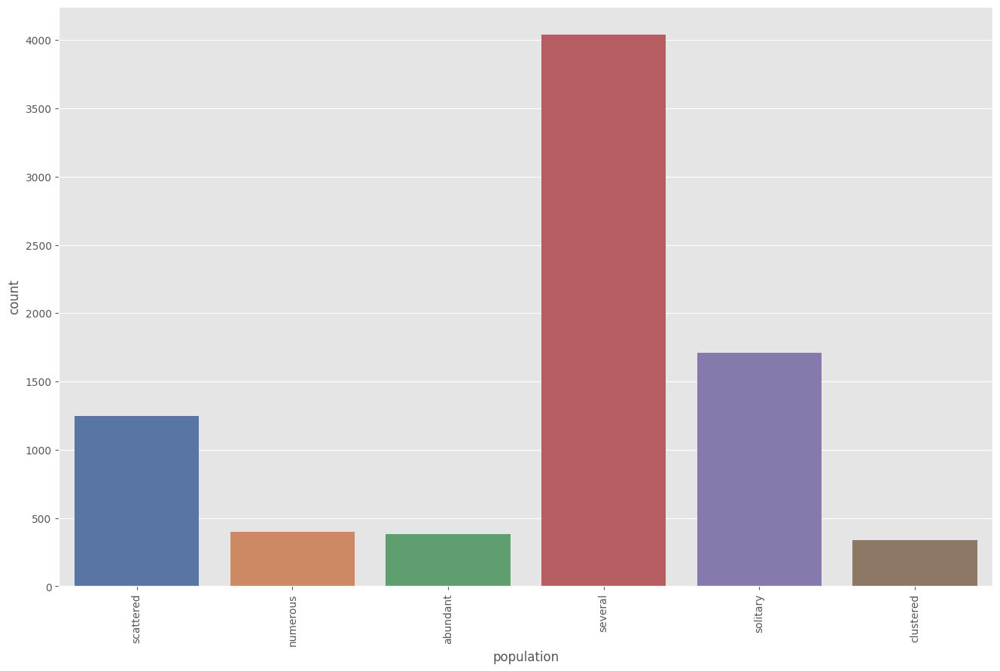

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


habitat------------------------------------------- ['urban' 'grasses' 'meadows' 'woods' 'paths' 'waste' 'leaves']


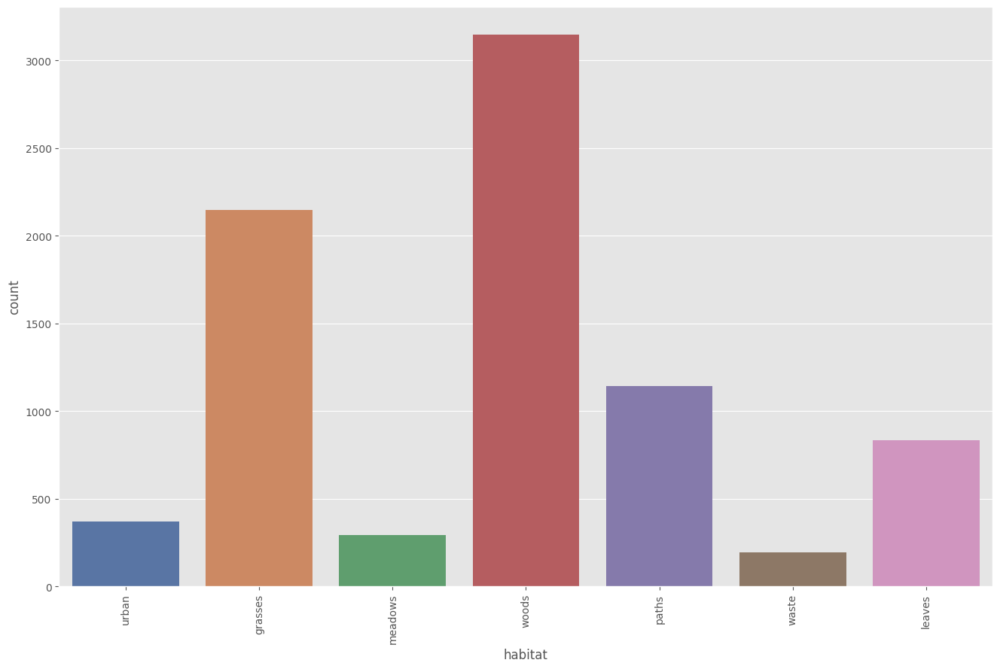

In [19]:
for col in df.select_dtypes('object'):
    print(f'{col :-<50} {df[col].unique()}')
    plt.figure(figsize = (16,10))
    ax = sns.countplot(x=df[col], hue=df[col], palette='deep')
    ax.legend().set_visible(False)
    plt.xticks(rotation=90)
    plt.show()

# [Step 4: Feature Relationships]()<a id="5"></a> <br>

- - Relation Target/Variables : (Taux corr variables/target >0.9) We ll try to understand how the target and other types variables relate.. 

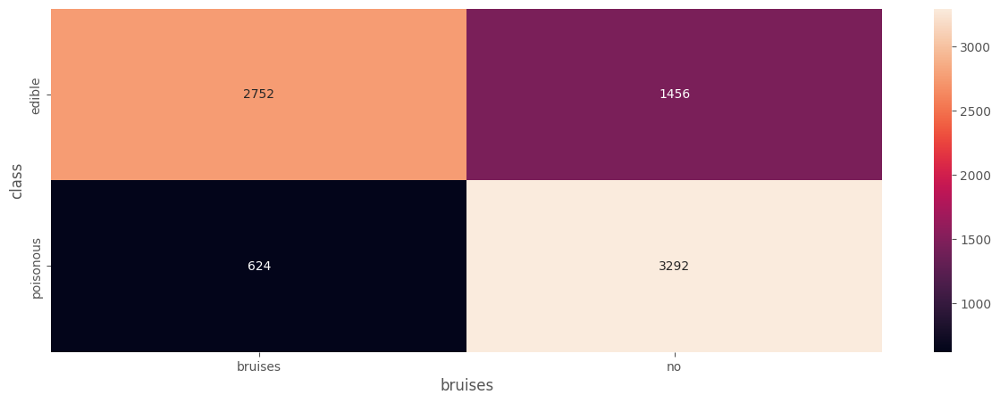

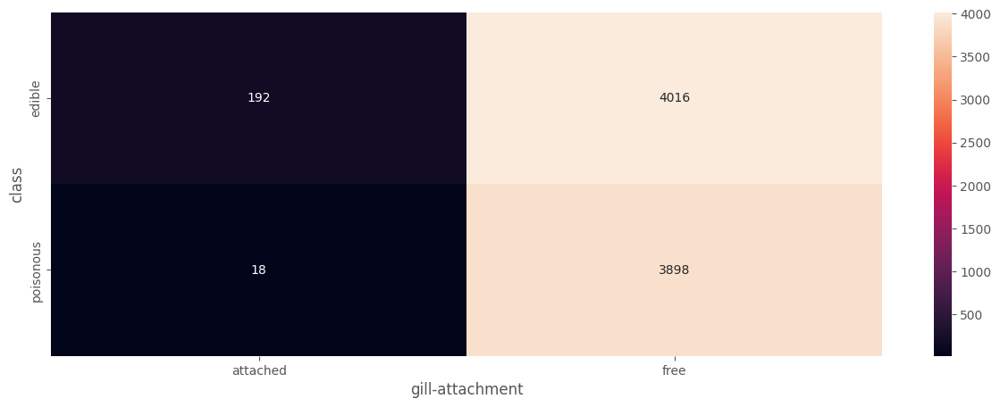

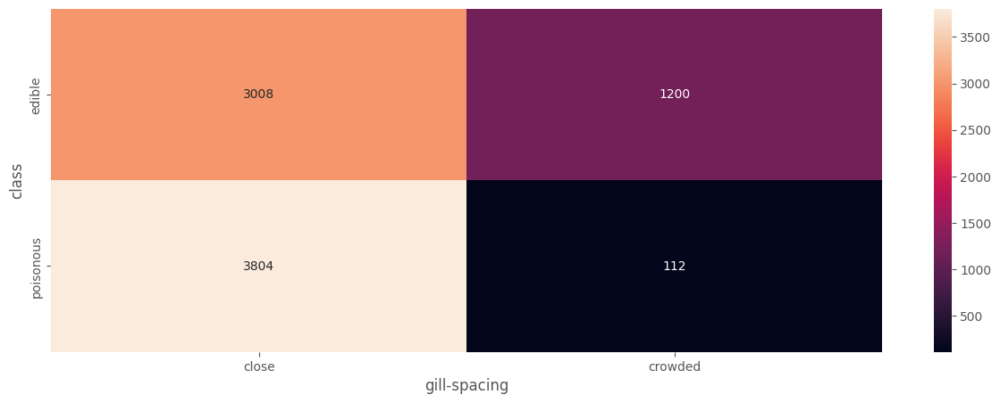

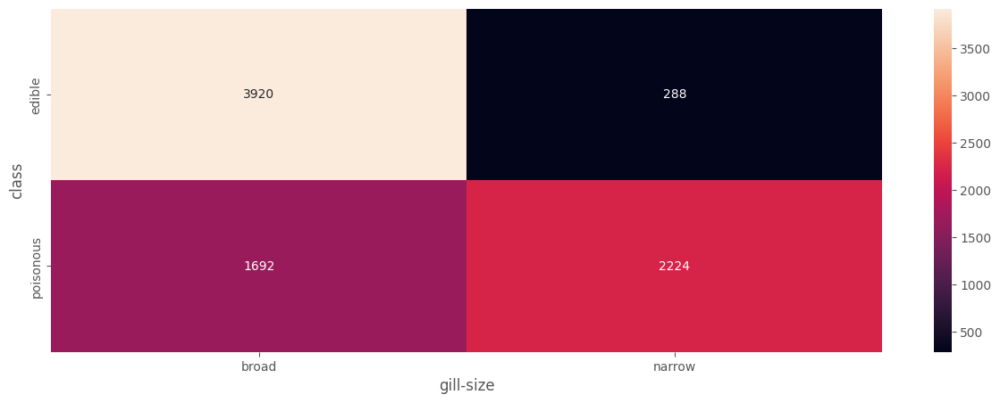

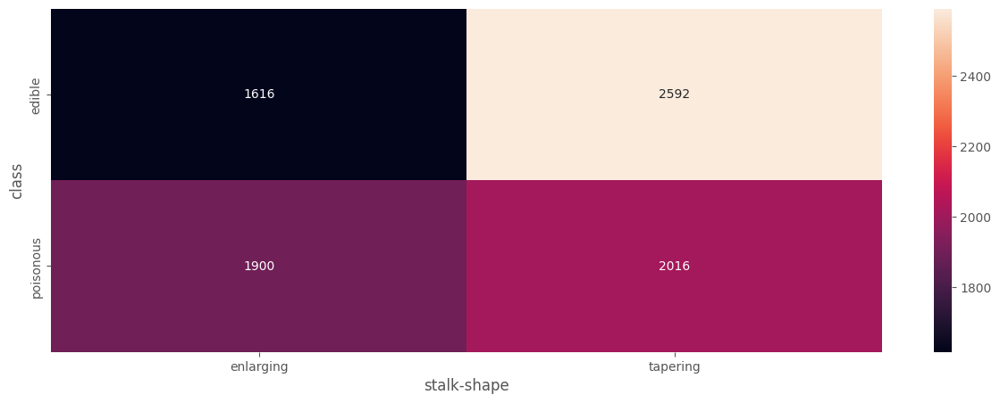

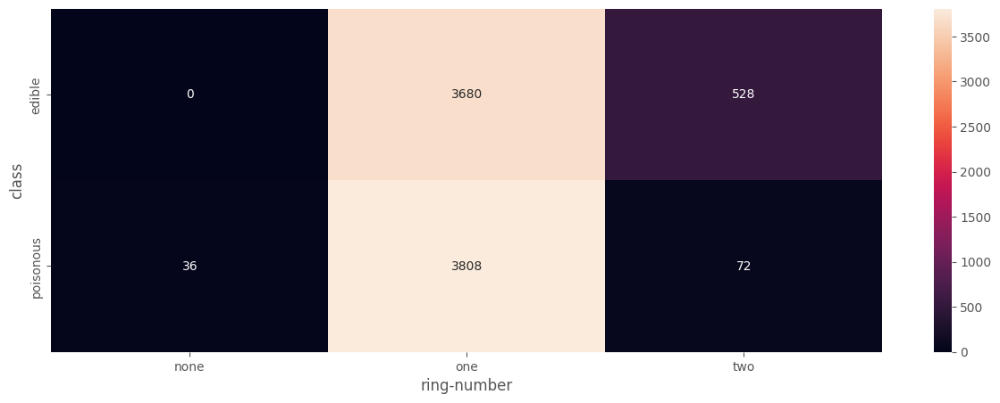

In [23]:
for col in df.select_dtypes(include=['object']):
    if len(df[col].unique()) <4 and col != 'class' :
            plt.figure(figsize=(15,5))
            sns.heatmap(pd.crosstab(df['class'],df[col]), annot=True, fmt='d') 

- - Relation Column/Column : (very usefull)

C:\Users\Farouq MOUSMI\AppData\Local\Temp\ipykernel_24244\1088529617.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

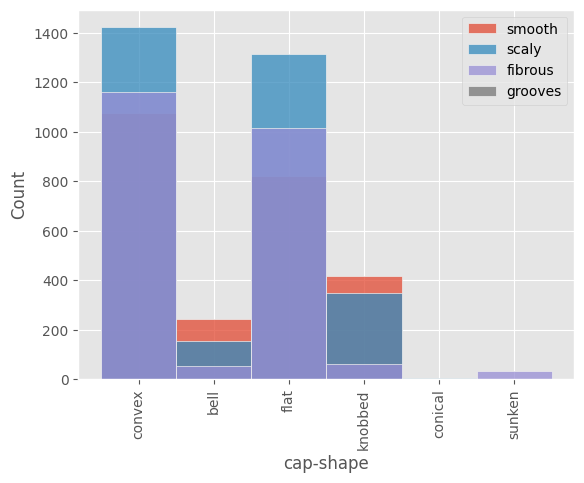

<Figure size 640x480 with 0 Axes>

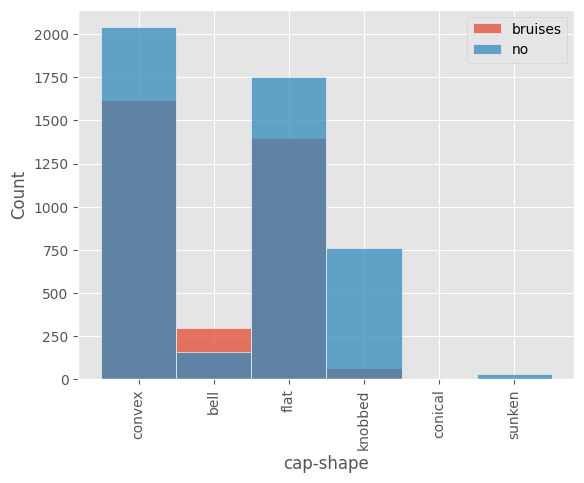

<Figure size 640x480 with 0 Axes>

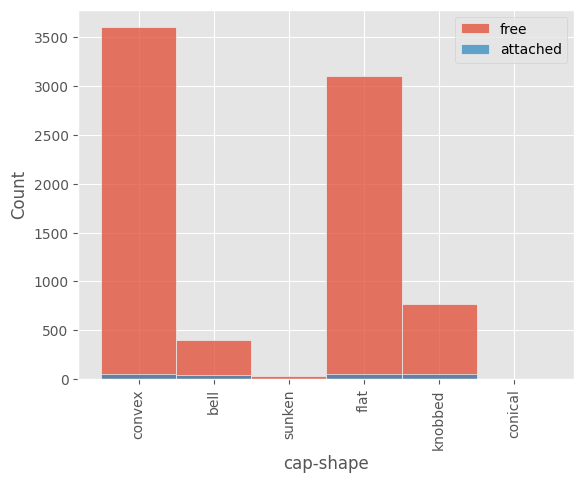

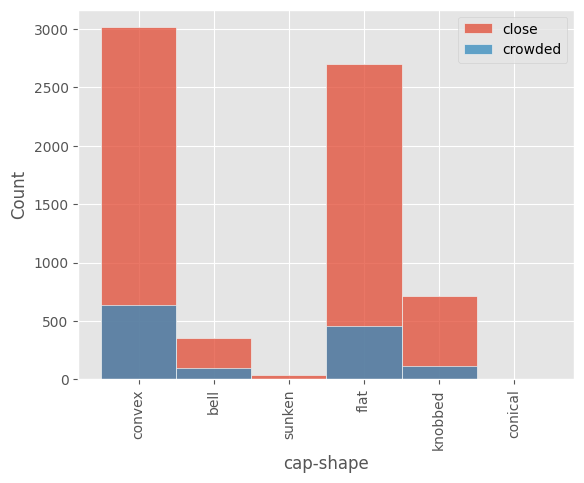

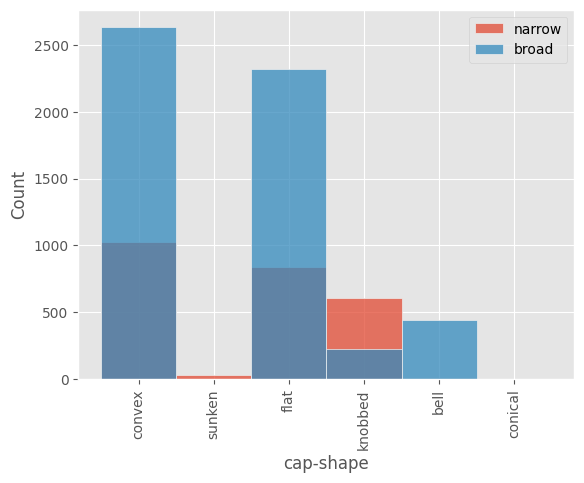

<Figure size 640x480 with 0 Axes>

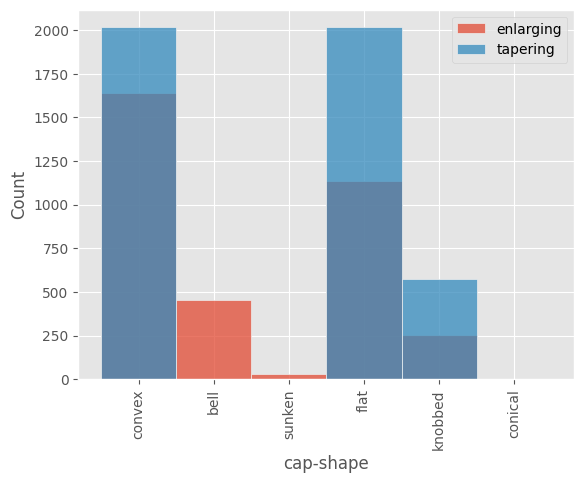

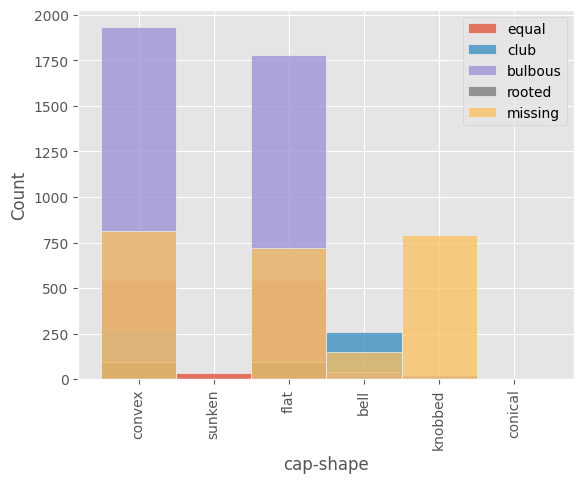

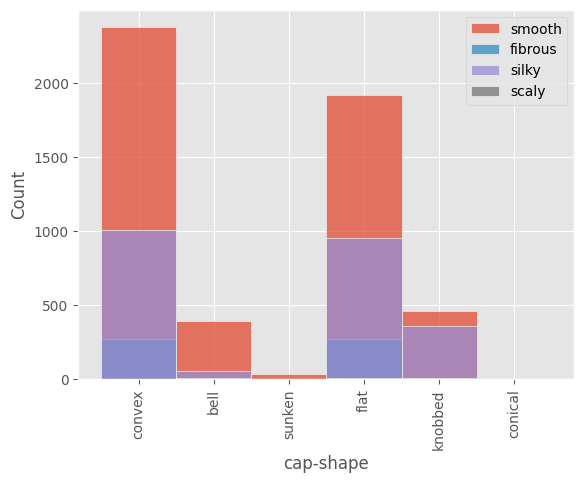

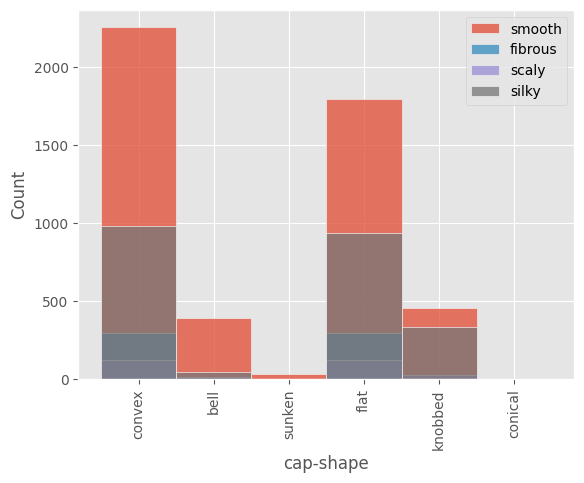

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

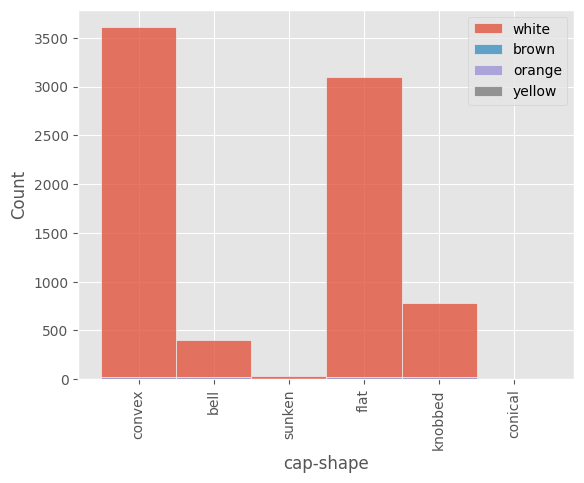

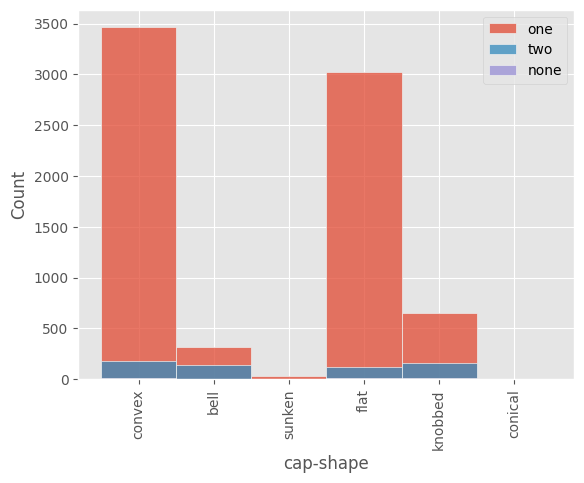

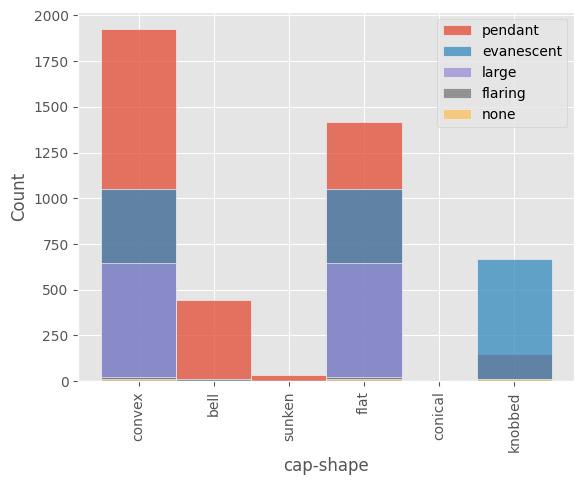

<Figure size 640x480 with 0 Axes>

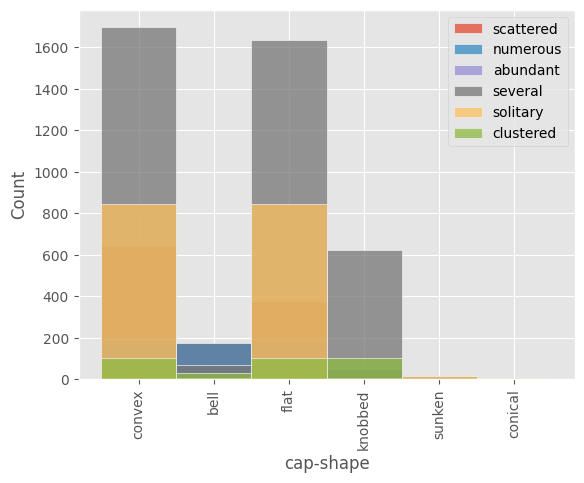

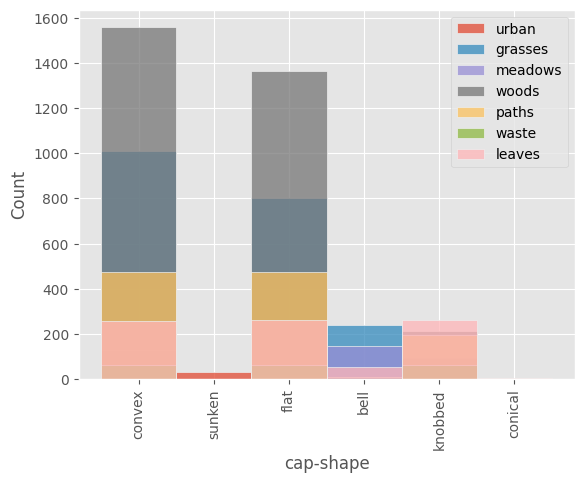

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

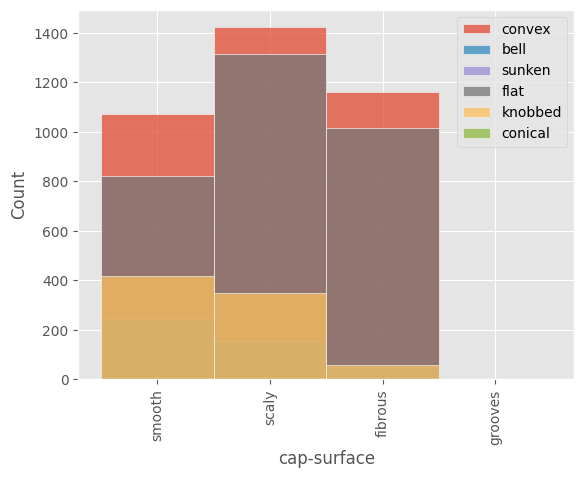

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

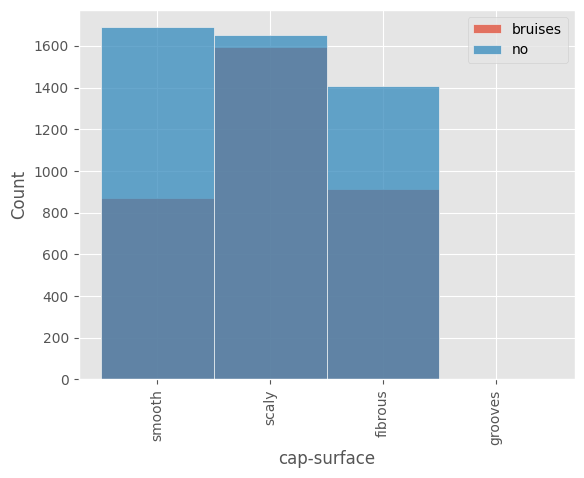

<Figure size 640x480 with 0 Axes>

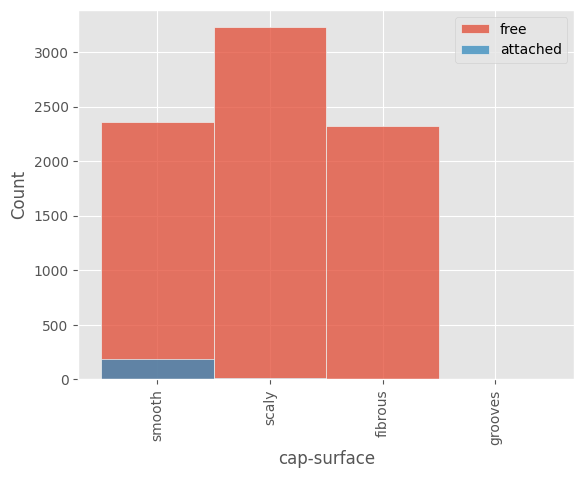

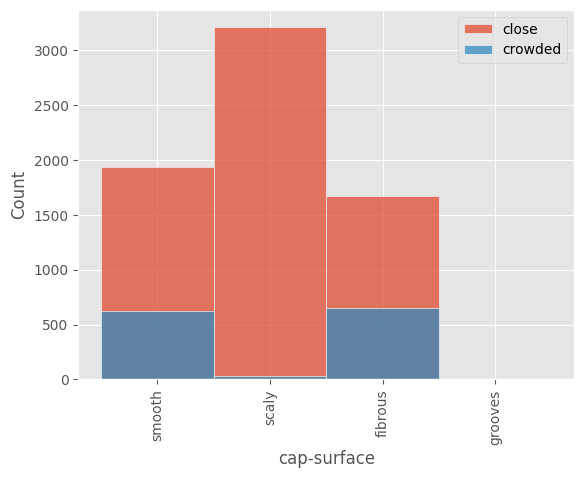

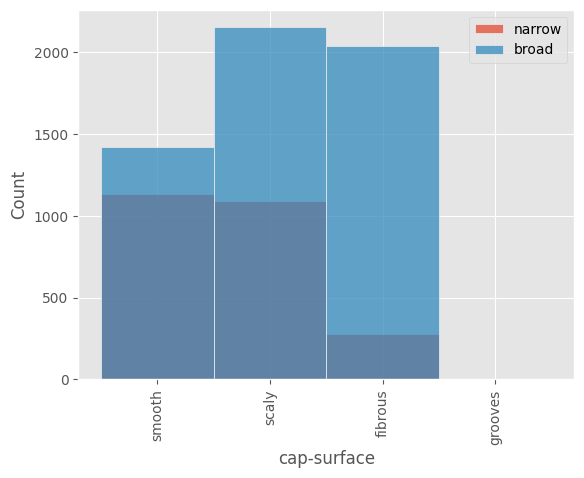

<Figure size 640x480 with 0 Axes>

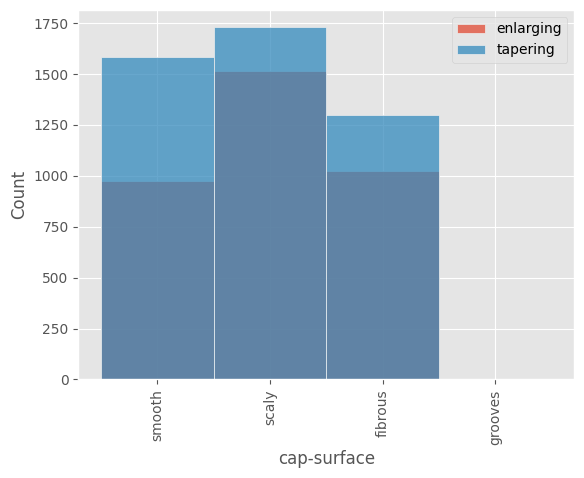

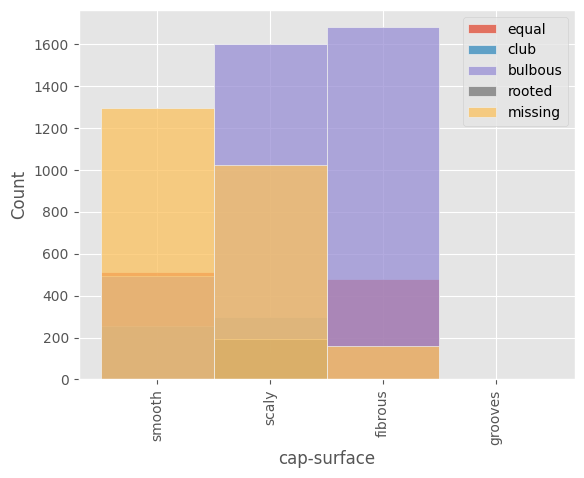

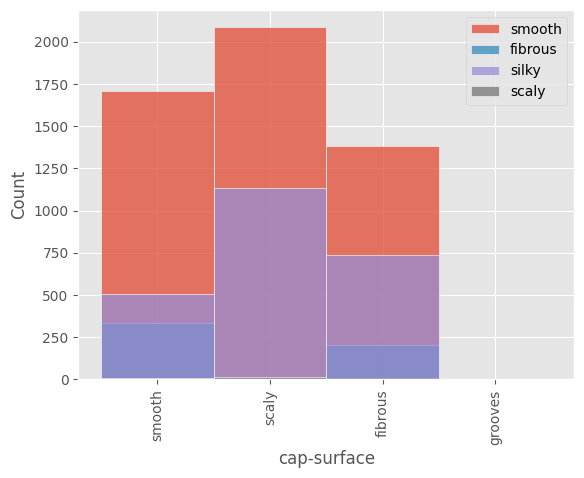

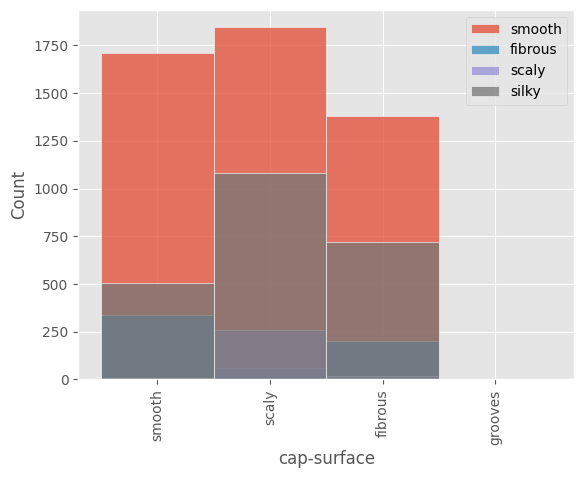

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

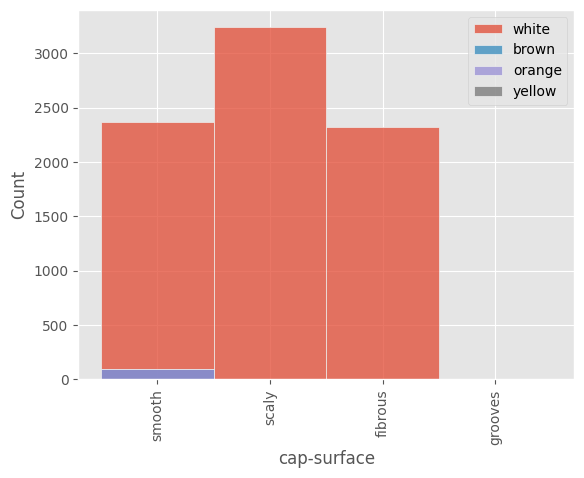

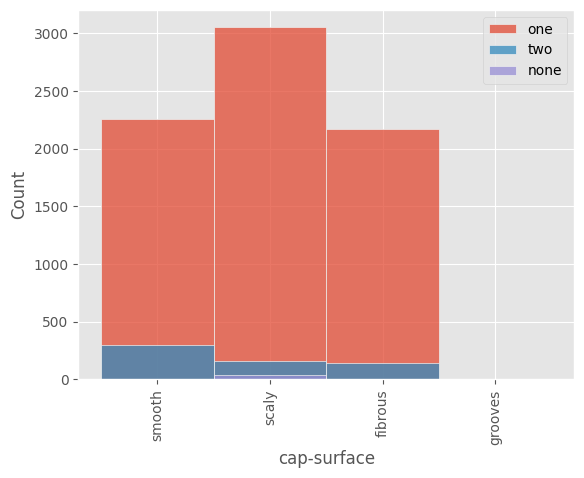

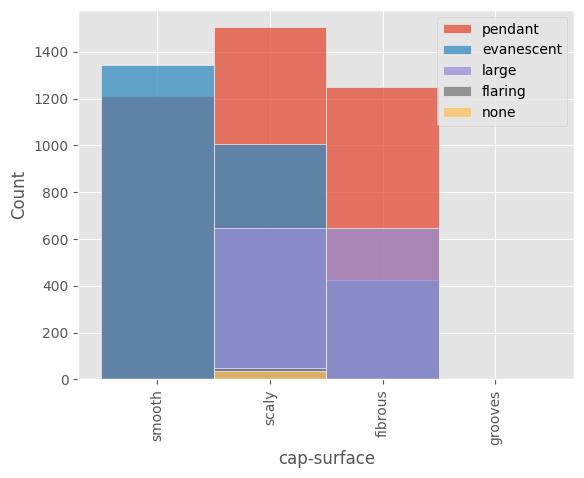

<Figure size 640x480 with 0 Axes>

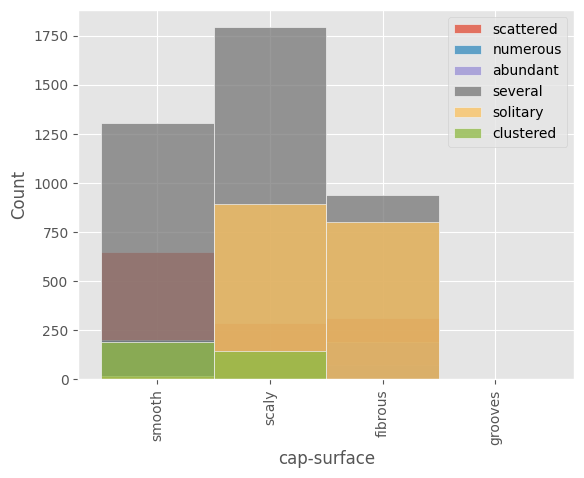

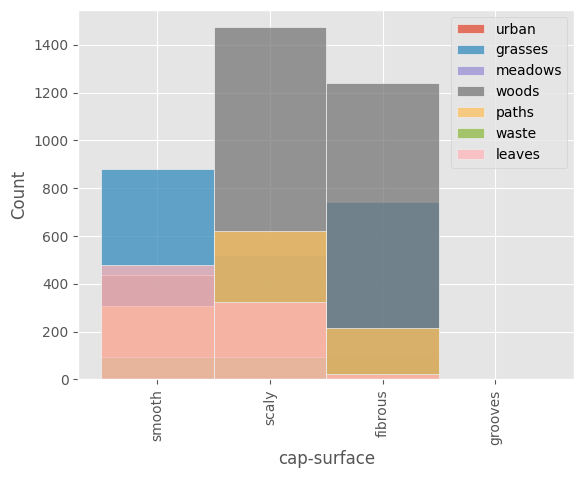

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

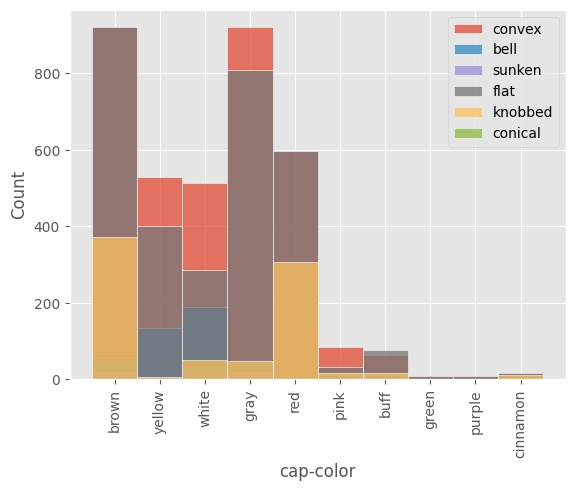

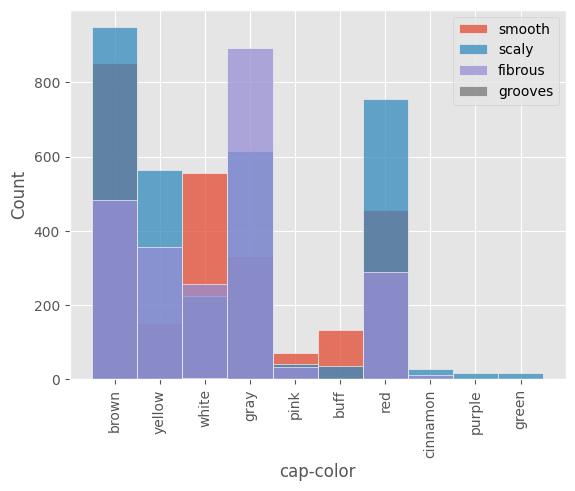

<Figure size 640x480 with 0 Axes>

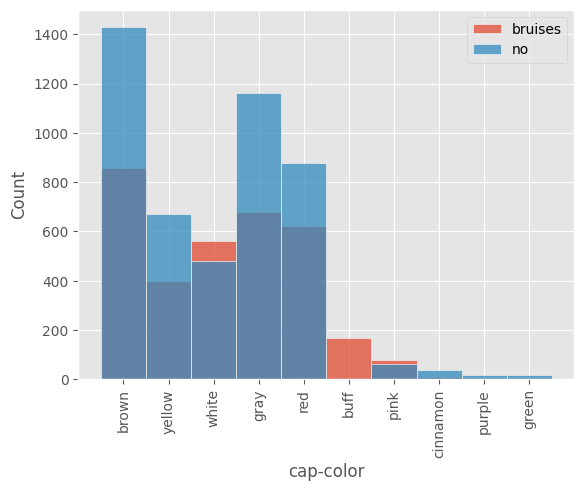

<Figure size 640x480 with 0 Axes>

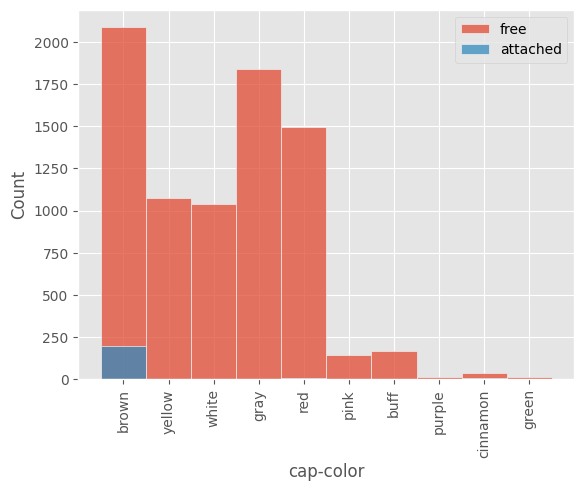

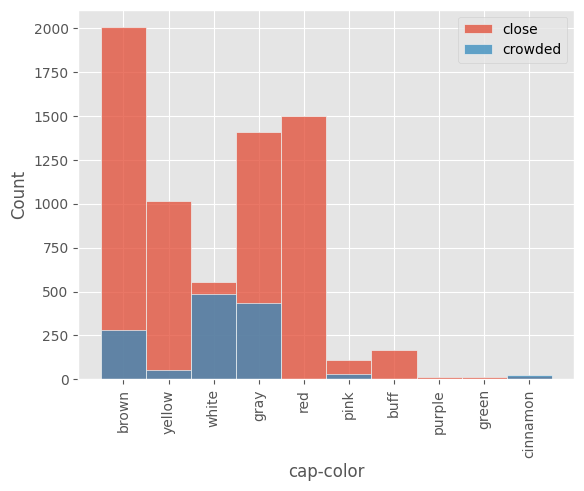

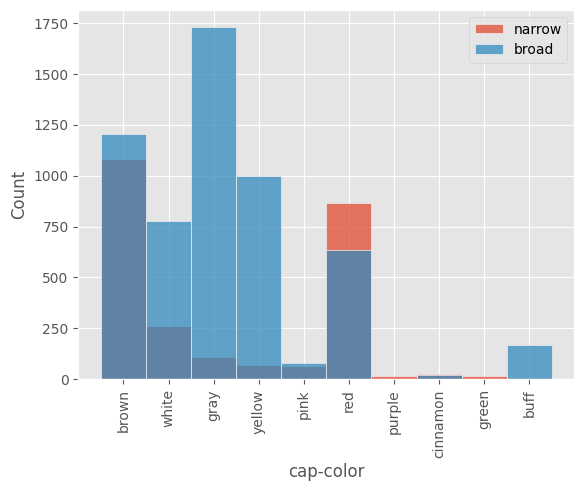

<Figure size 640x480 with 0 Axes>

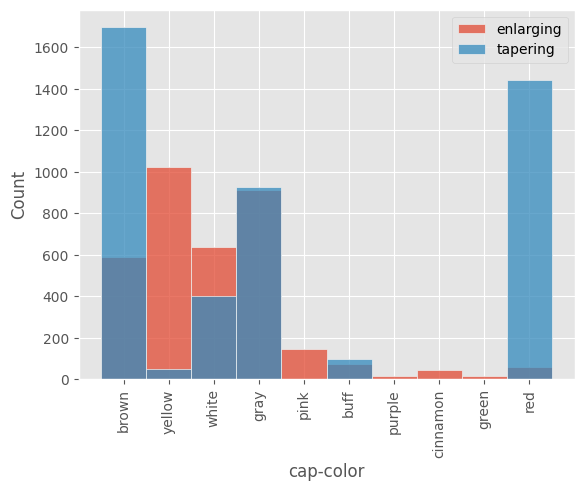

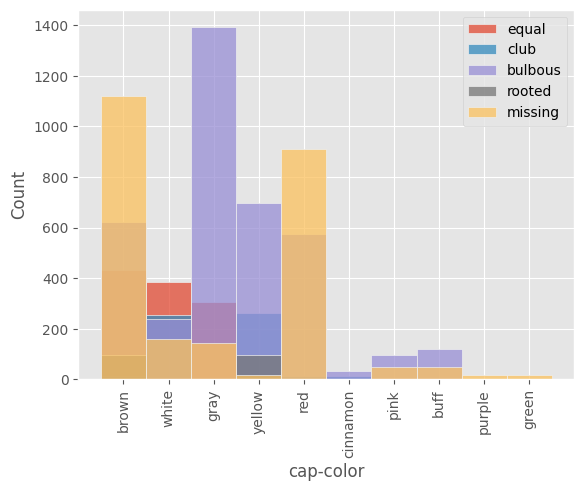

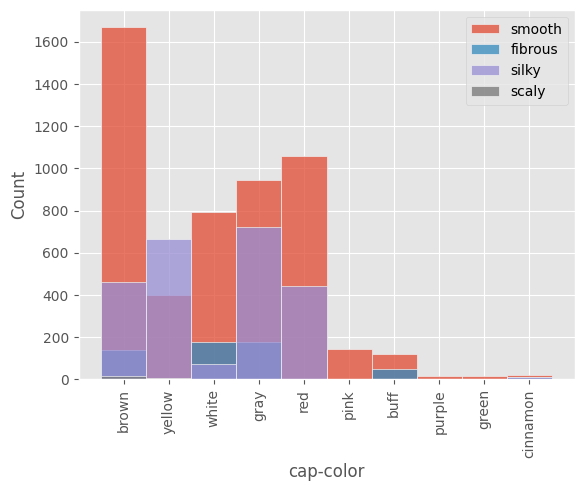

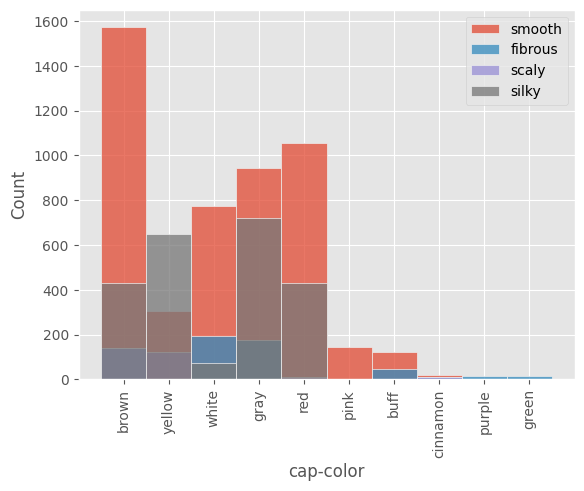

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

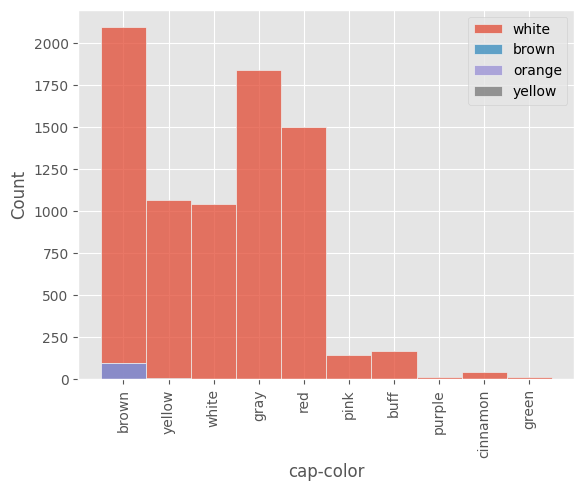

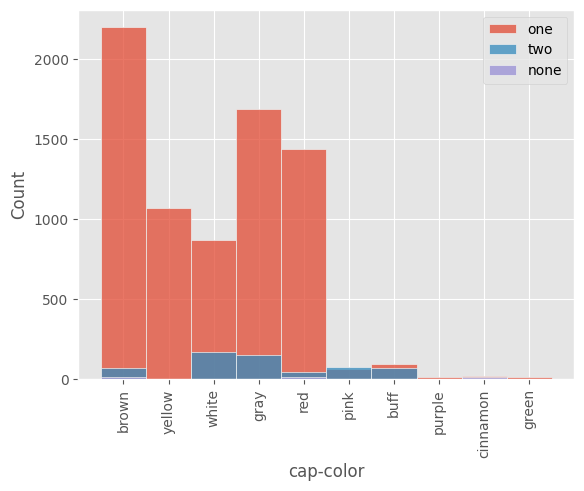

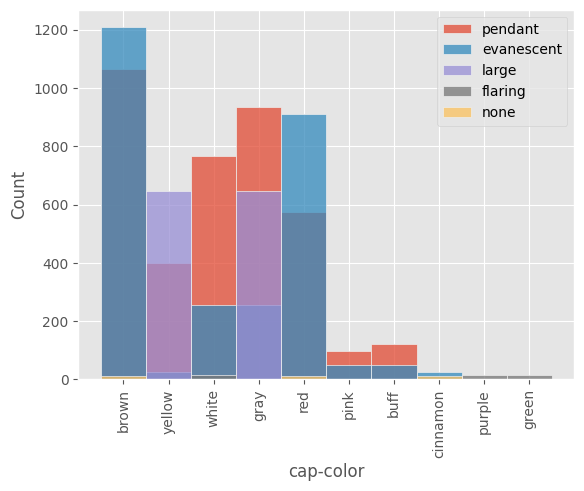

<Figure size 640x480 with 0 Axes>

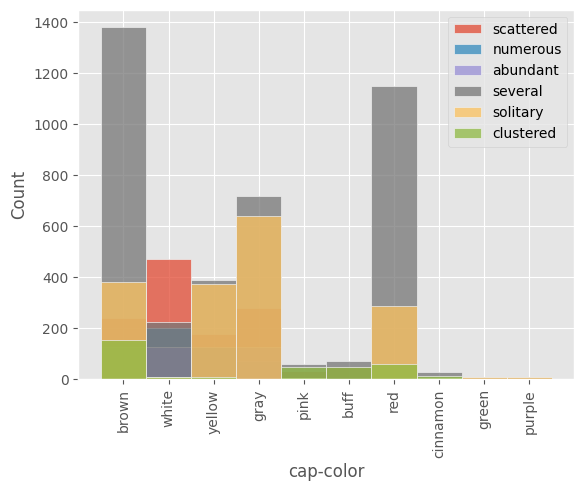

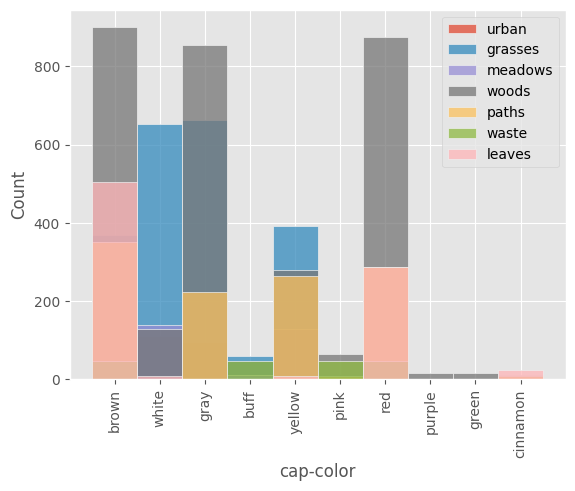

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

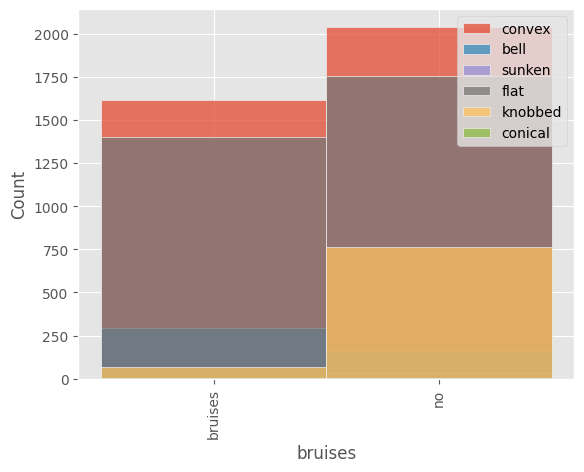

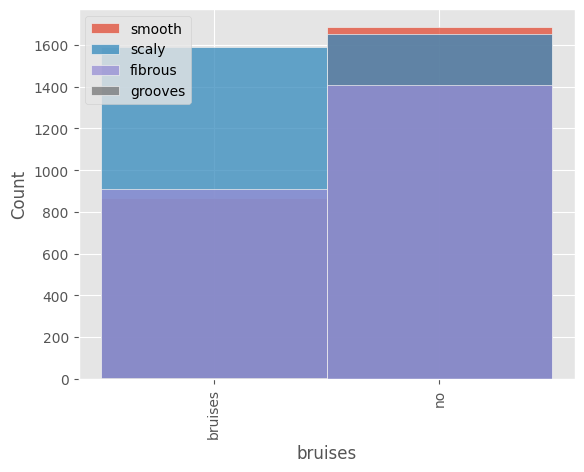

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

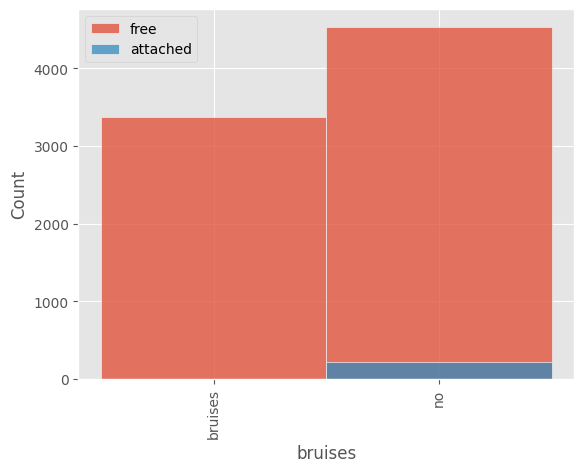

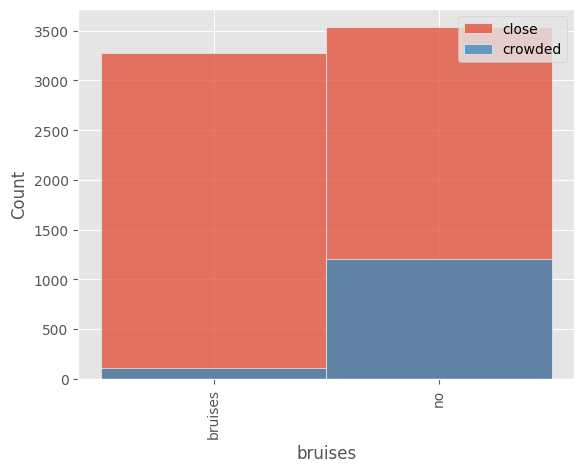

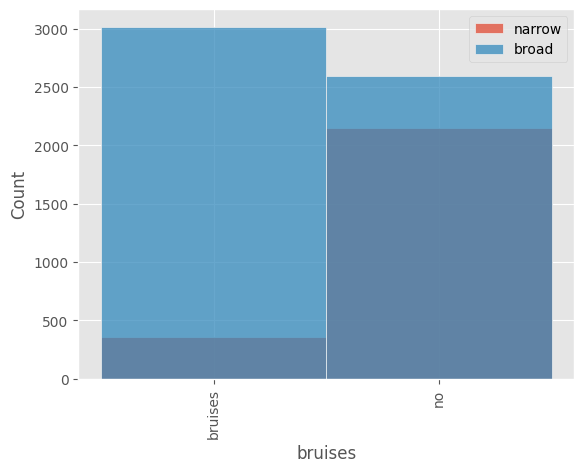

<Figure size 640x480 with 0 Axes>

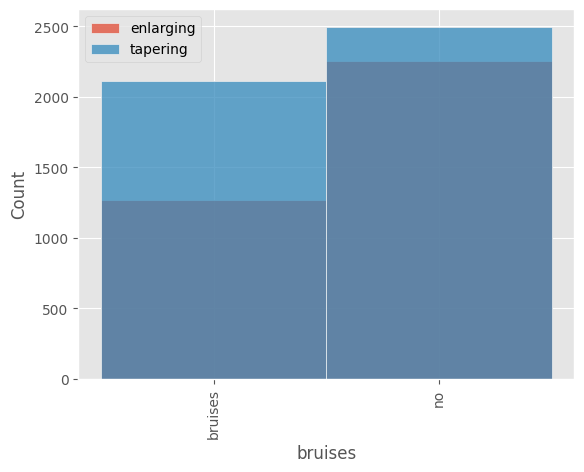

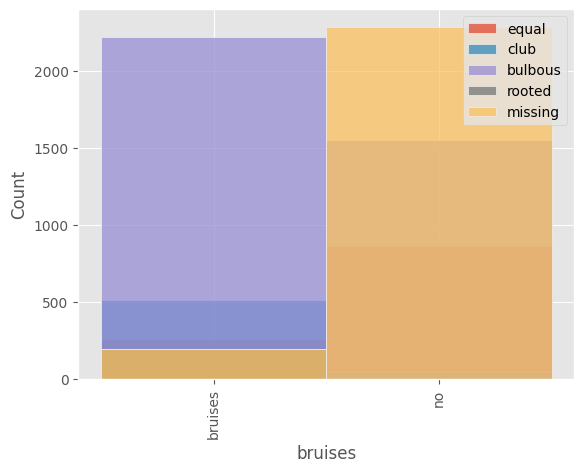

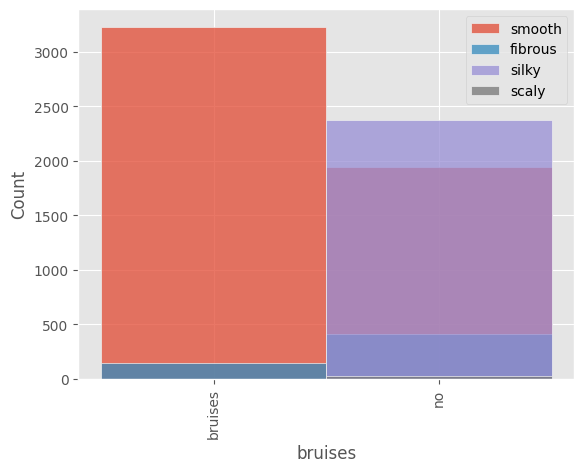

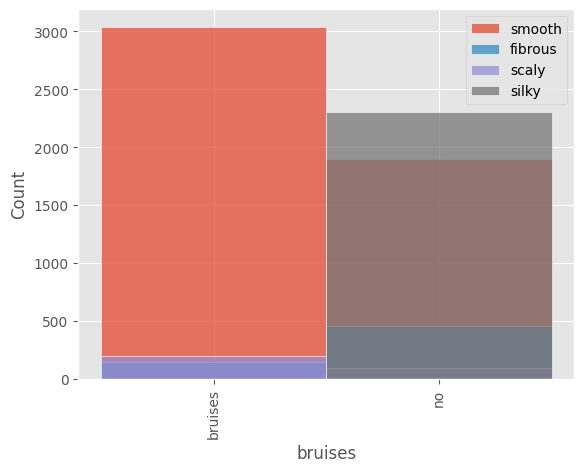

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

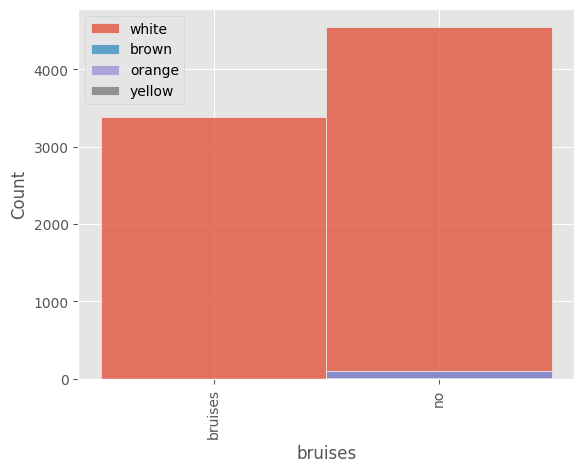

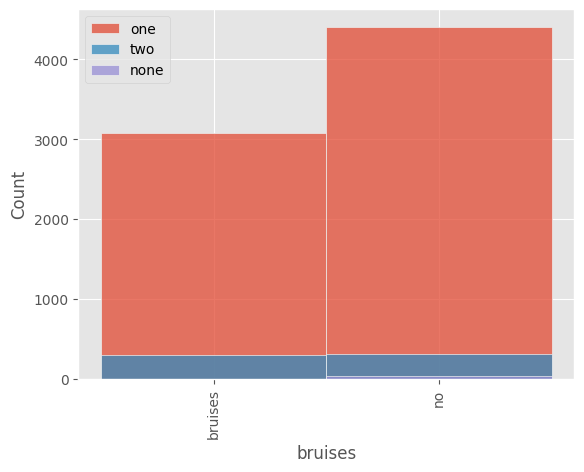

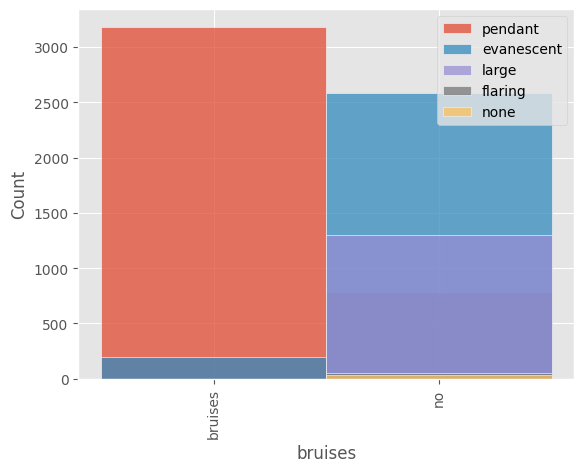

<Figure size 640x480 with 0 Axes>

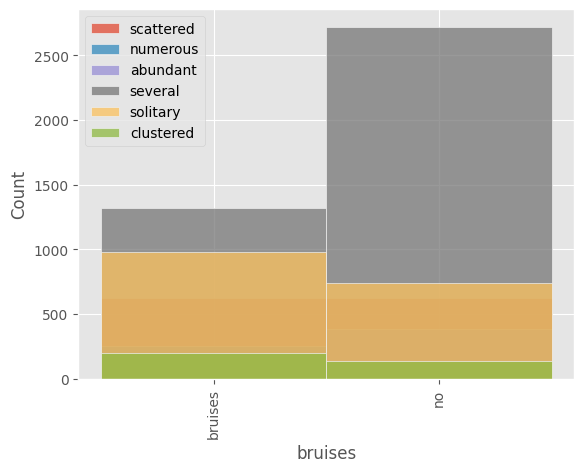

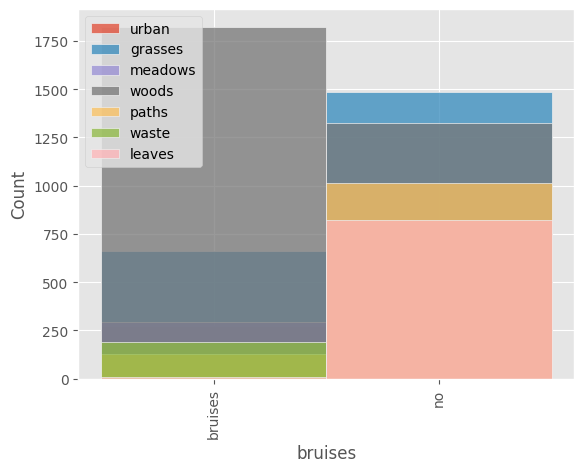

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

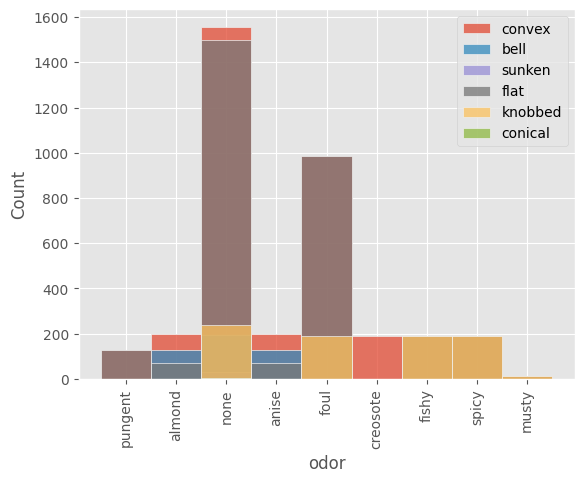

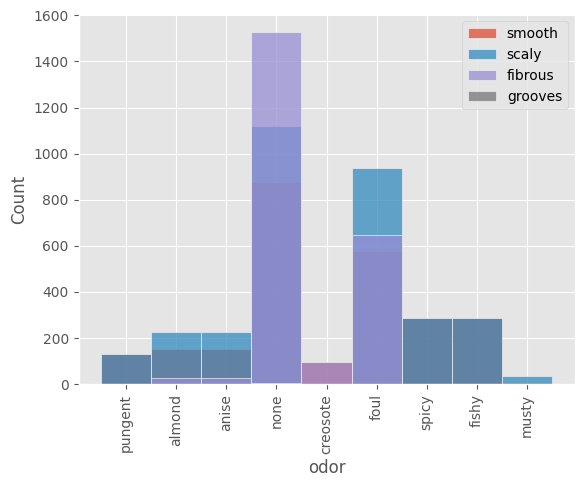

<Figure size 640x480 with 0 Axes>

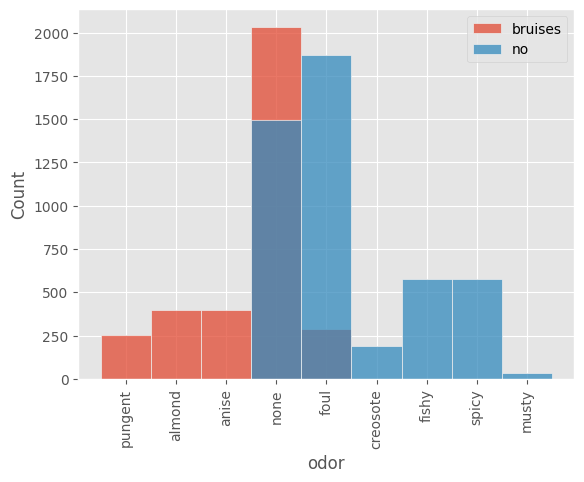

<Figure size 640x480 with 0 Axes>

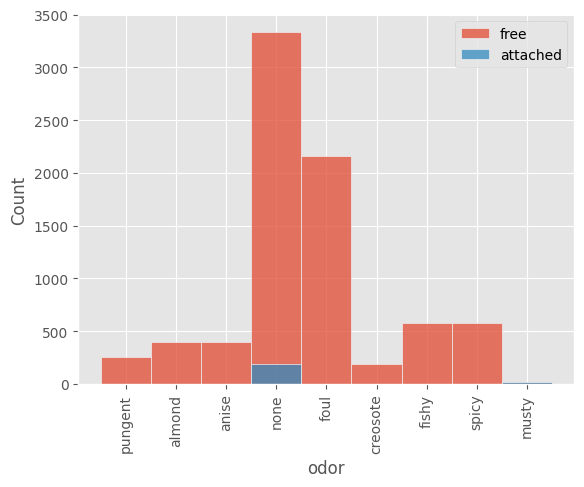

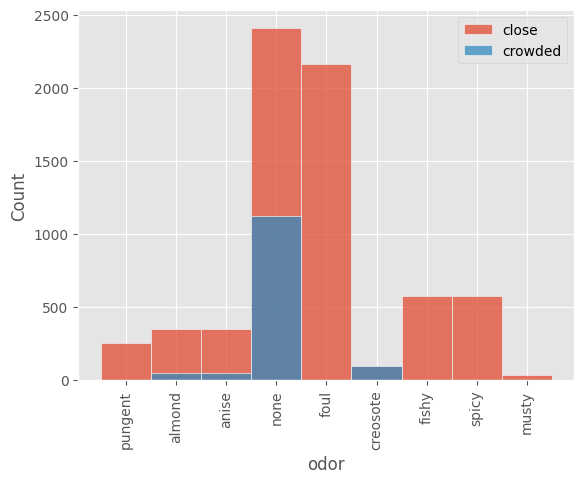

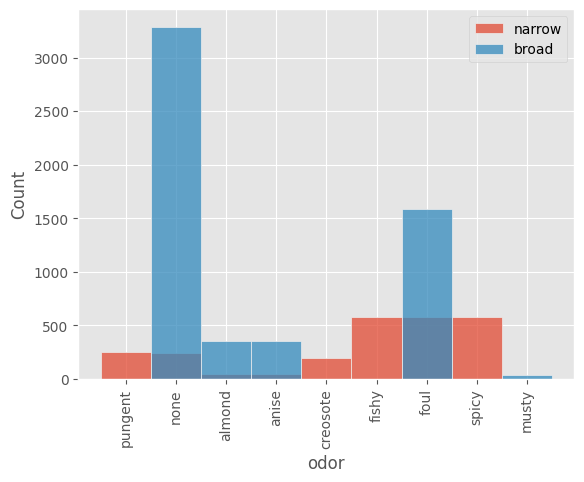

<Figure size 640x480 with 0 Axes>

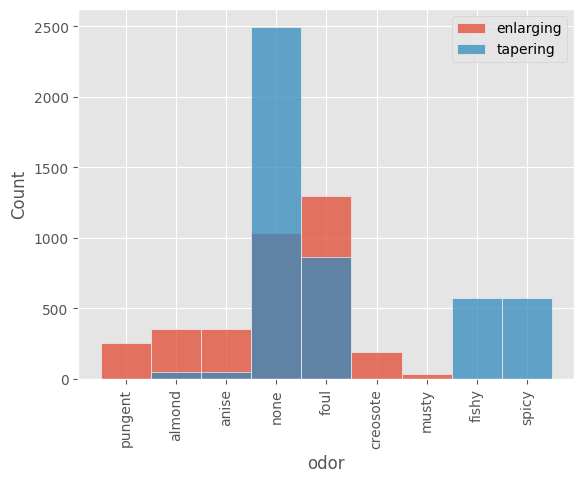

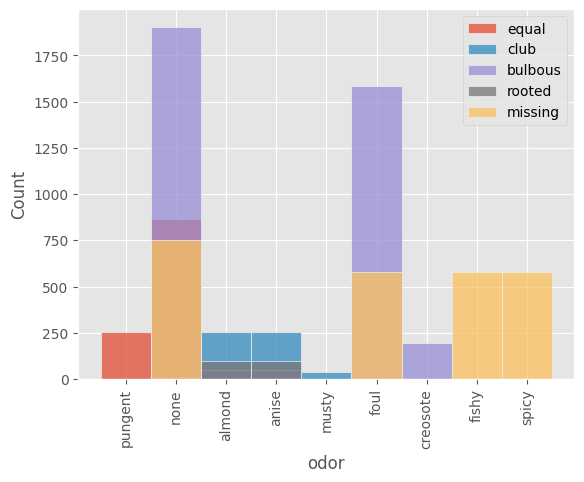

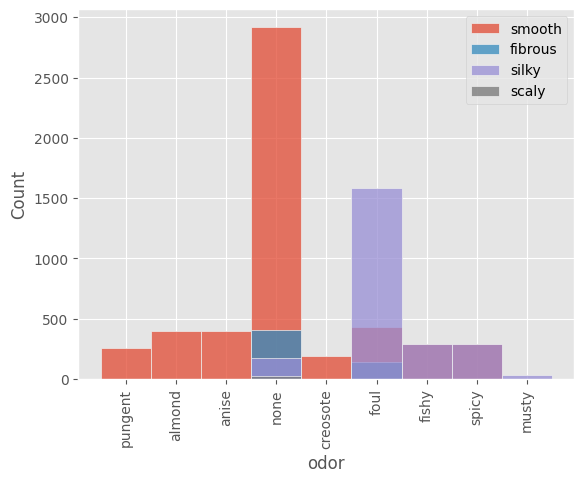

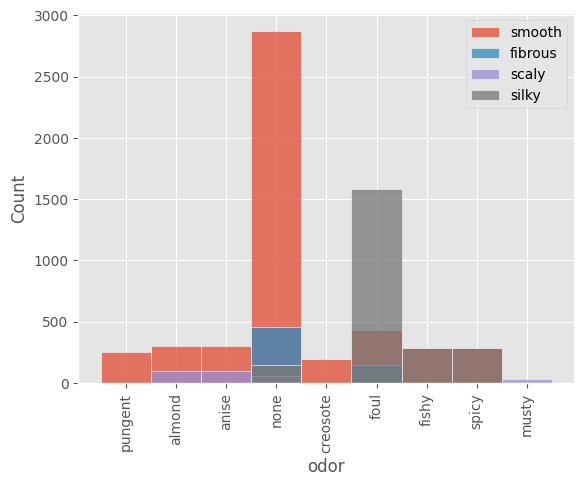

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

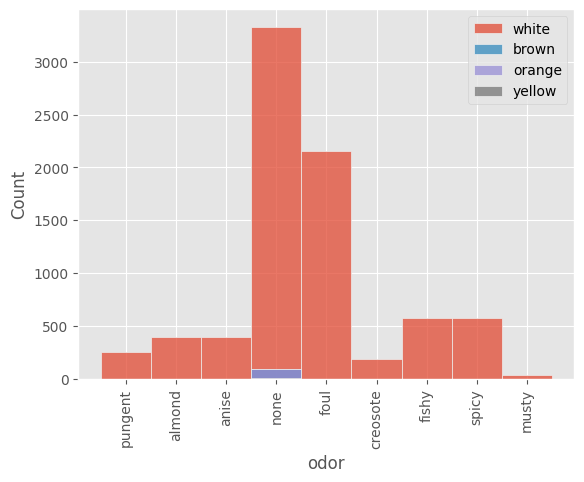

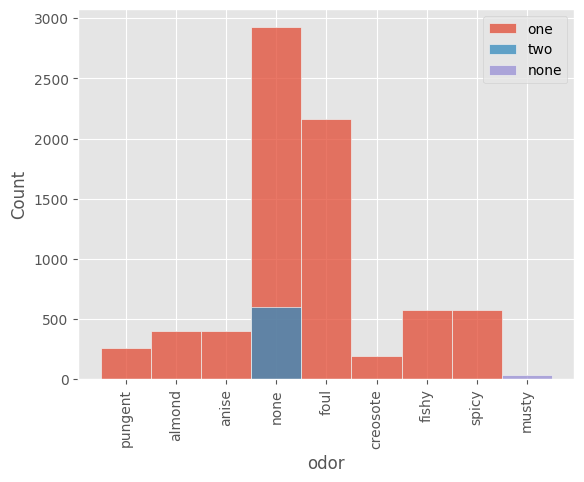

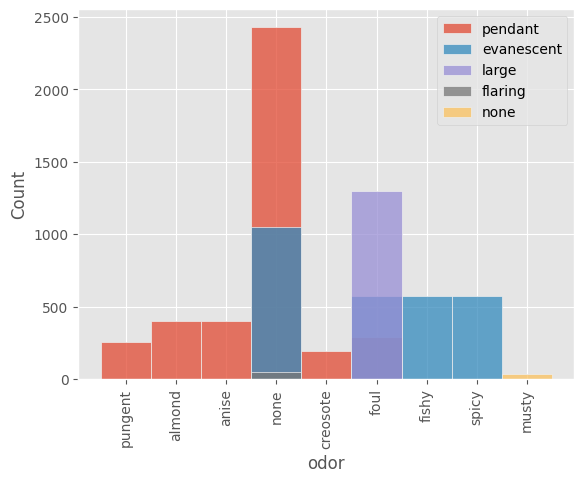

<Figure size 640x480 with 0 Axes>

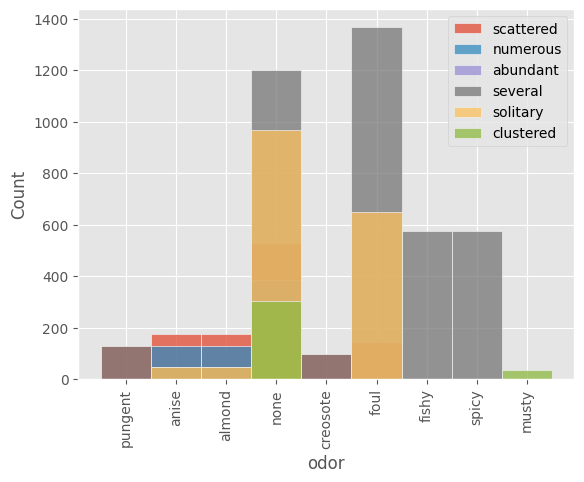

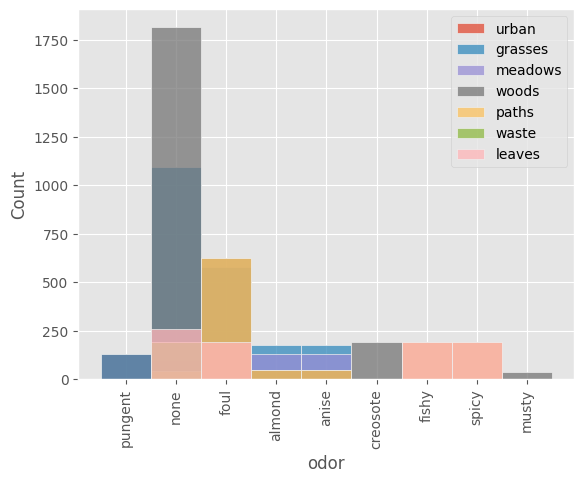

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

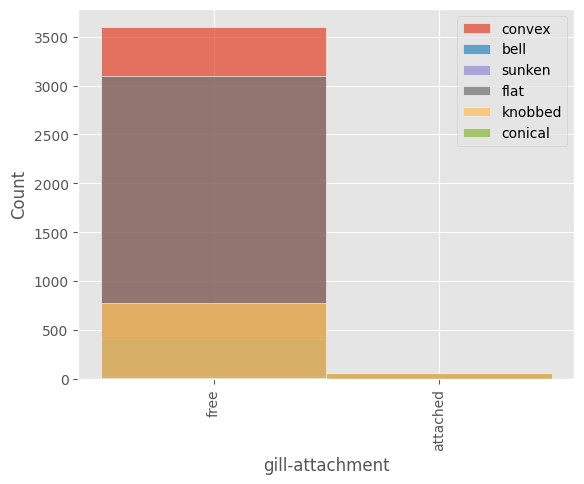

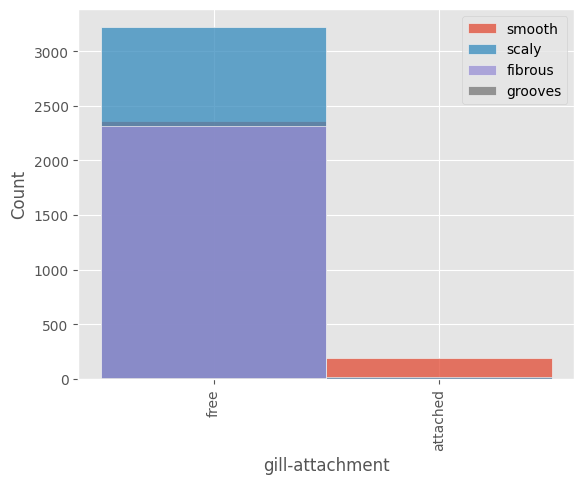

<Figure size 640x480 with 0 Axes>

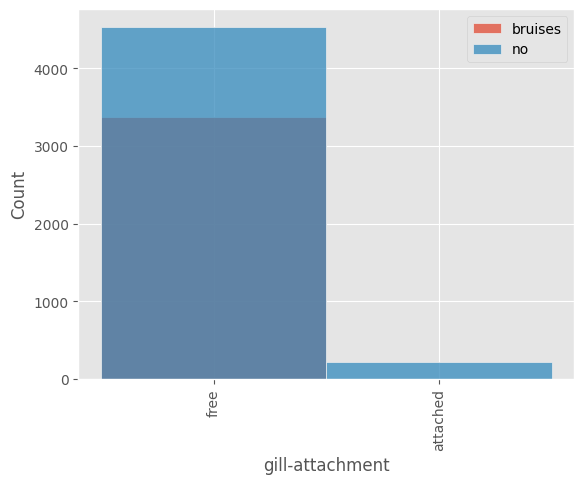

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

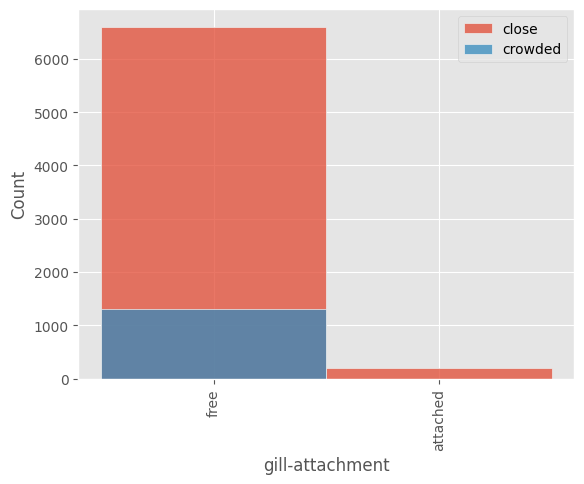

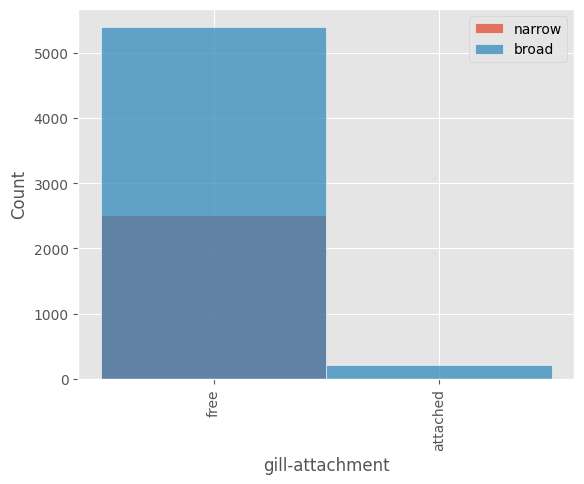

<Figure size 640x480 with 0 Axes>

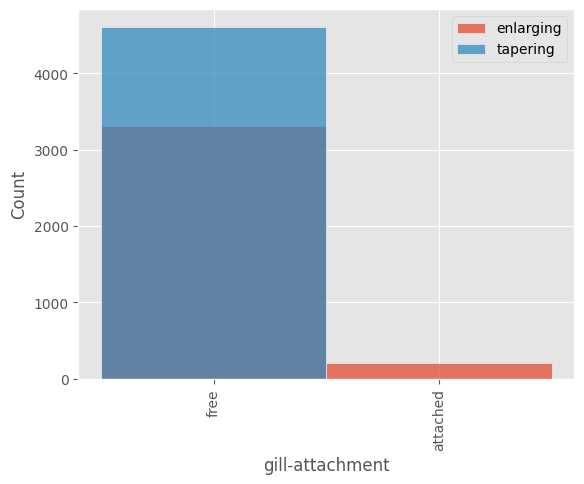

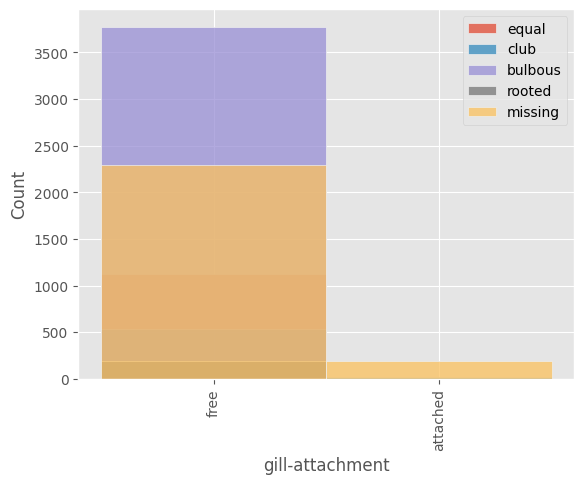

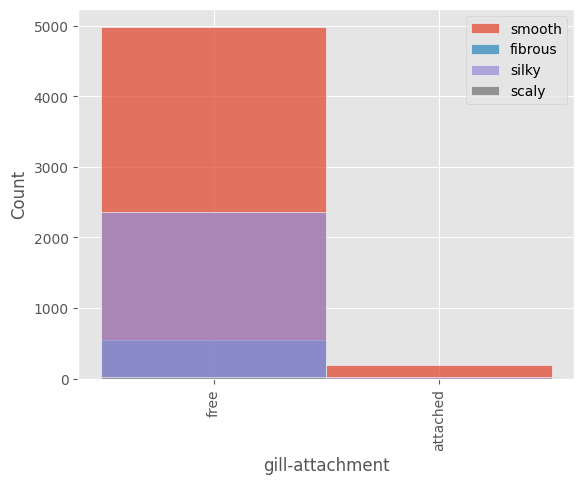

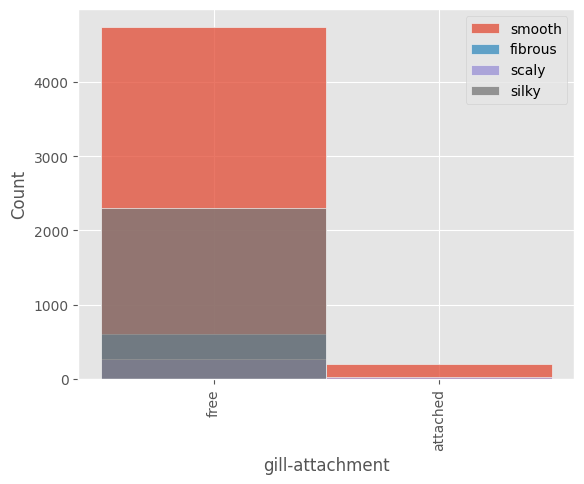

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

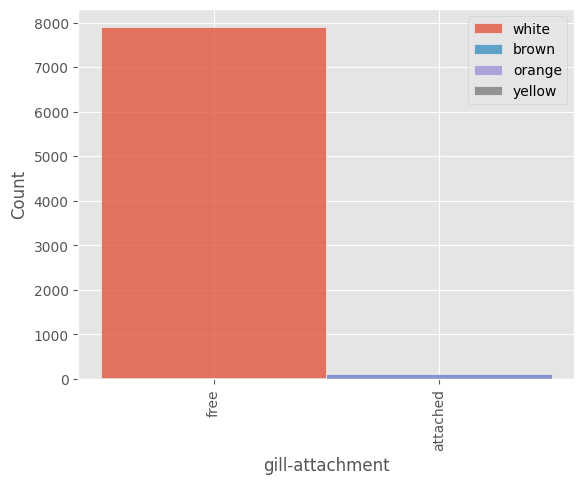

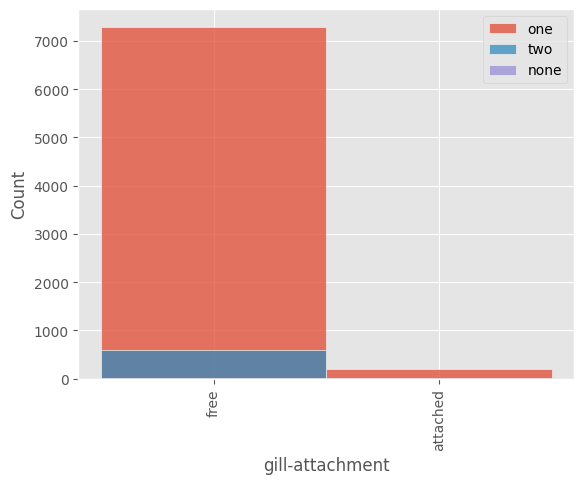

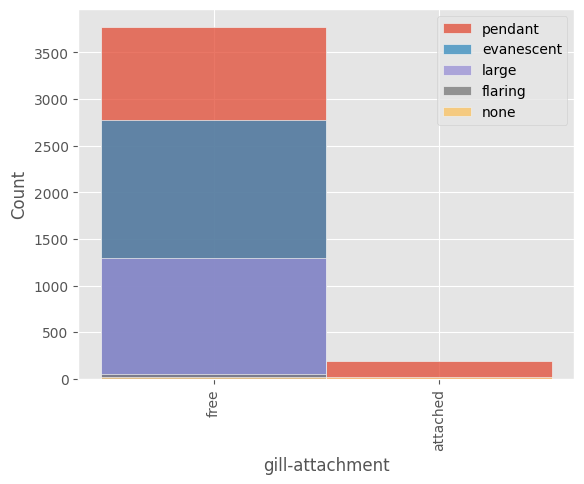

<Figure size 640x480 with 0 Axes>

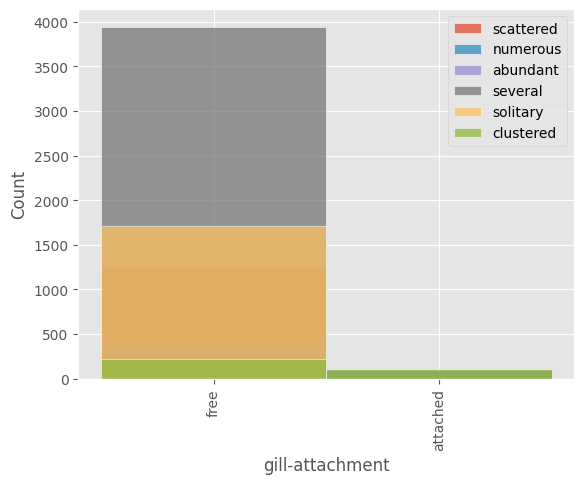

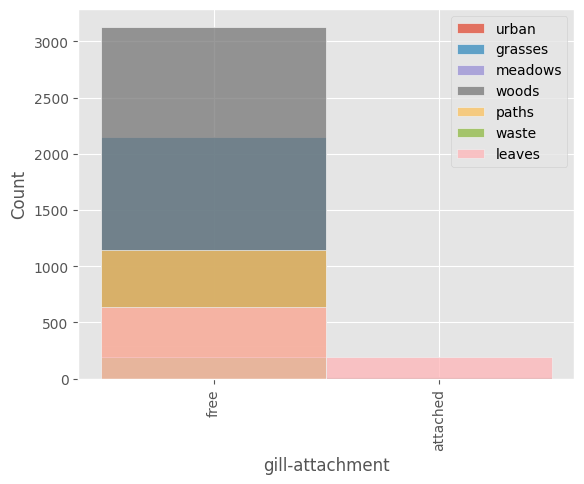

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

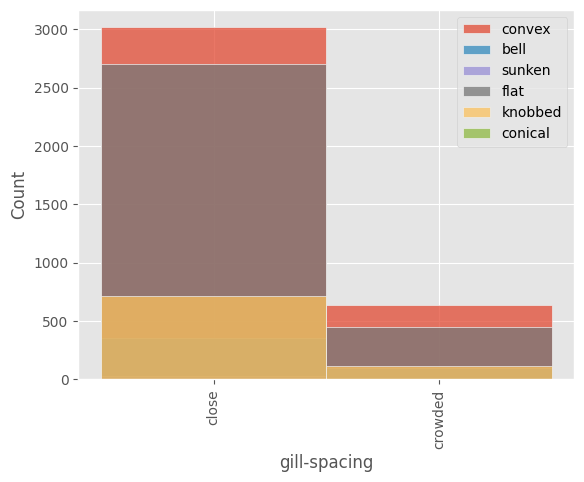

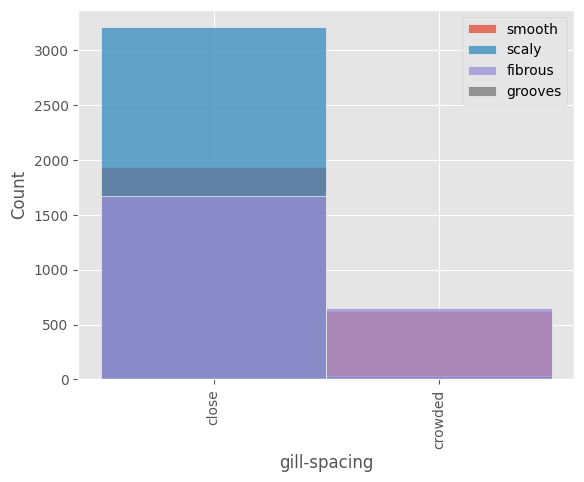

<Figure size 640x480 with 0 Axes>

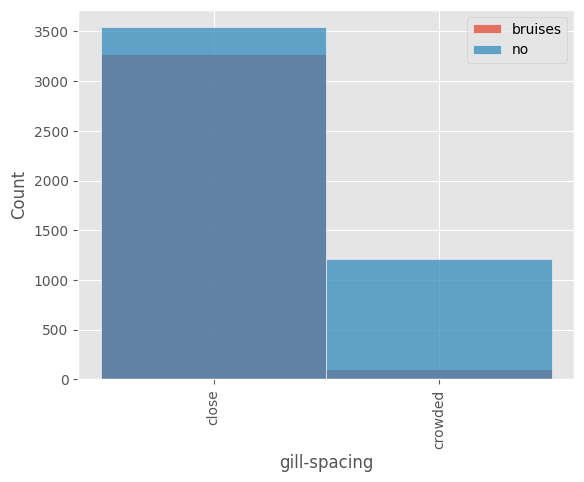

<Figure size 640x480 with 0 Axes>

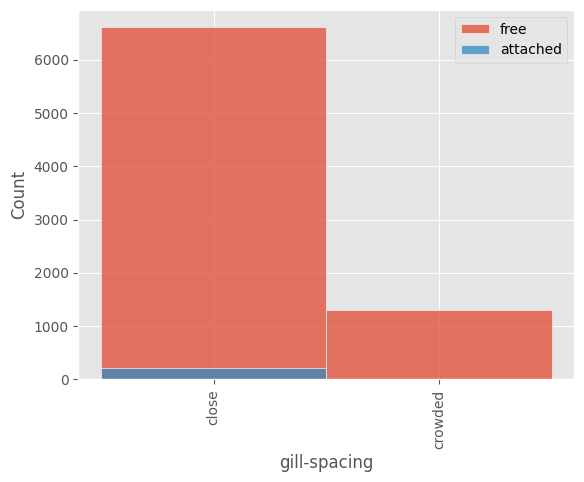

<Figure size 640x480 with 0 Axes>

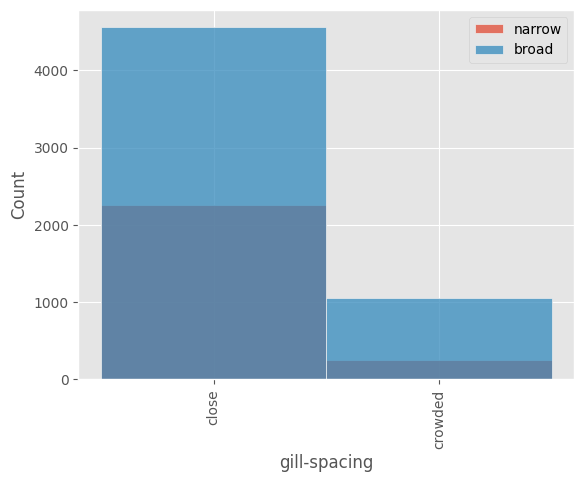

<Figure size 640x480 with 0 Axes>

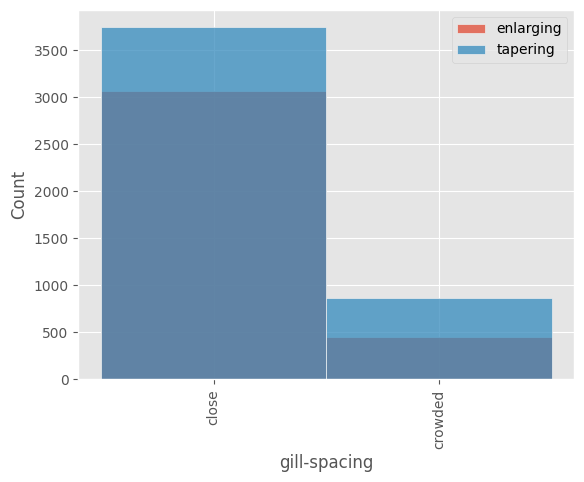

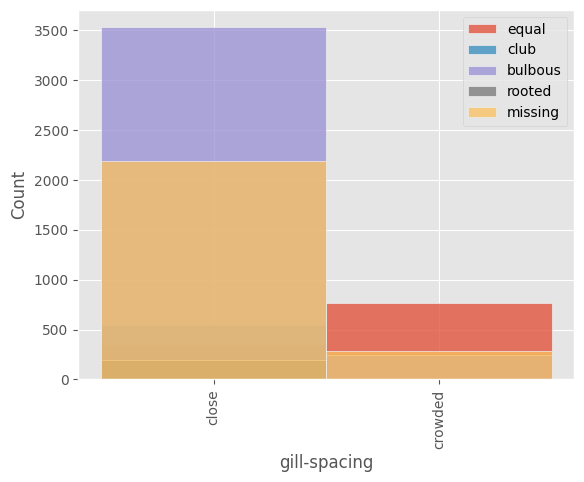

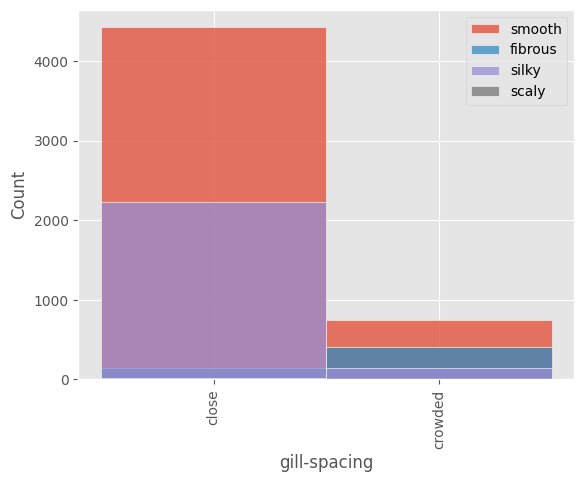

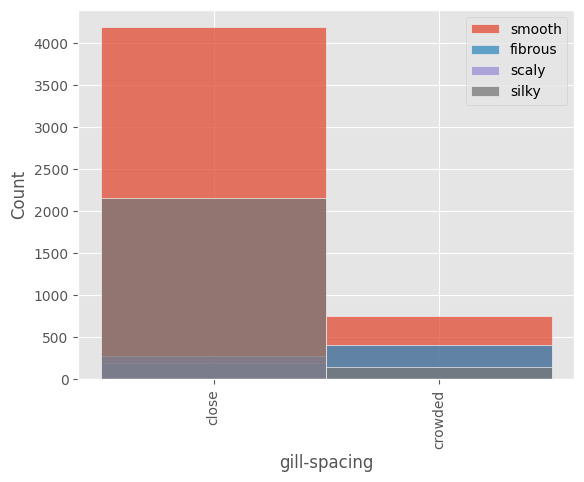

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

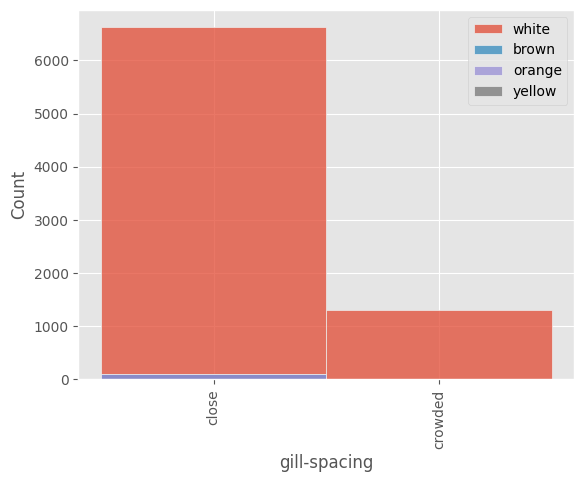

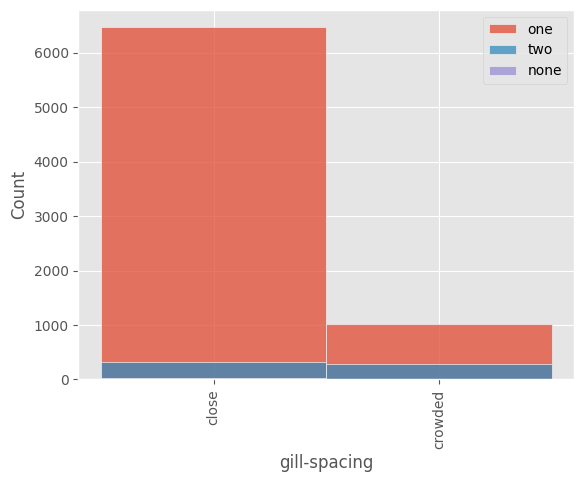

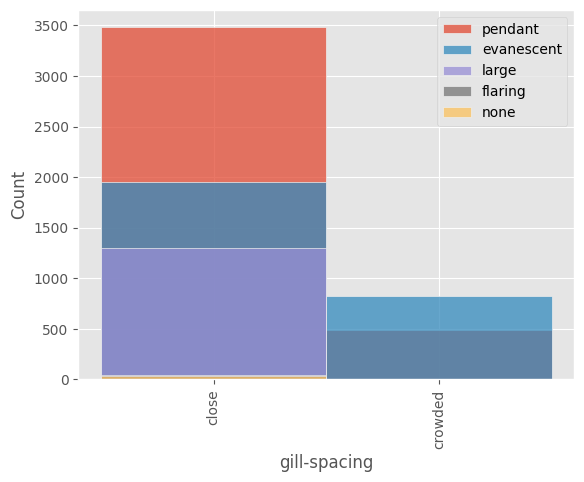

<Figure size 640x480 with 0 Axes>

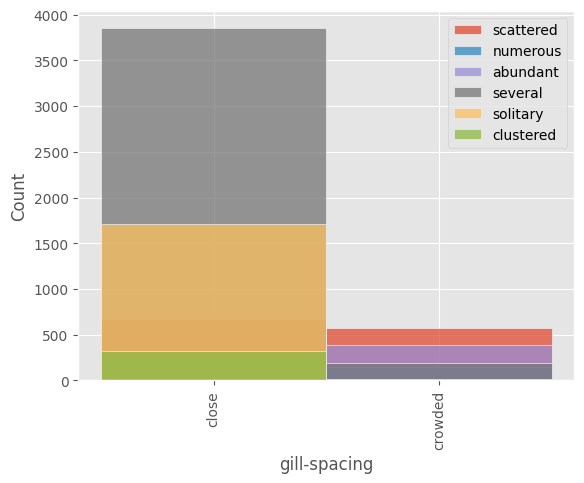

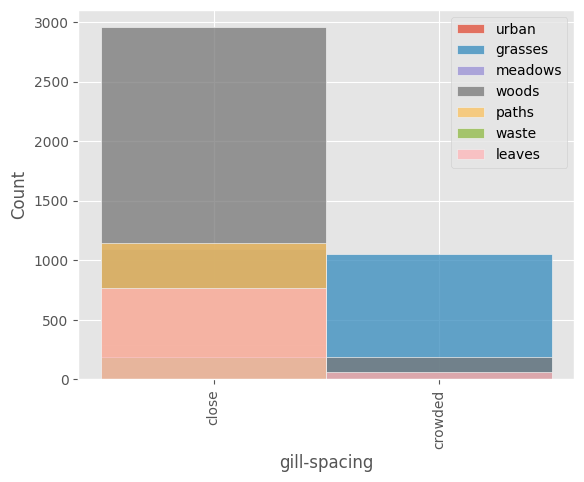

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

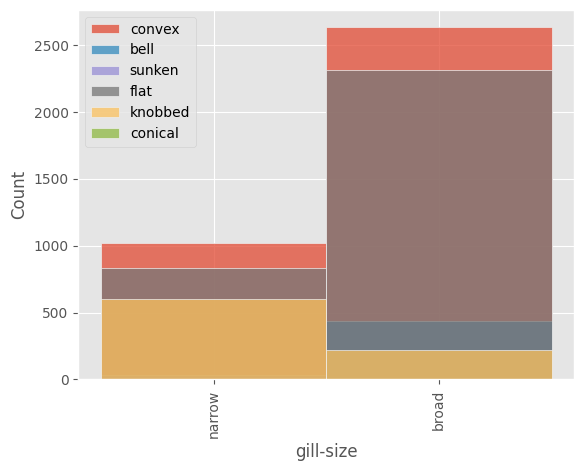

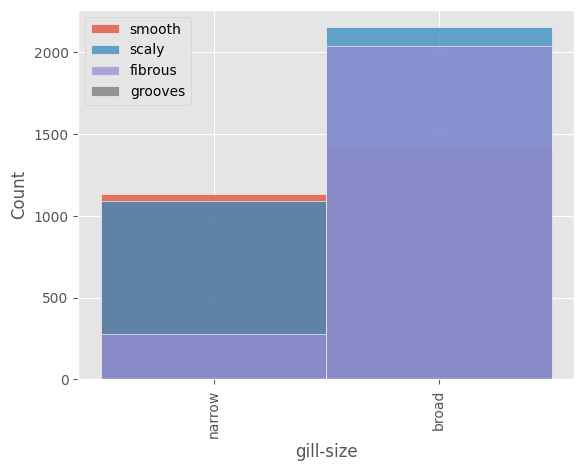

<Figure size 640x480 with 0 Axes>

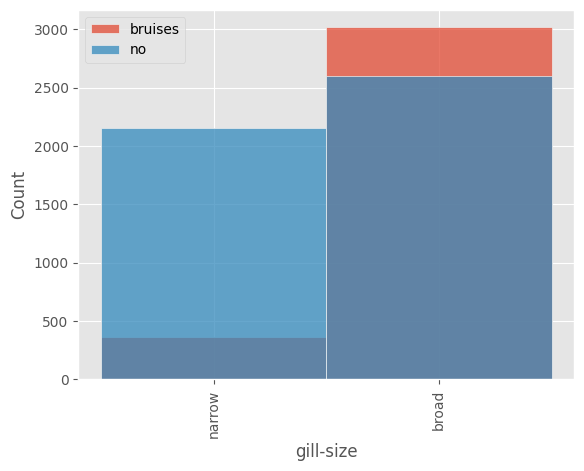

<Figure size 640x480 with 0 Axes>

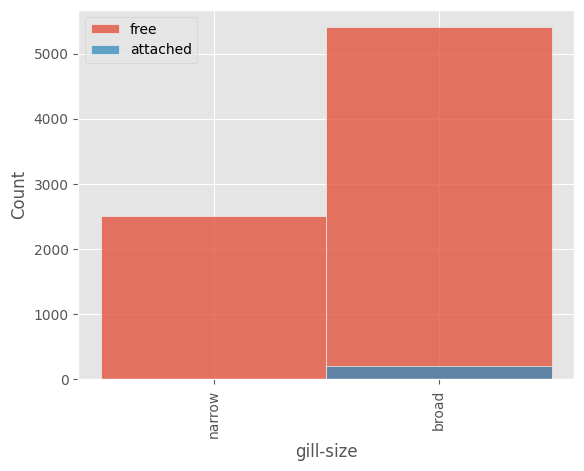

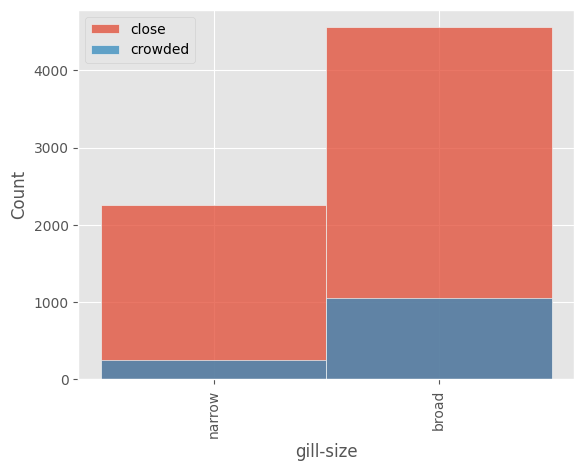

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

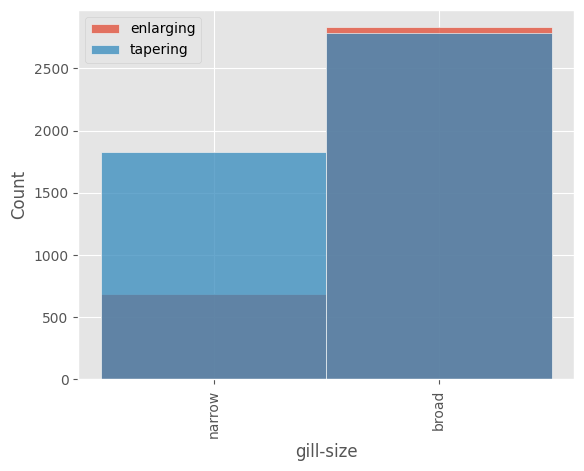

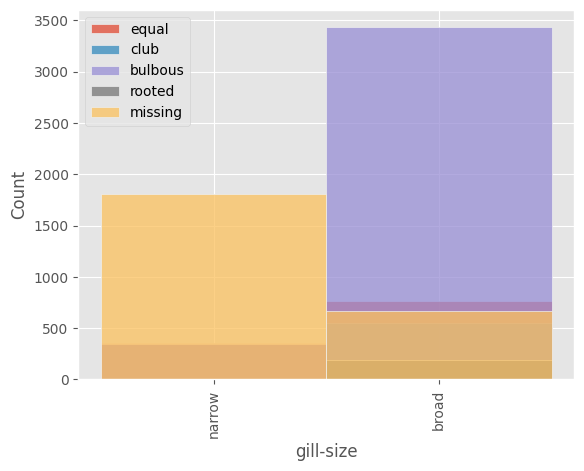

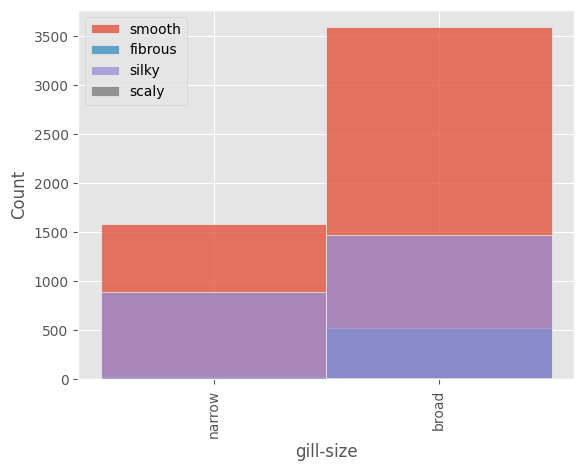

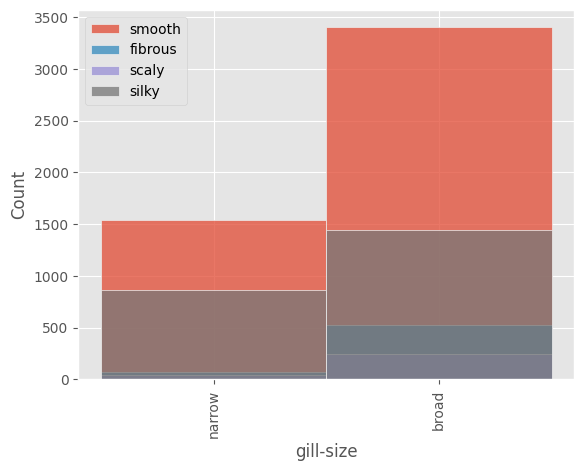

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

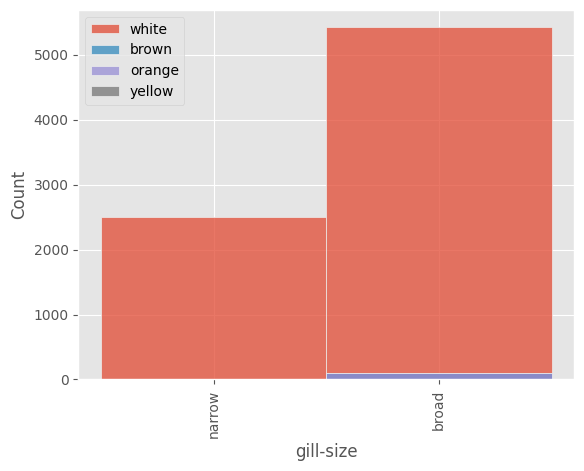

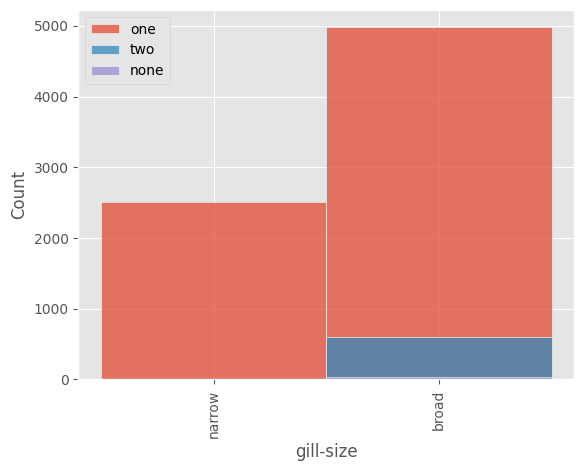

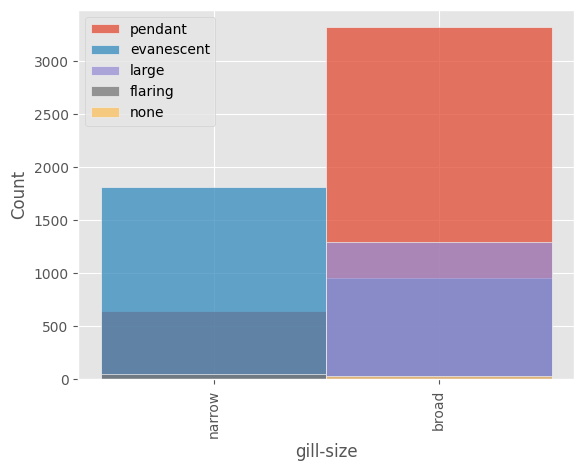

<Figure size 640x480 with 0 Axes>

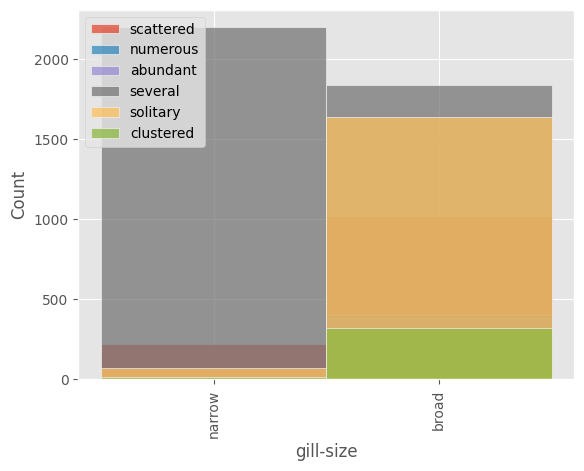

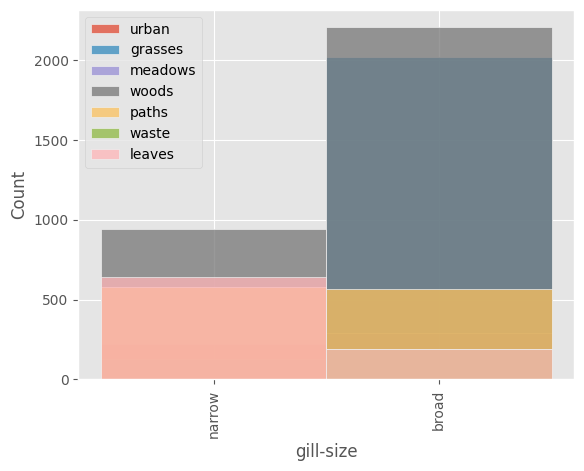

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

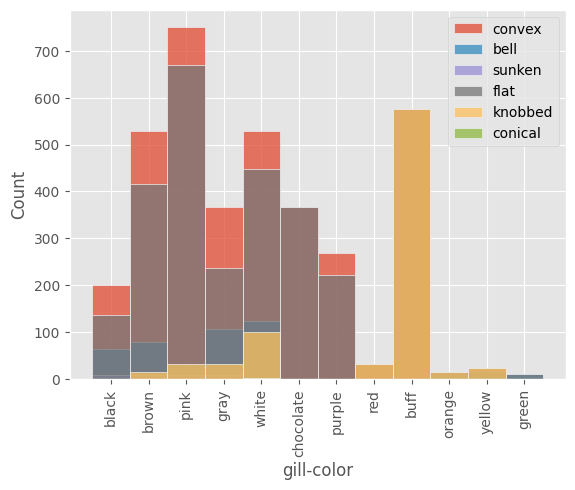

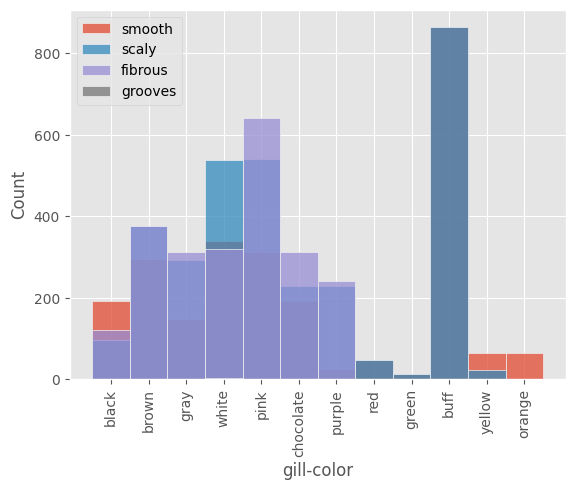

<Figure size 640x480 with 0 Axes>

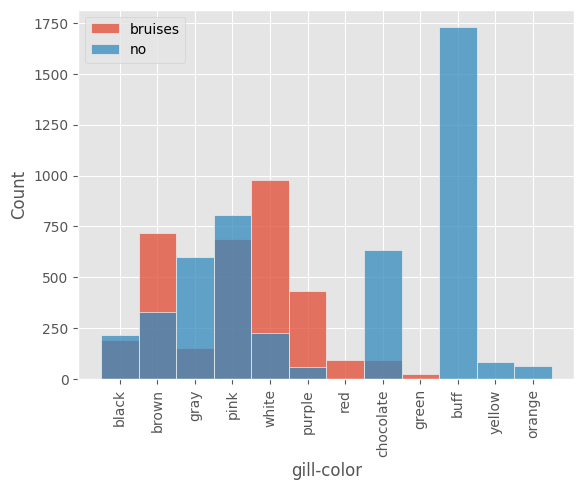

<Figure size 640x480 with 0 Axes>

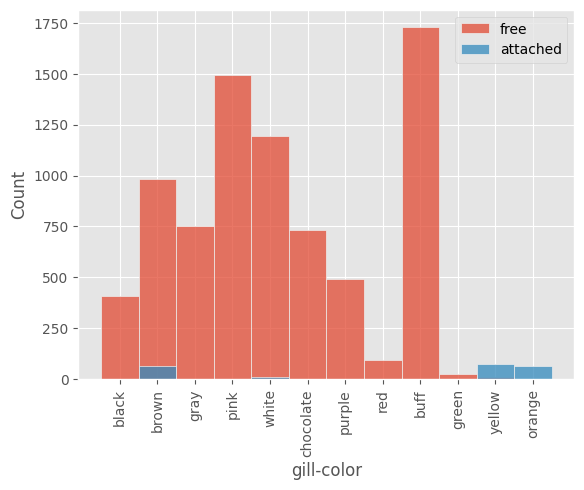

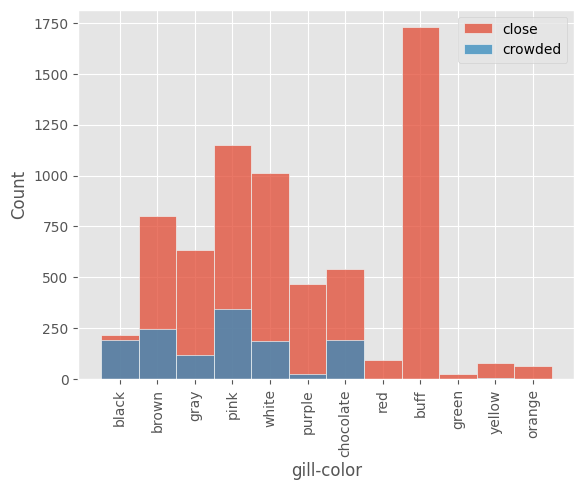

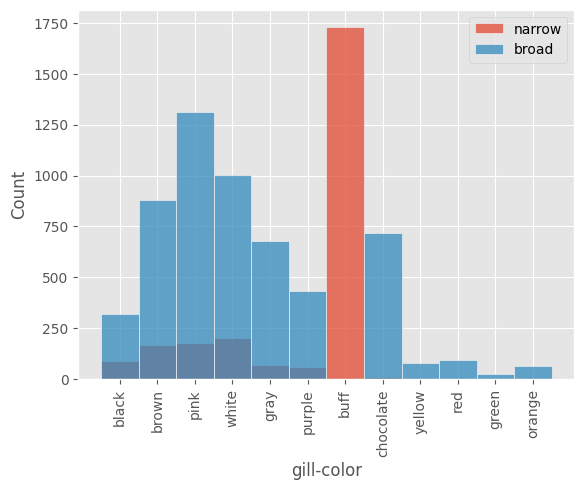

<Figure size 640x480 with 0 Axes>

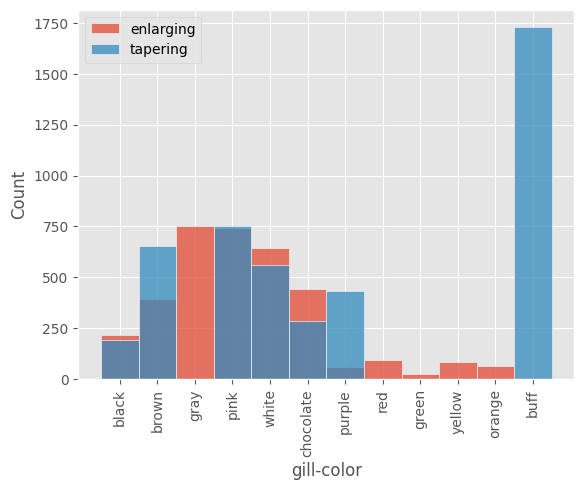

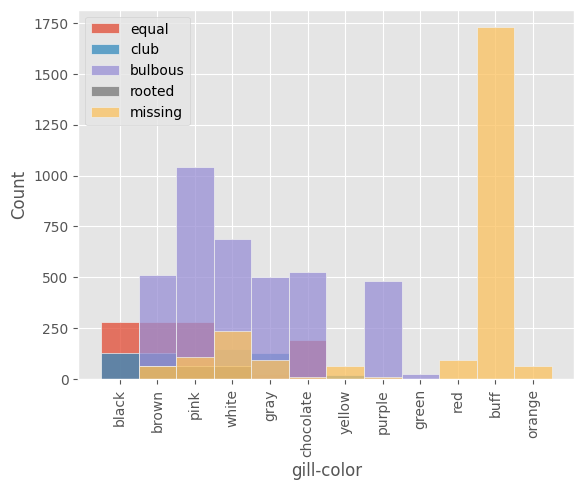

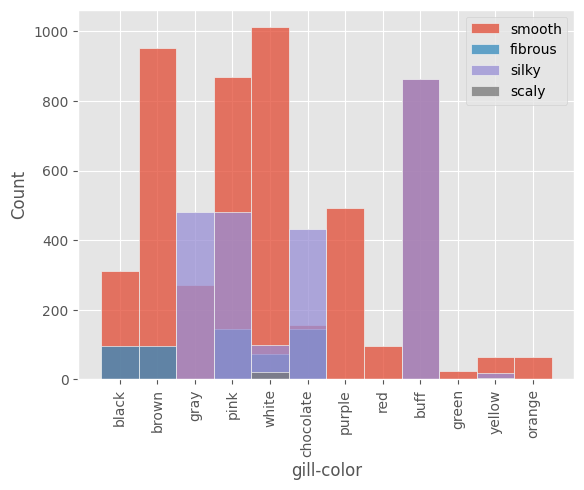

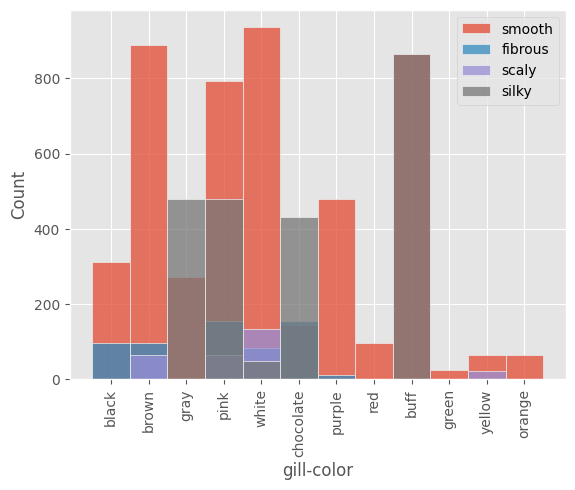

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

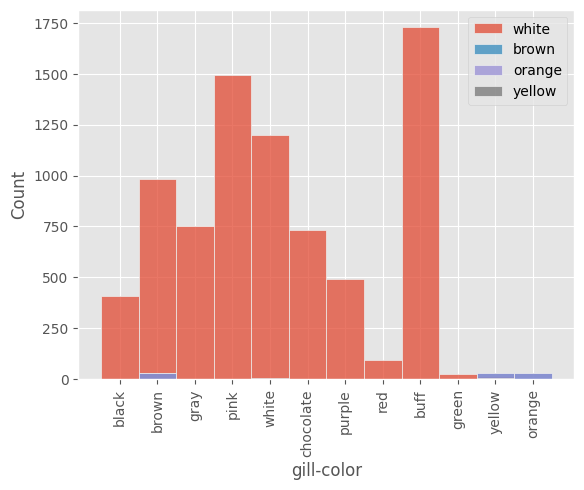

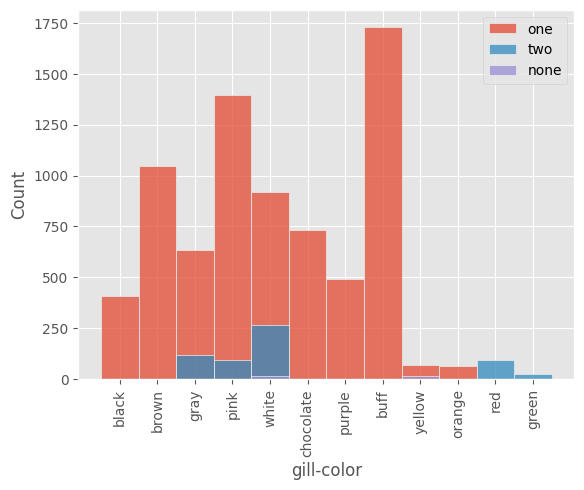

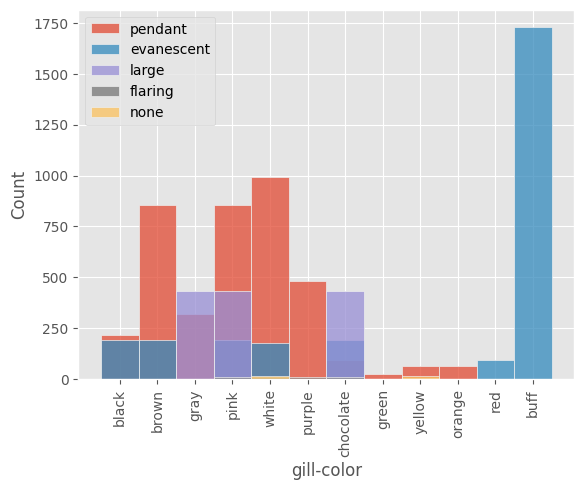

<Figure size 640x480 with 0 Axes>

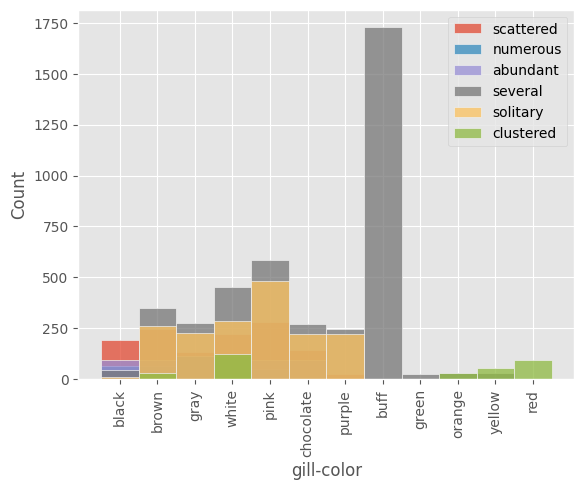

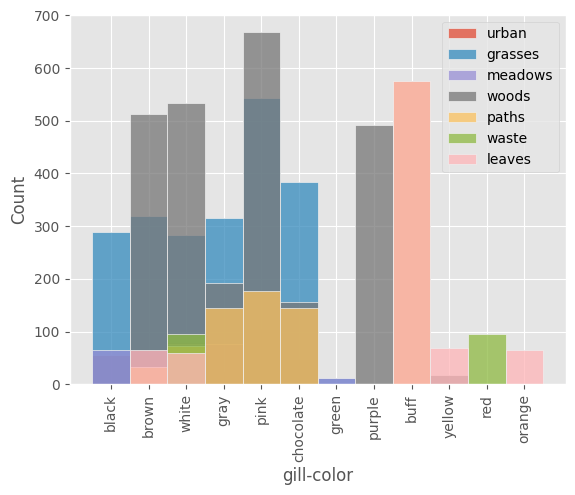

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

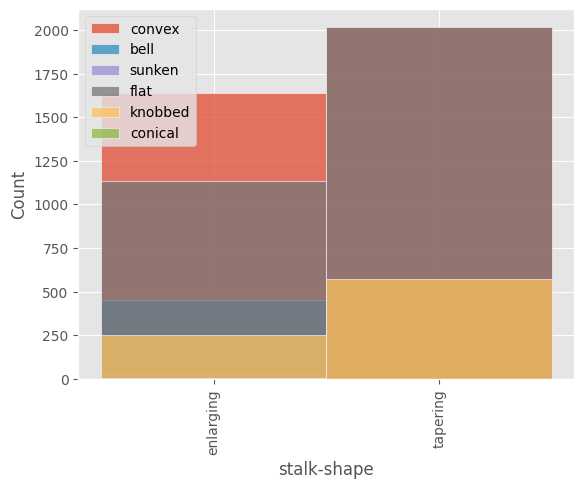

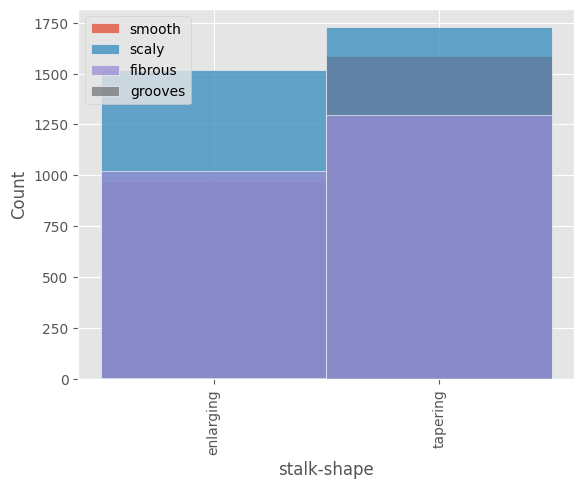

<Figure size 640x480 with 0 Axes>

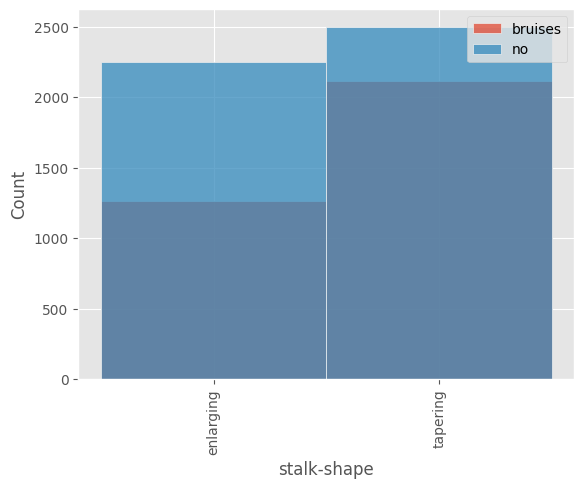

<Figure size 640x480 with 0 Axes>

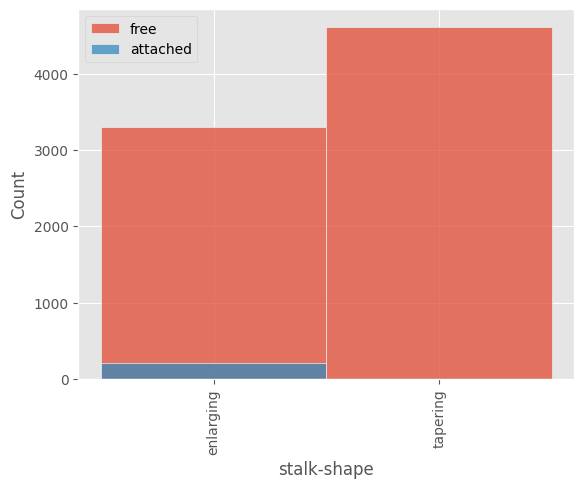

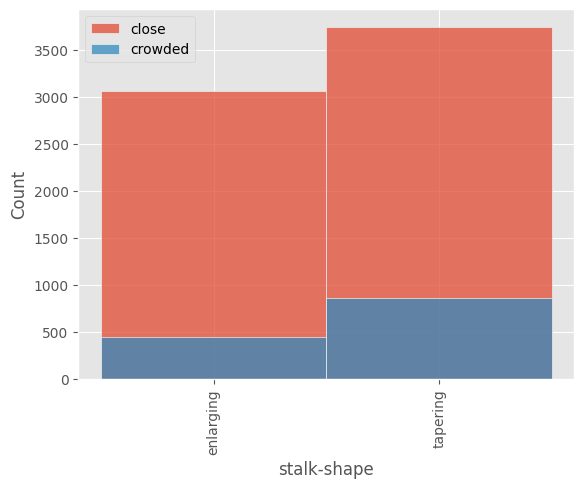

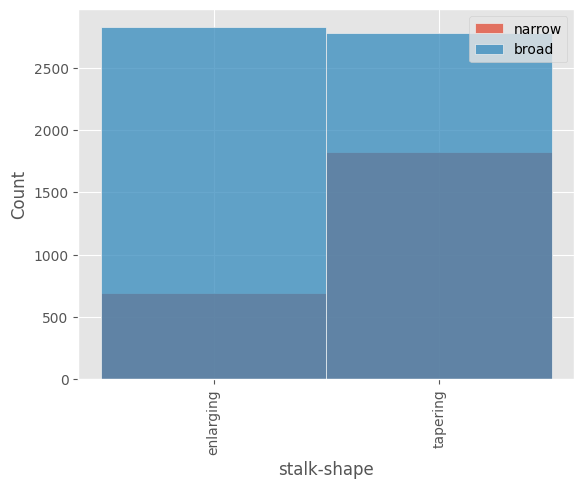

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

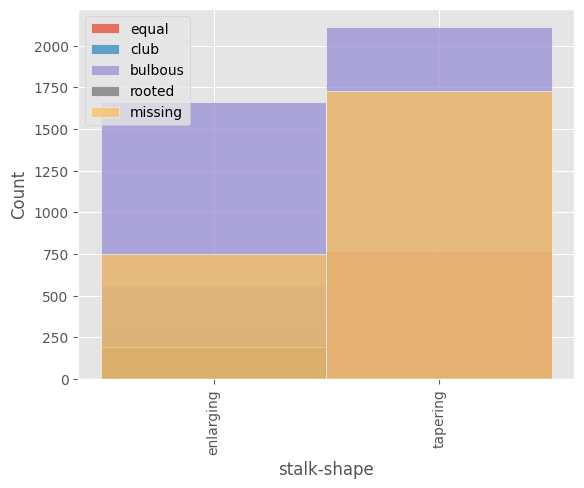

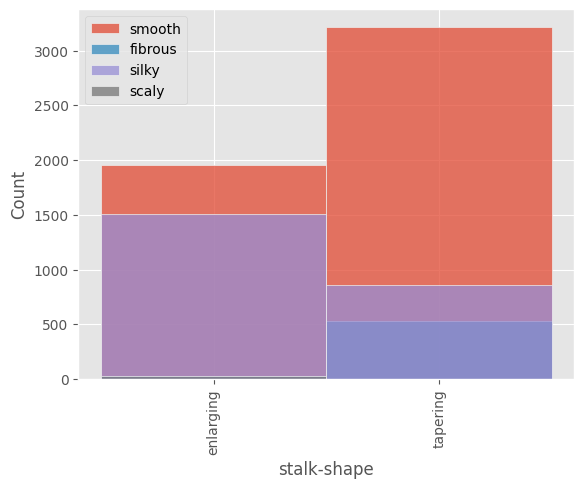

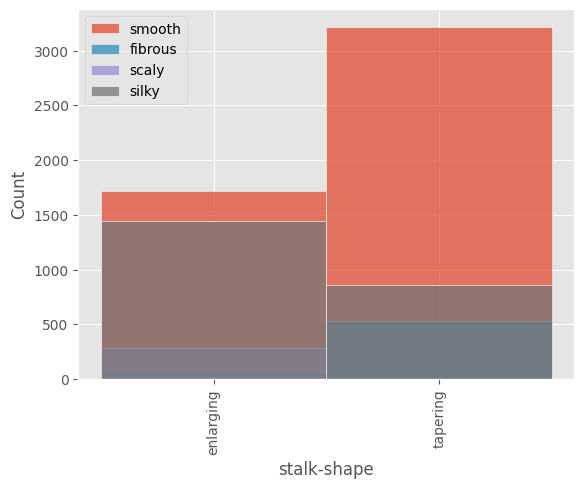

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

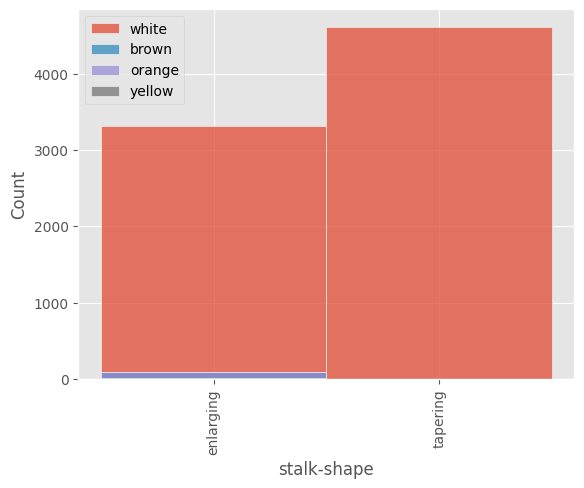

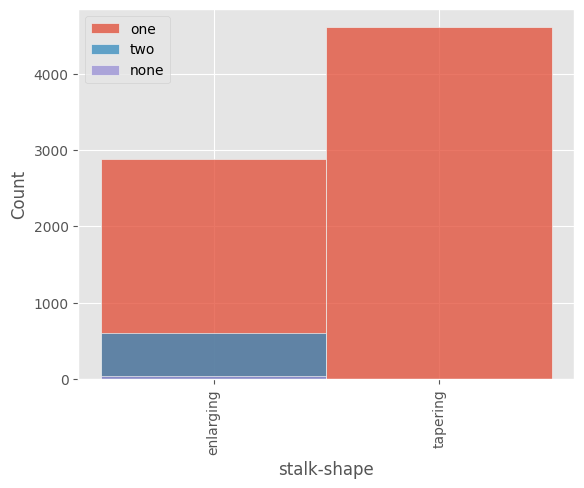

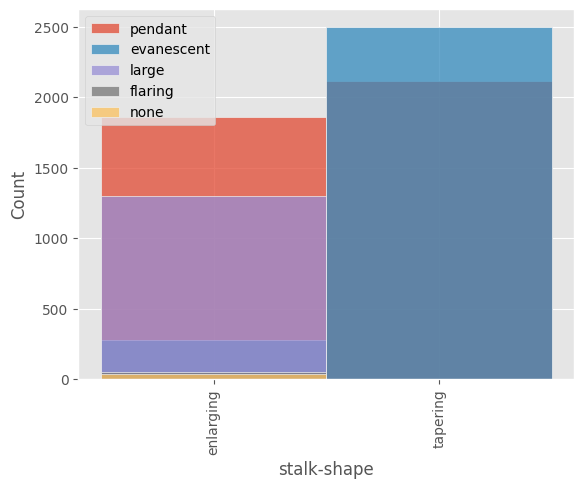

<Figure size 640x480 with 0 Axes>

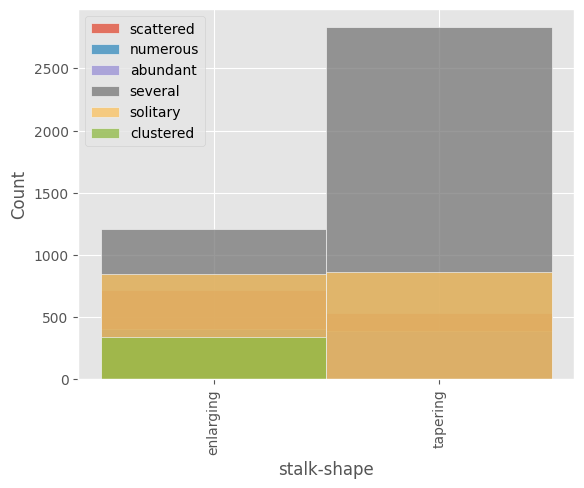

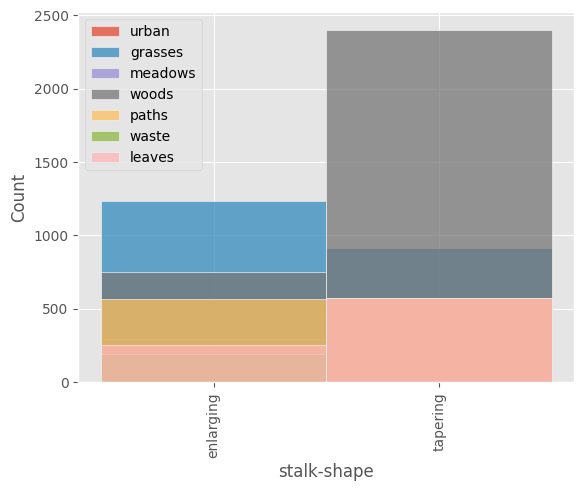

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

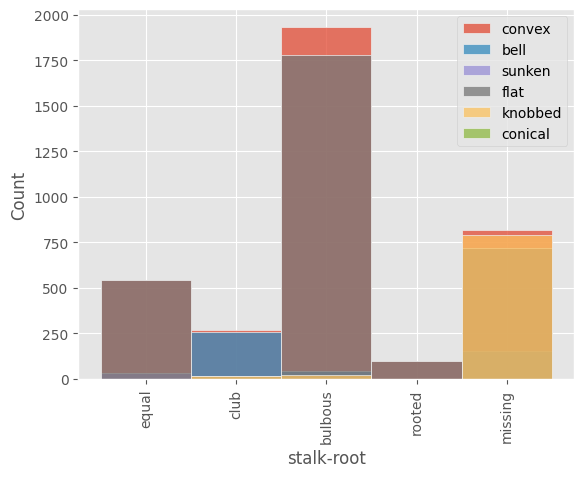

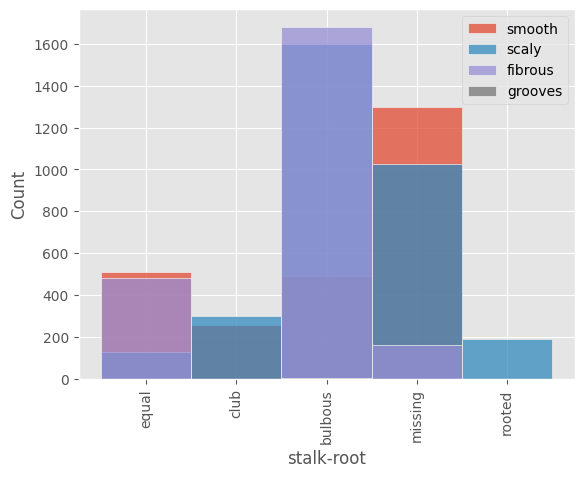

<Figure size 640x480 with 0 Axes>

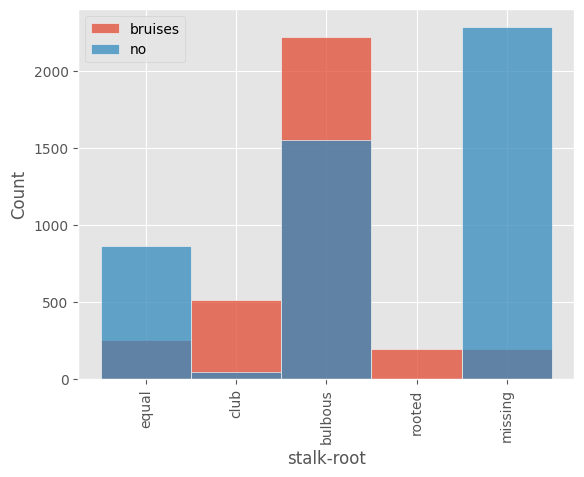

<Figure size 640x480 with 0 Axes>

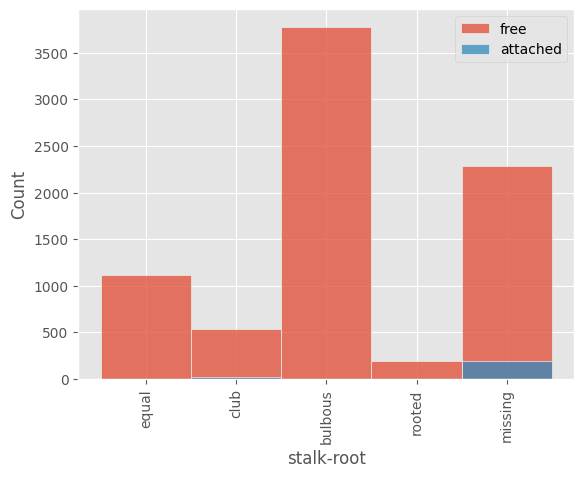

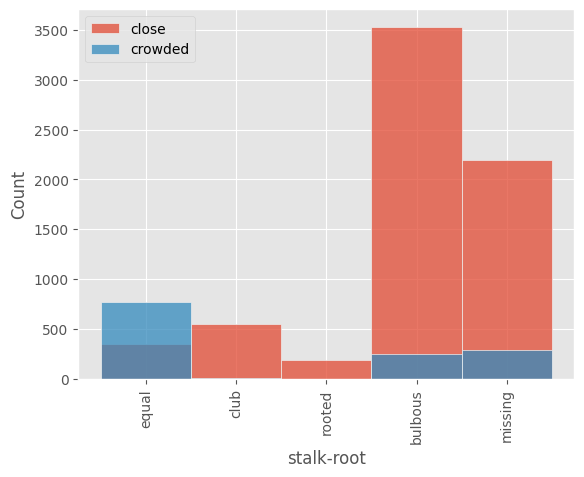

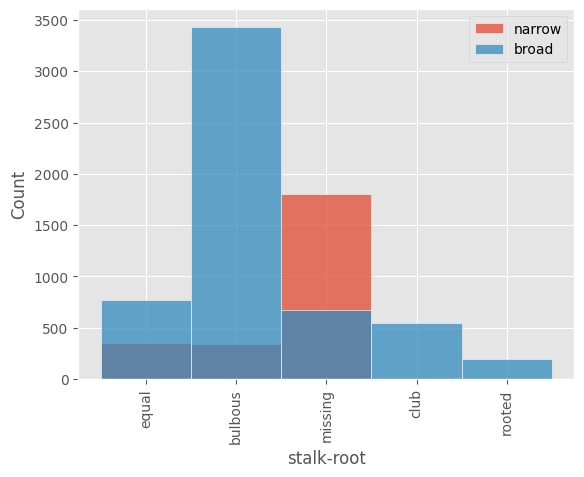

<Figure size 640x480 with 0 Axes>

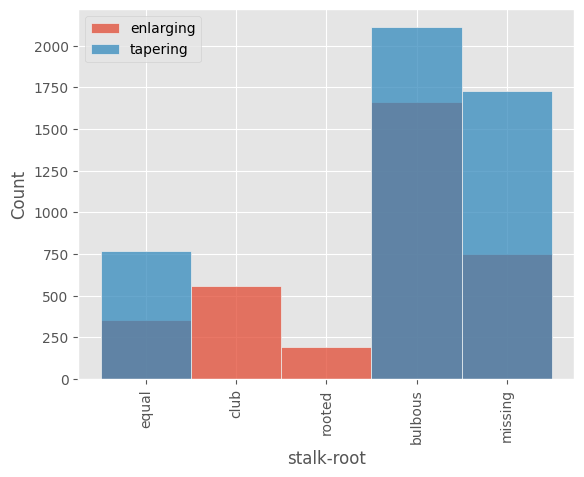

<Figure size 640x480 with 0 Axes>

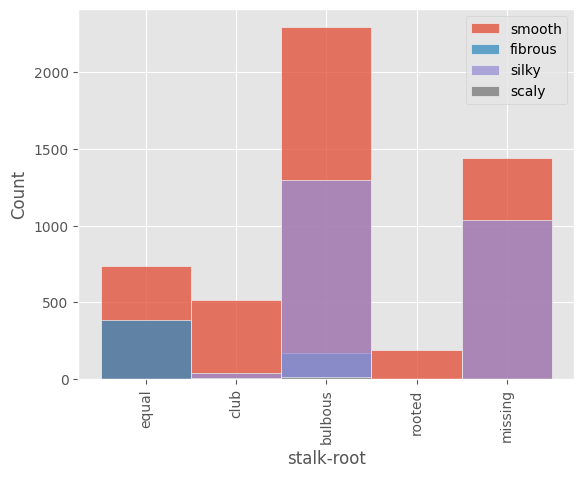

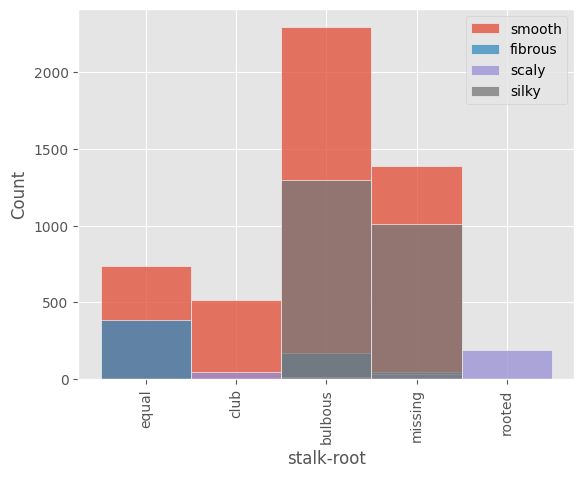

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

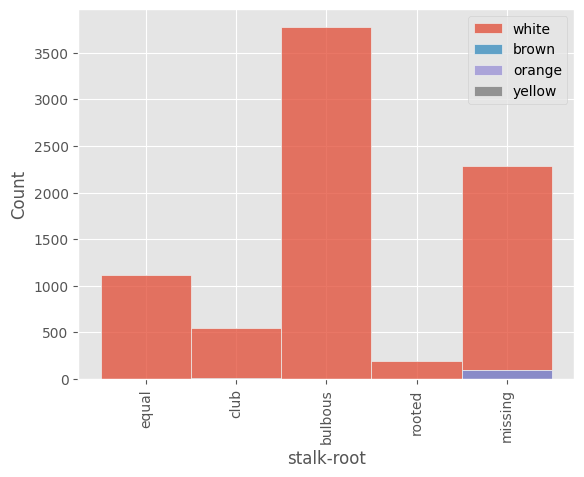

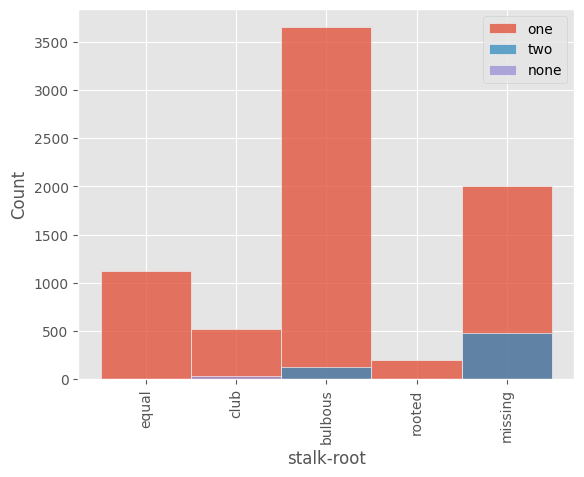

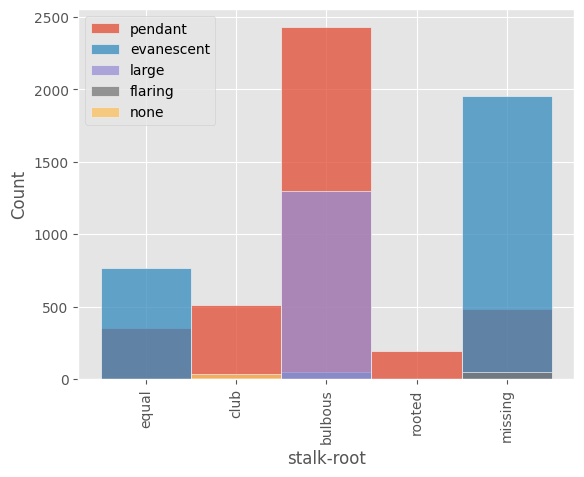

<Figure size 640x480 with 0 Axes>

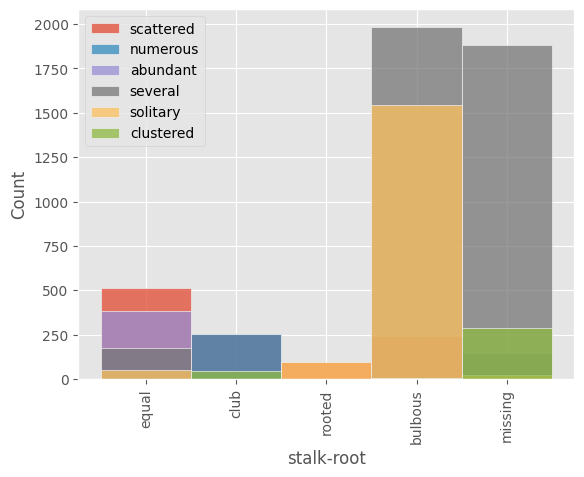

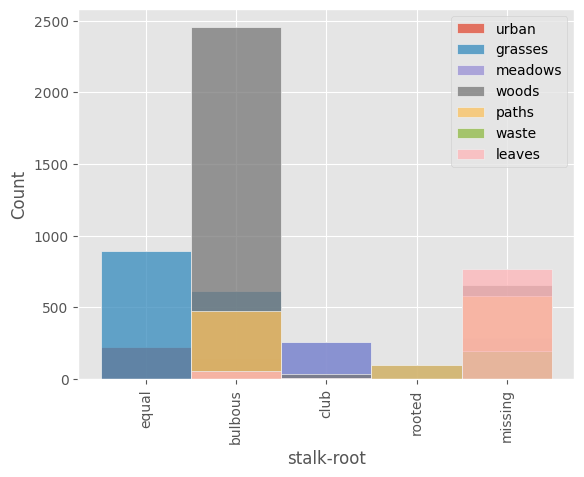

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

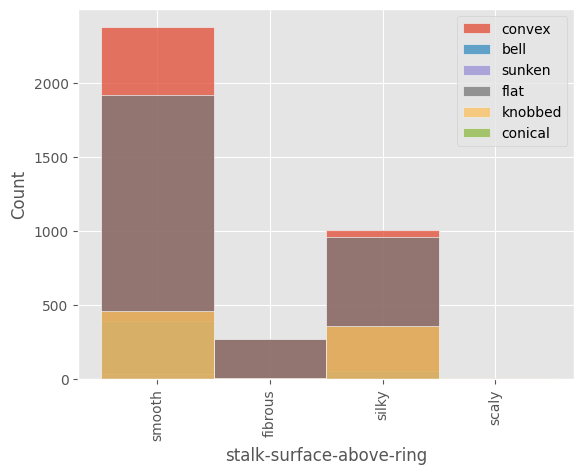

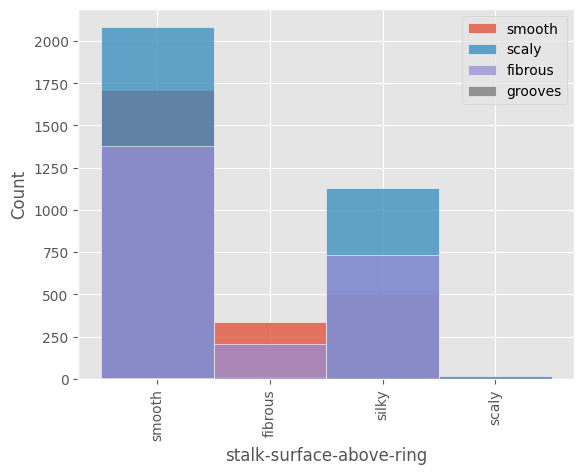

<Figure size 640x480 with 0 Axes>

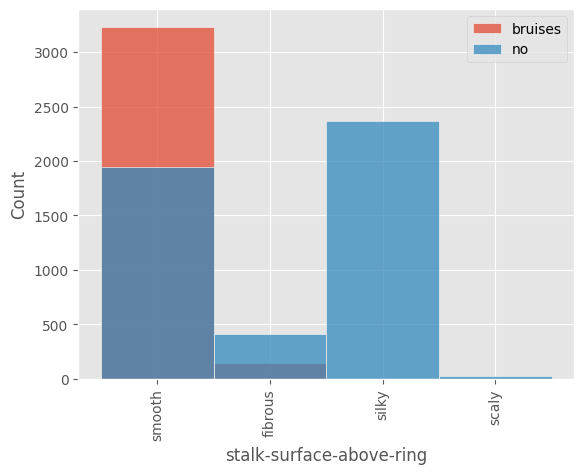

<Figure size 640x480 with 0 Axes>

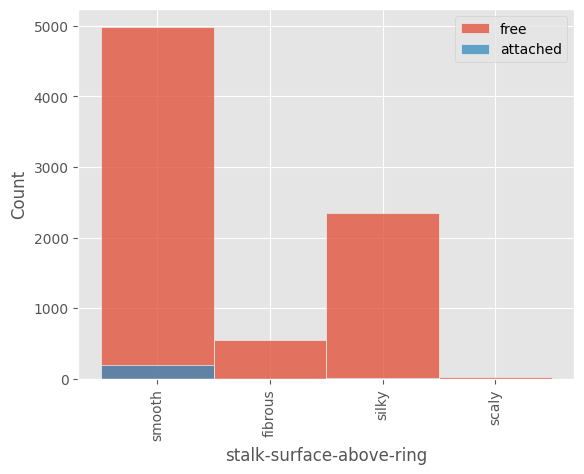

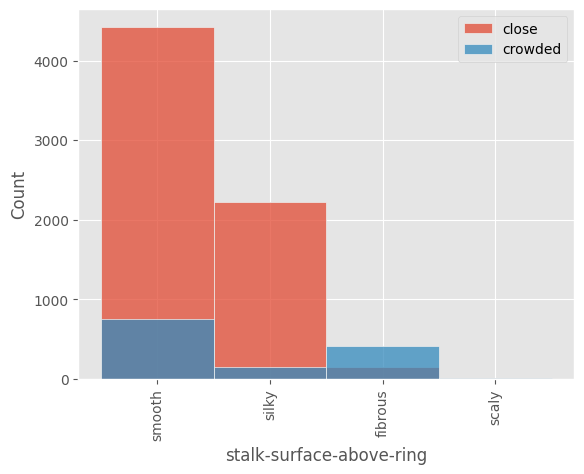

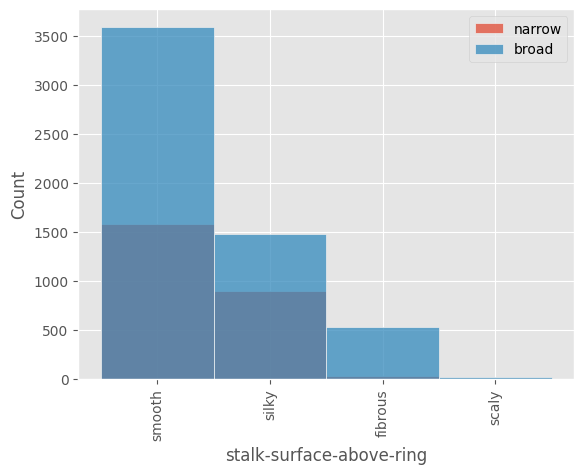

<Figure size 640x480 with 0 Axes>

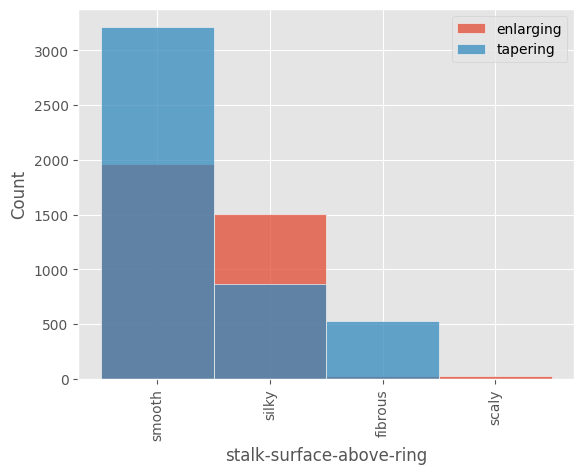

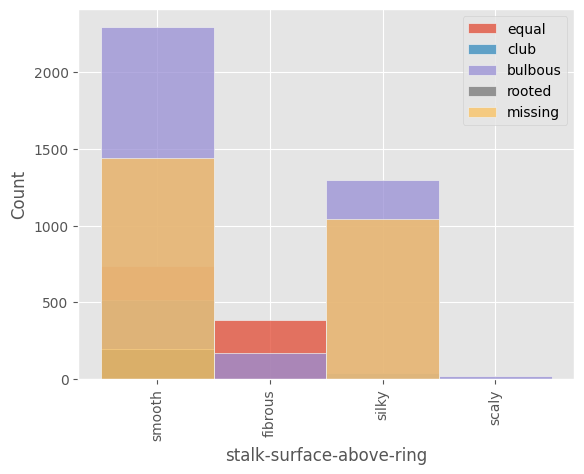

<Figure size 640x480 with 0 Axes>

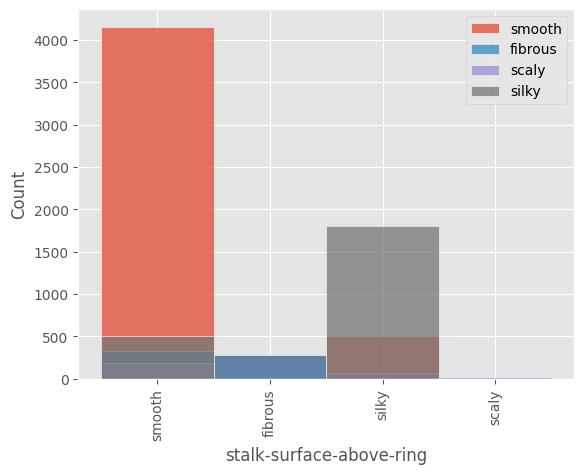

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

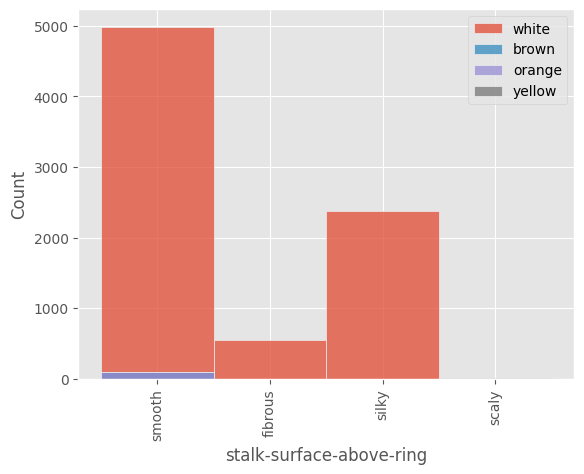

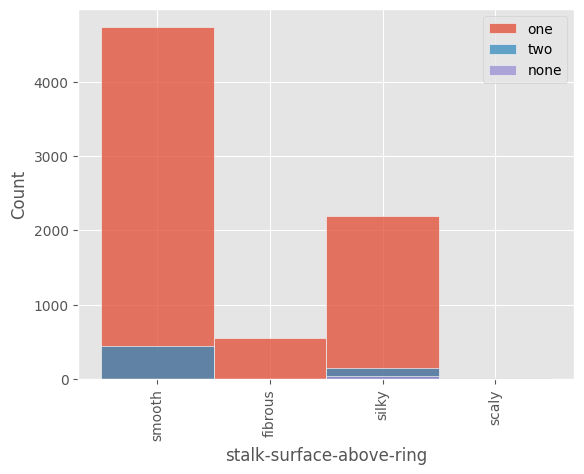

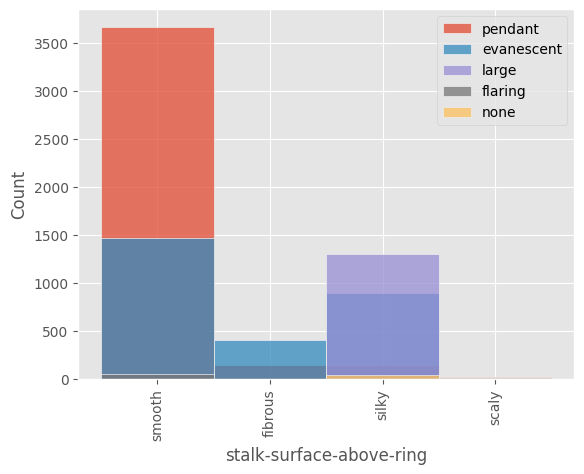

<Figure size 640x480 with 0 Axes>

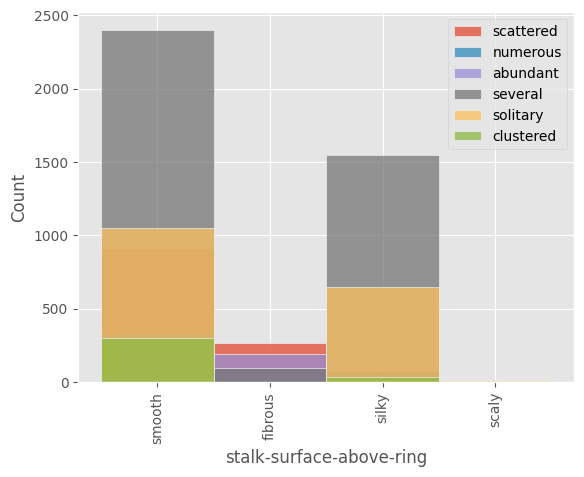

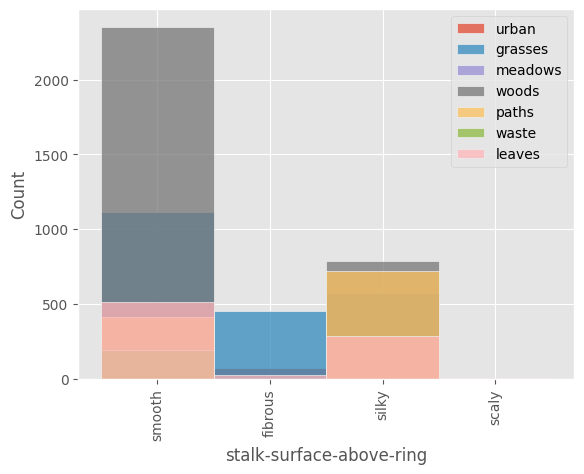

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

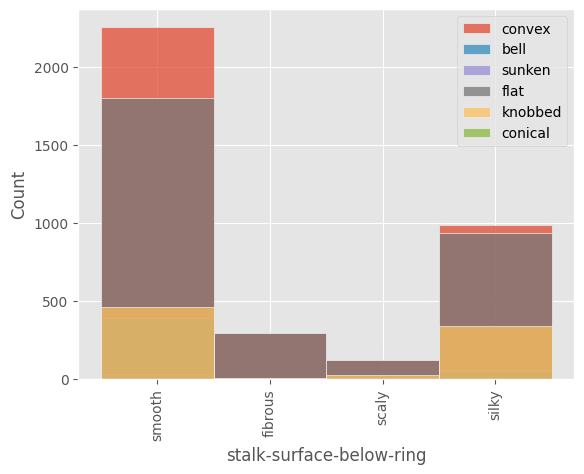

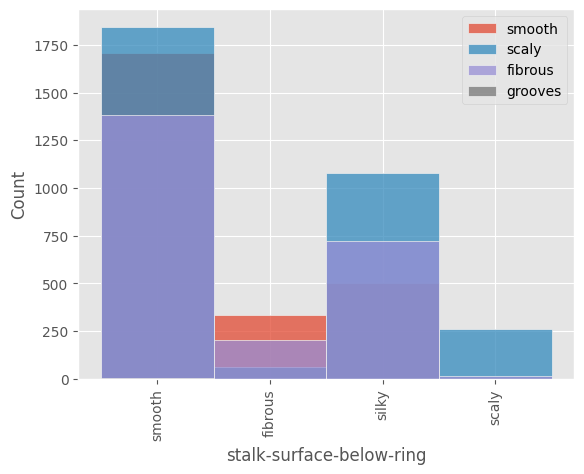

<Figure size 640x480 with 0 Axes>

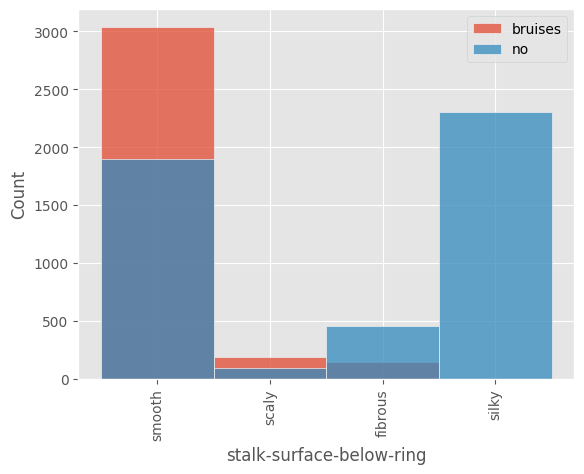

<Figure size 640x480 with 0 Axes>

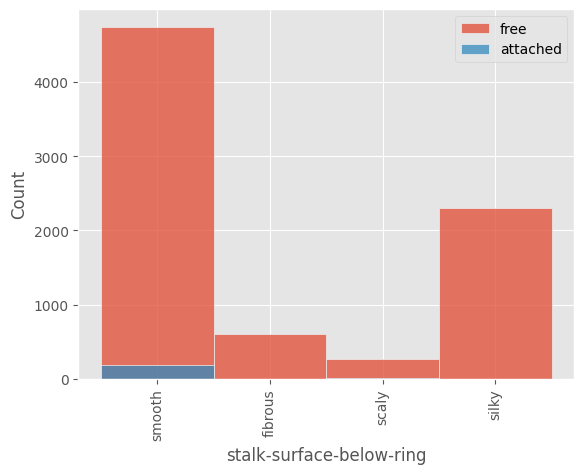

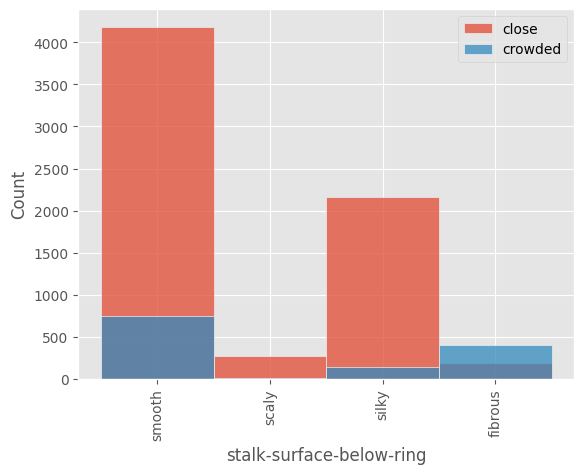

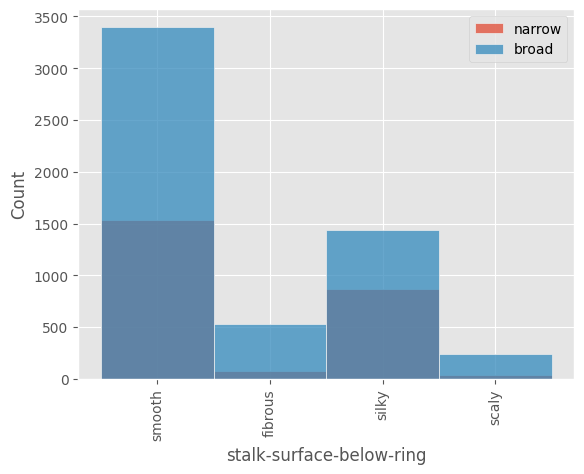

<Figure size 640x480 with 0 Axes>

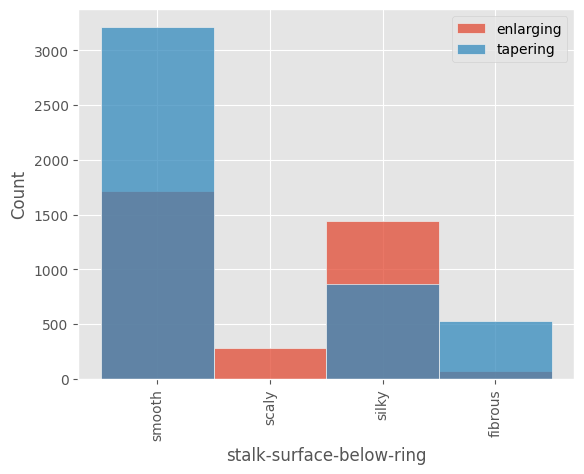

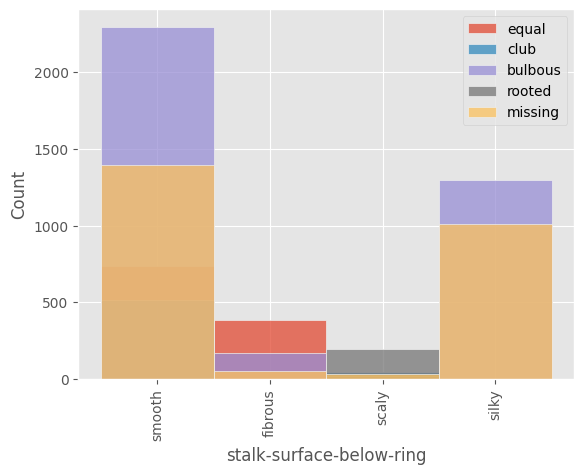

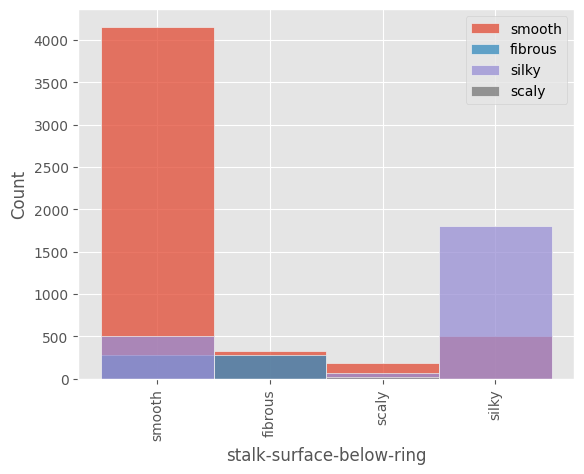

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

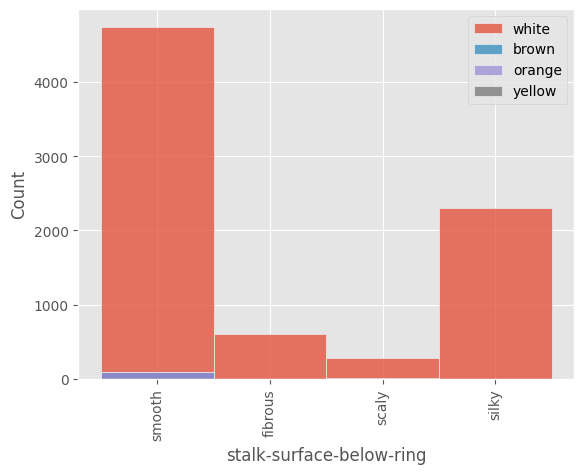

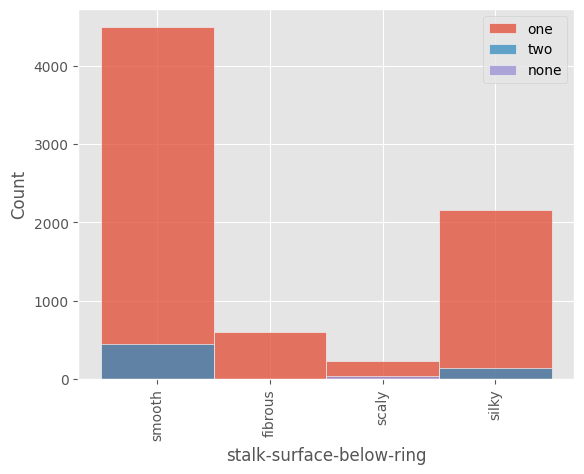

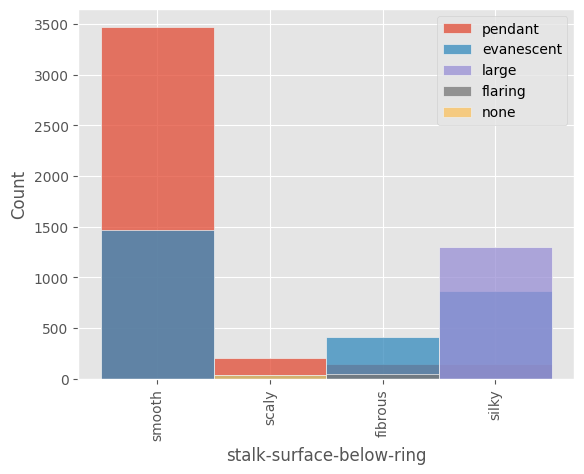

<Figure size 640x480 with 0 Axes>

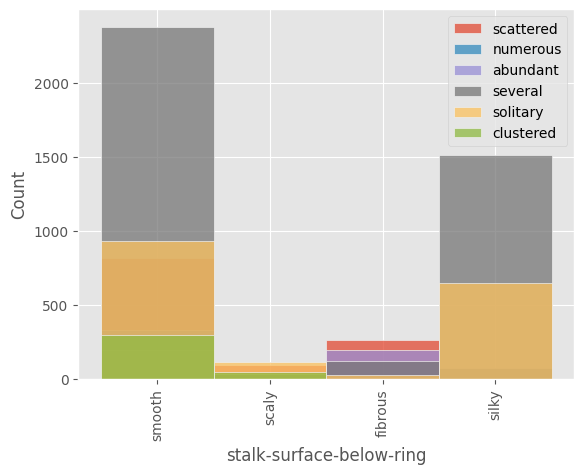

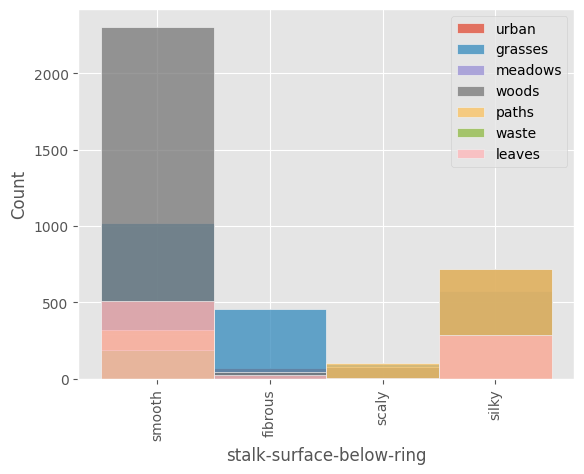

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

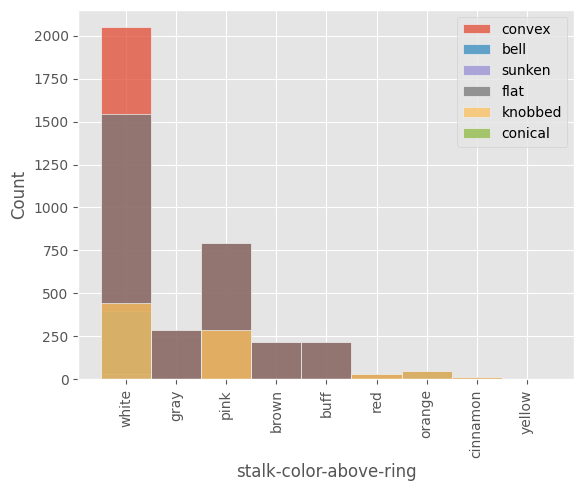

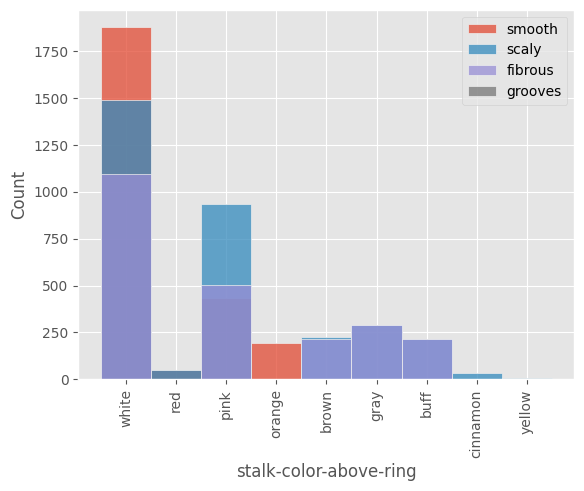

<Figure size 640x480 with 0 Axes>

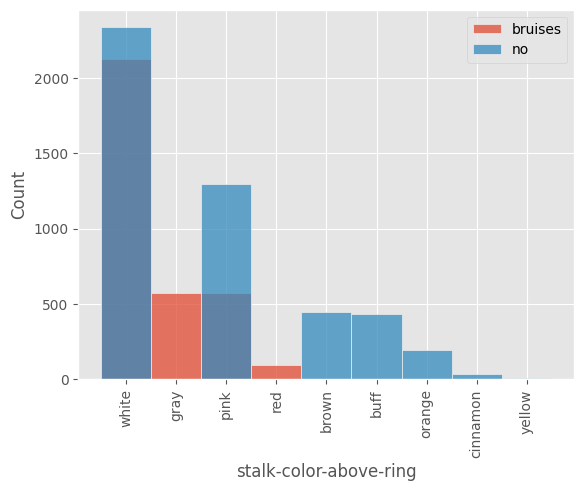

<Figure size 640x480 with 0 Axes>

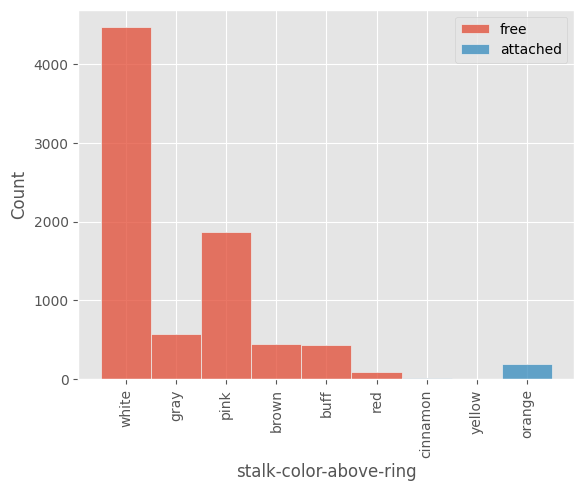

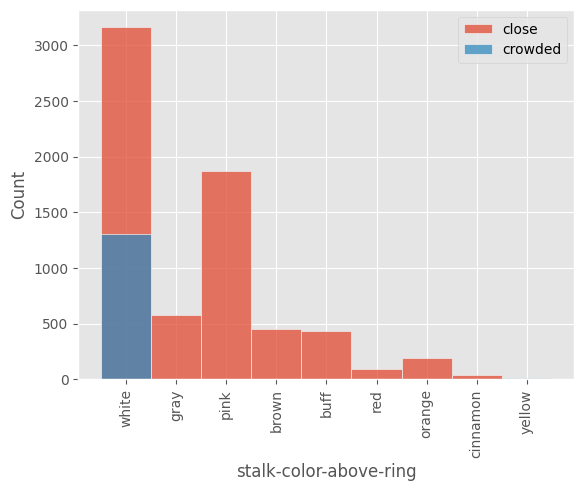

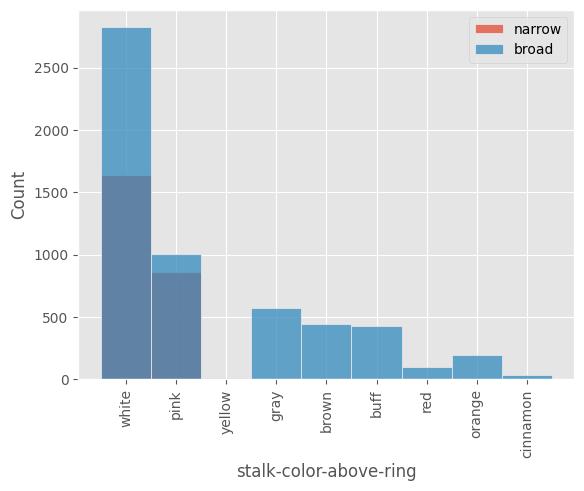

<Figure size 640x480 with 0 Axes>

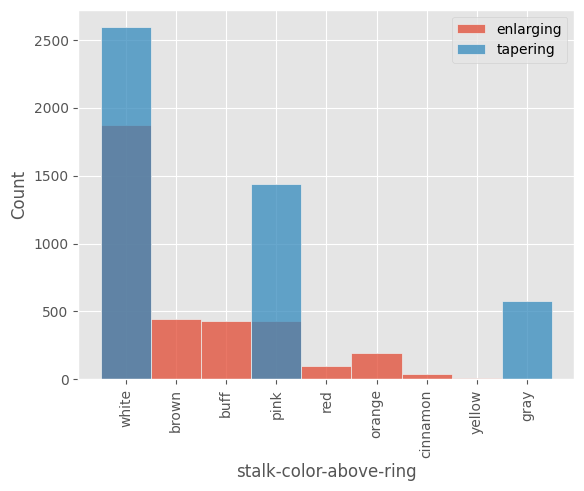

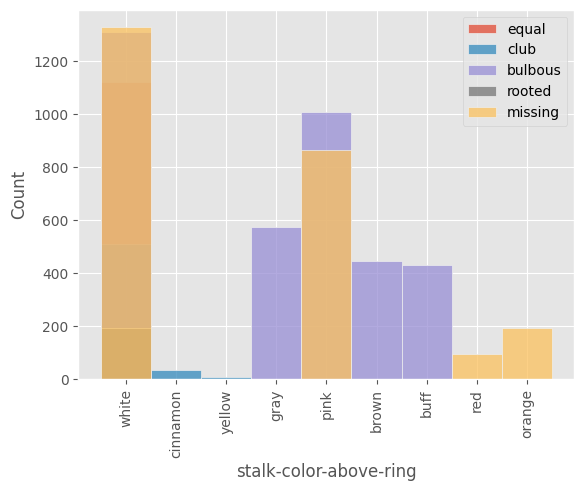

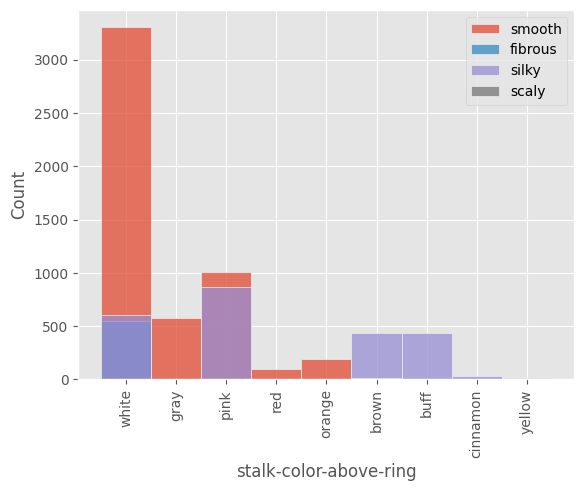

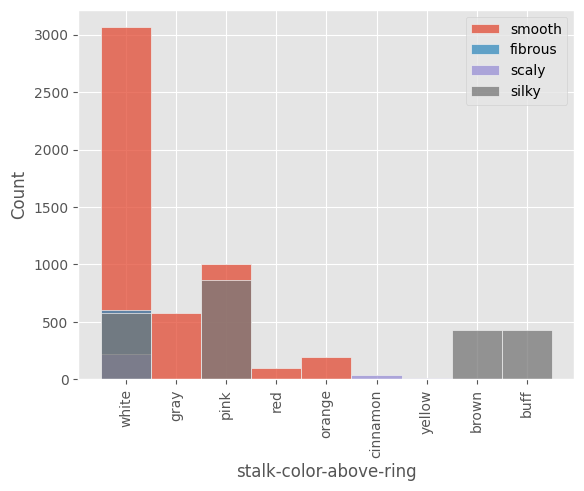

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

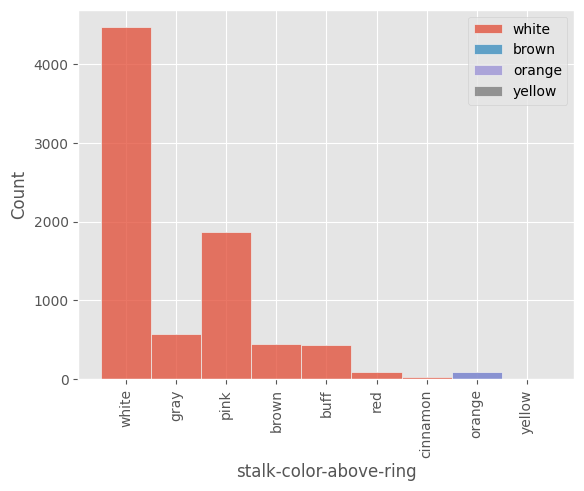

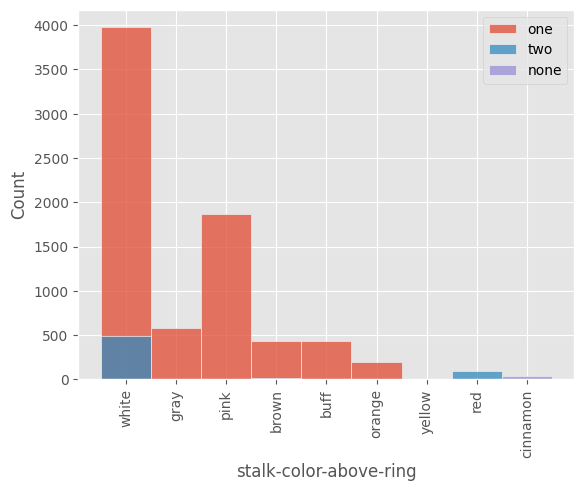

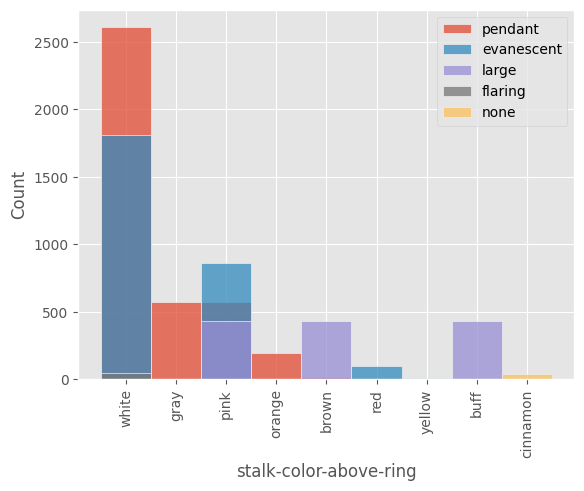

<Figure size 640x480 with 0 Axes>

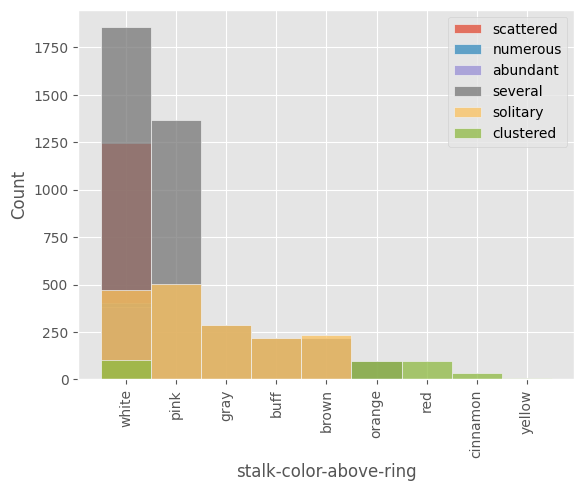

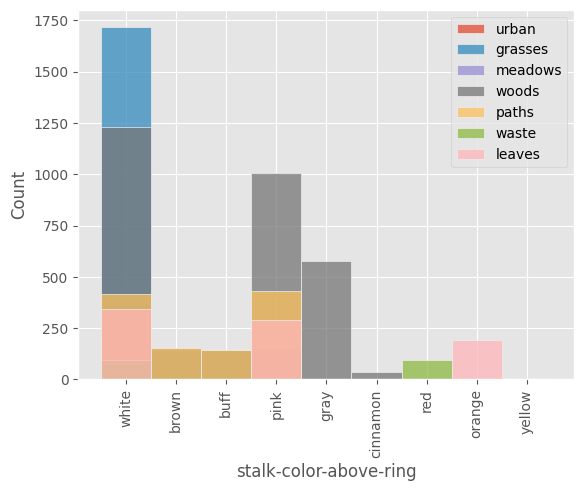

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

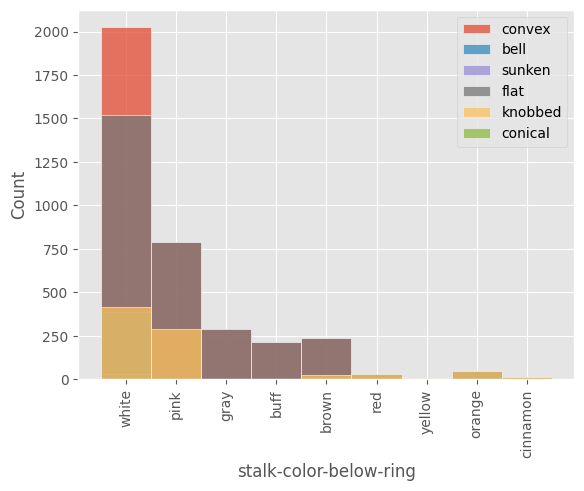

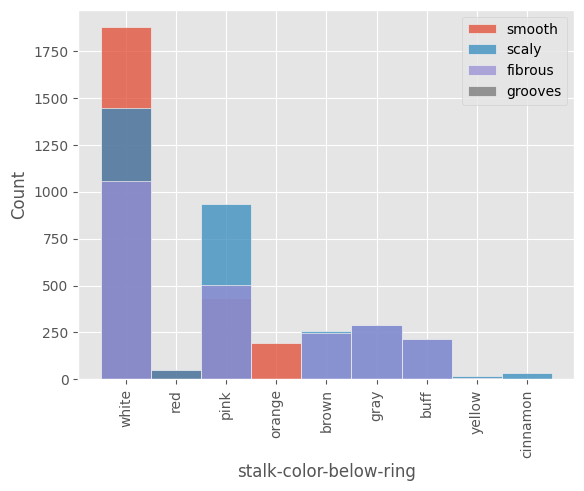

<Figure size 640x480 with 0 Axes>

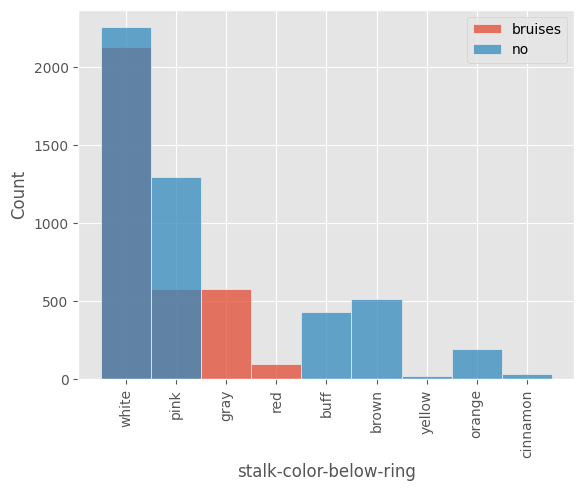

<Figure size 640x480 with 0 Axes>

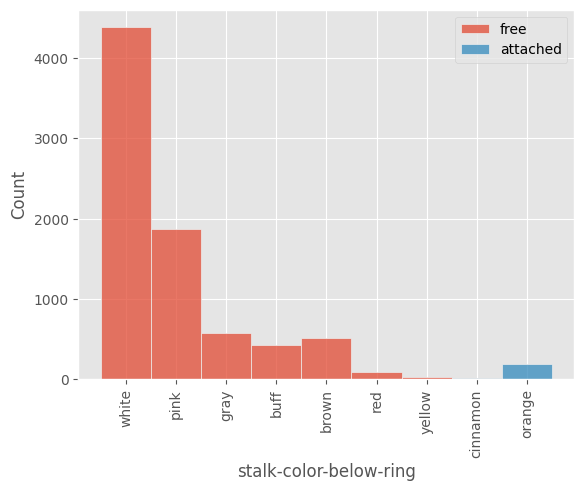

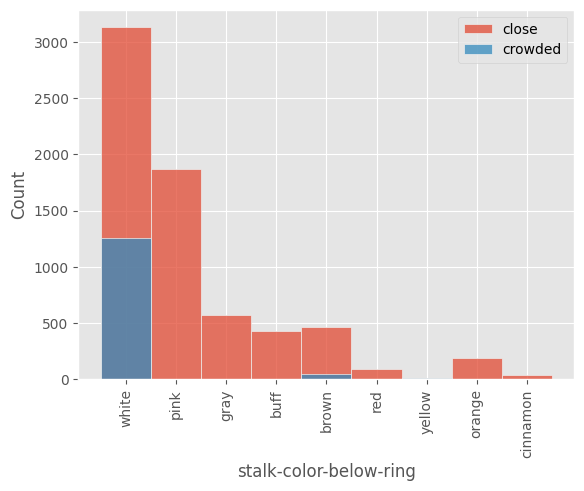

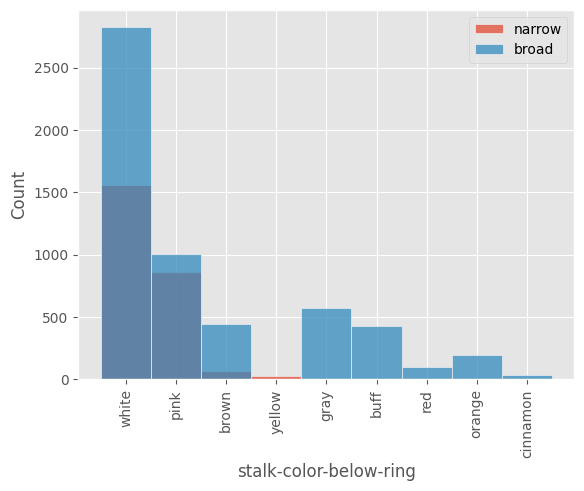

<Figure size 640x480 with 0 Axes>

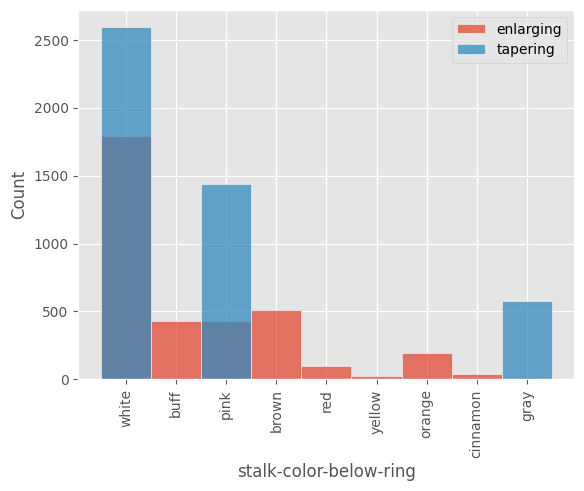

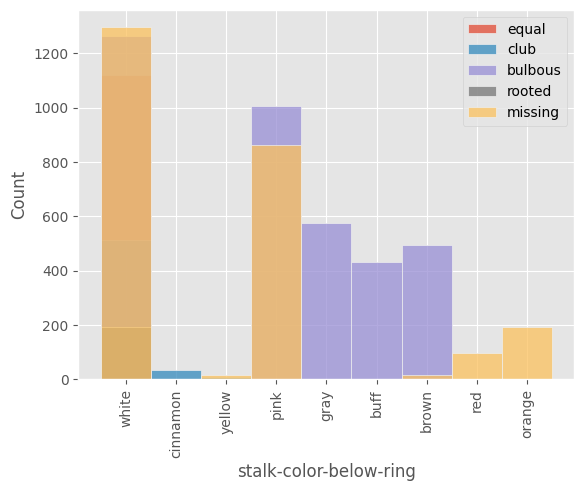

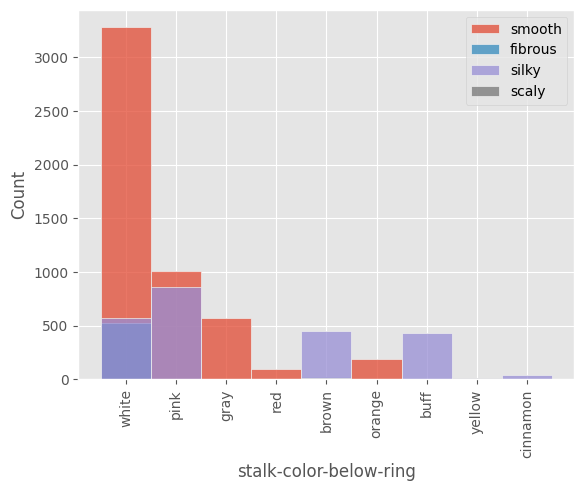

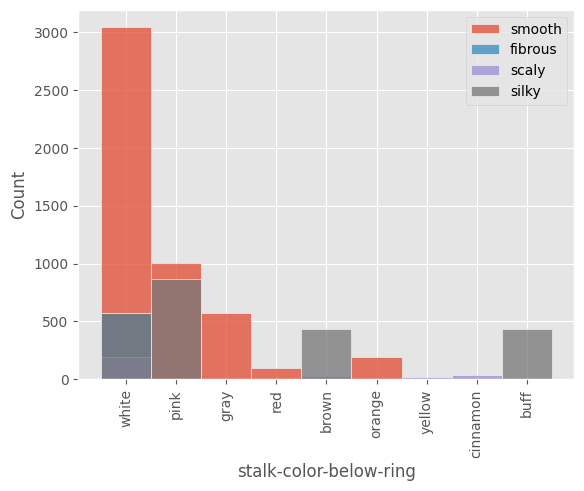

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

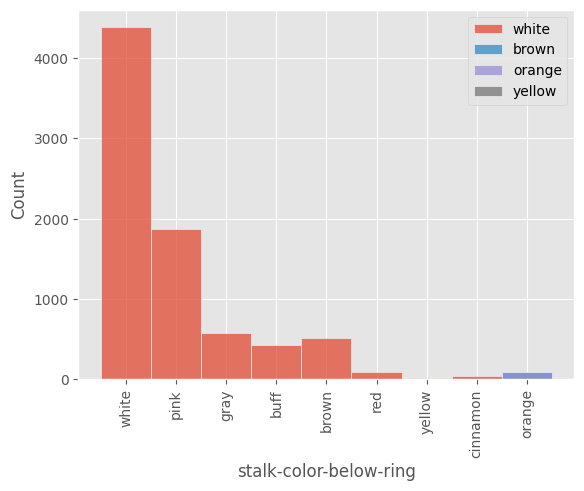

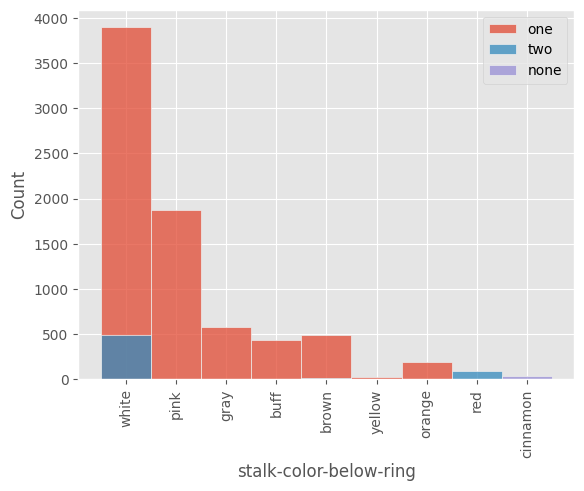

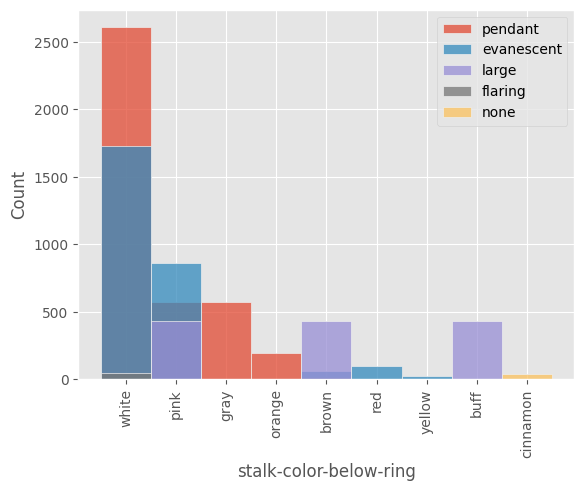

<Figure size 640x480 with 0 Axes>

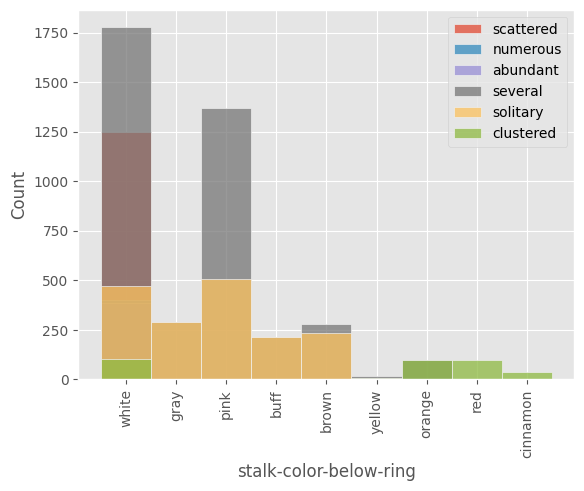

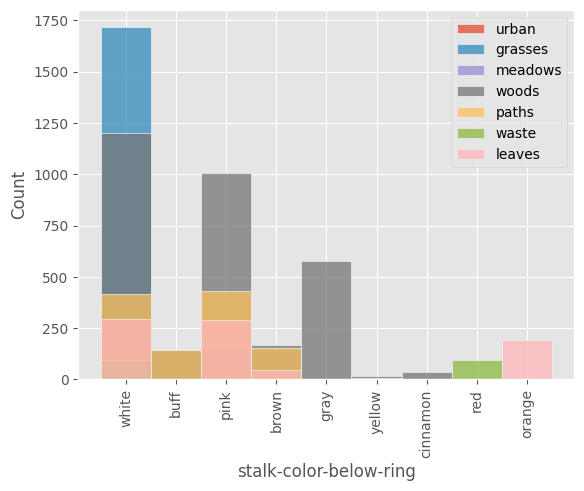

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

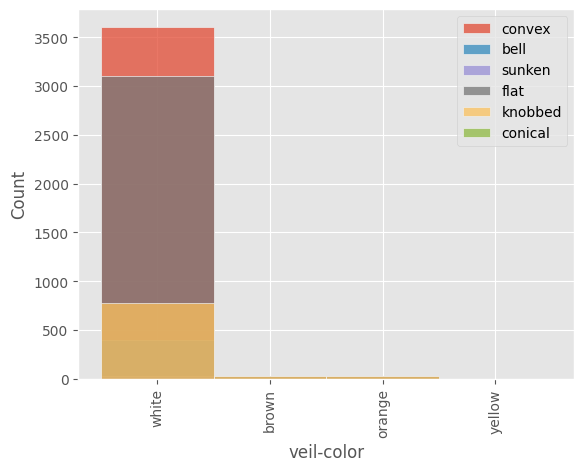

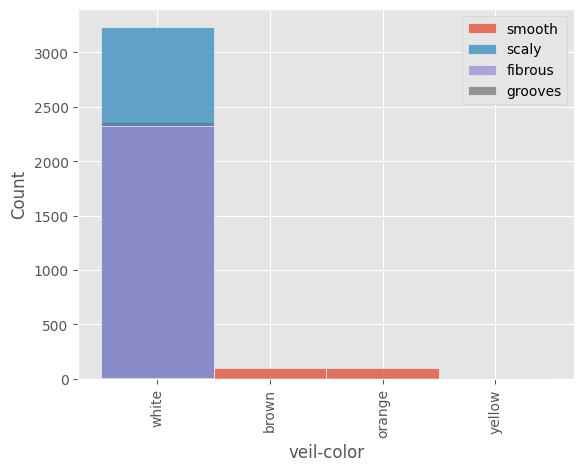

<Figure size 640x480 with 0 Axes>

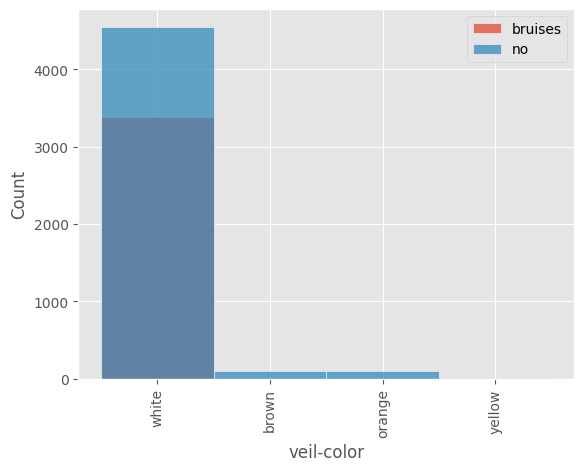

<Figure size 640x480 with 0 Axes>

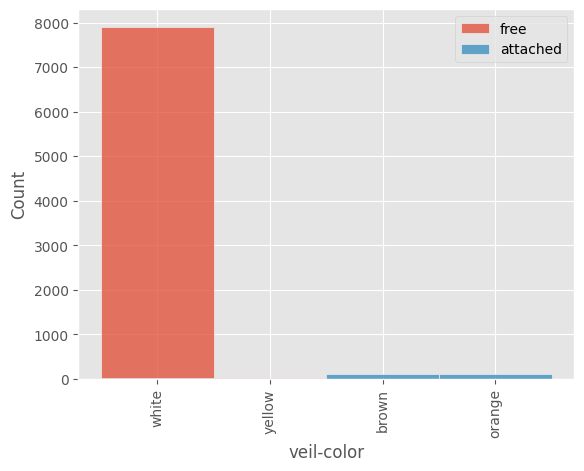

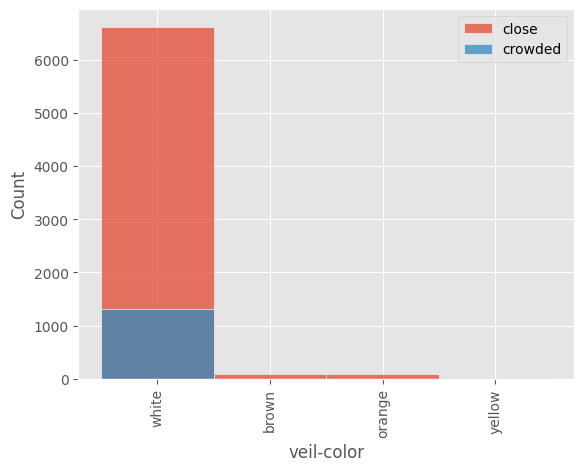

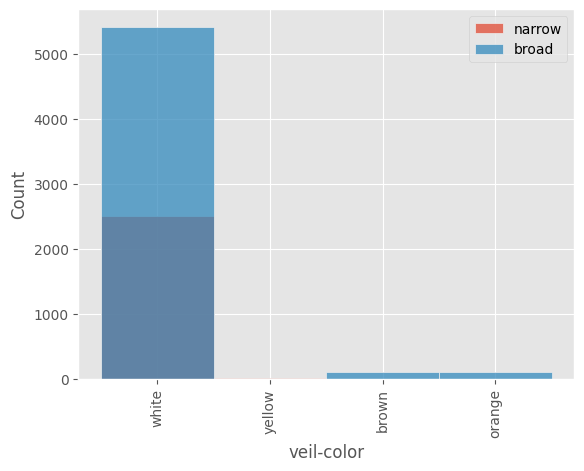

<Figure size 640x480 with 0 Axes>

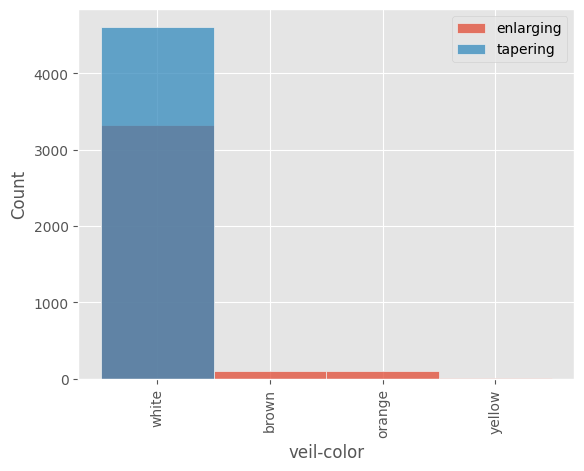

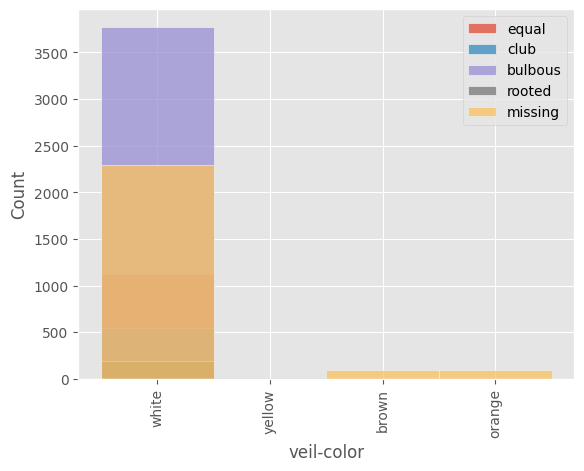

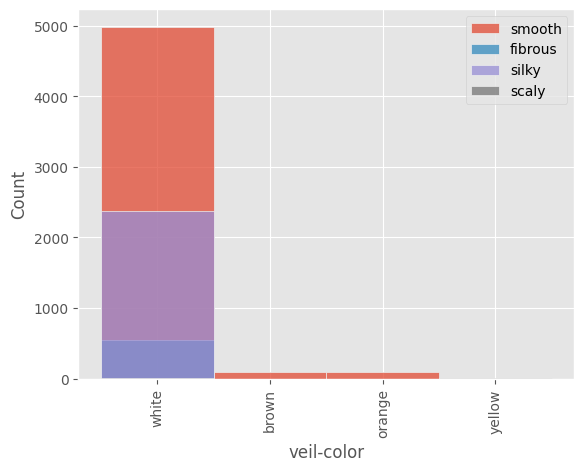

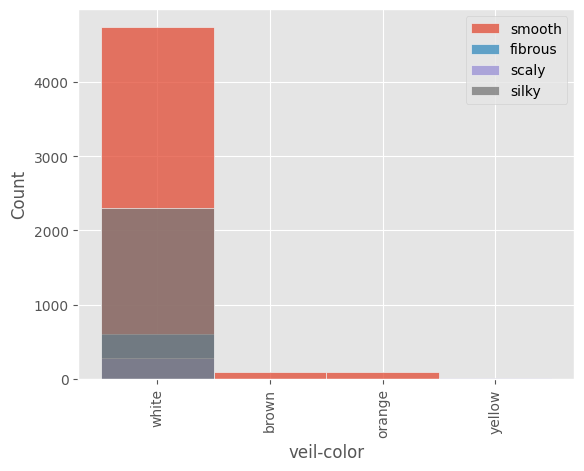

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

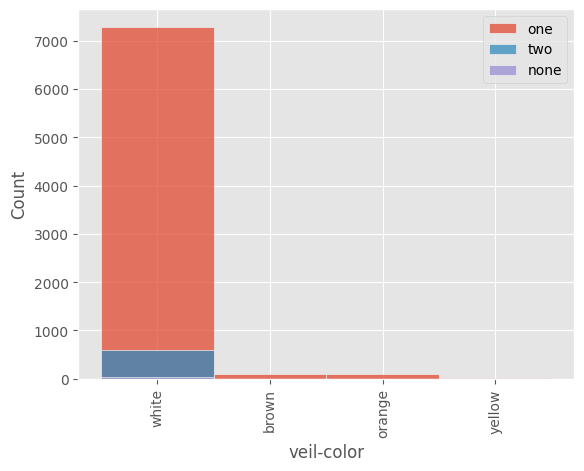

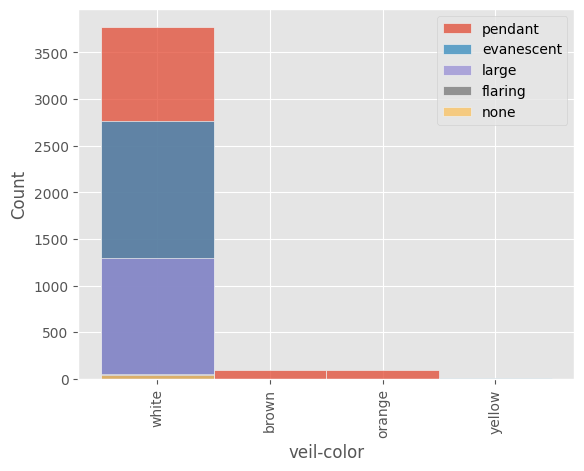

<Figure size 640x480 with 0 Axes>

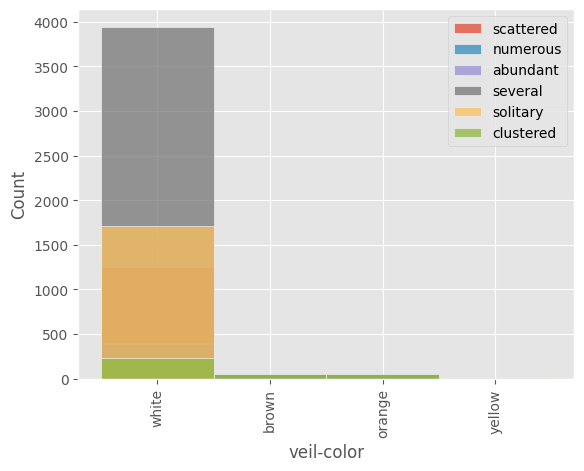

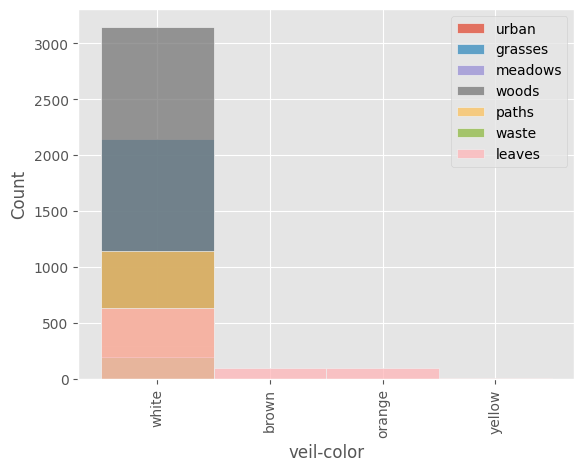

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

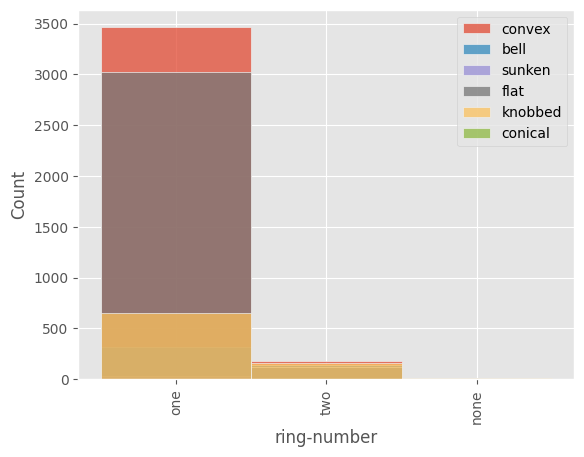

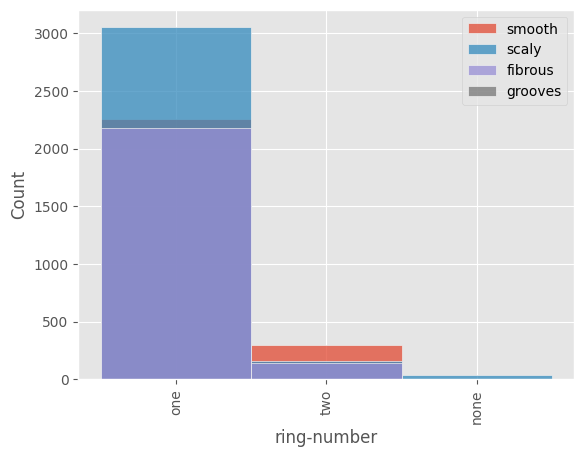

<Figure size 640x480 with 0 Axes>

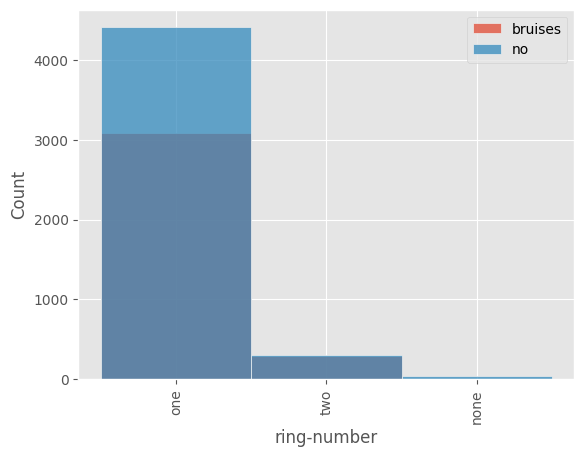

<Figure size 640x480 with 0 Axes>

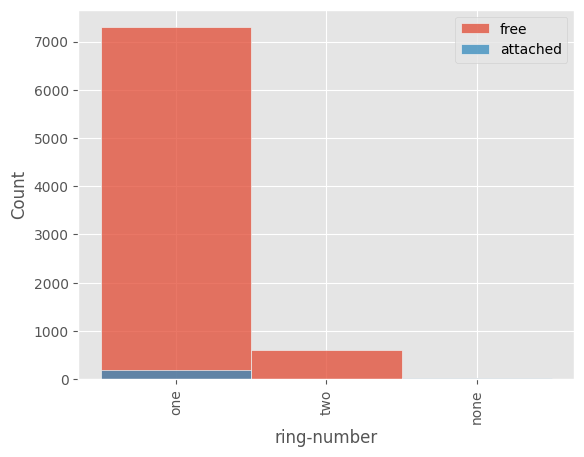

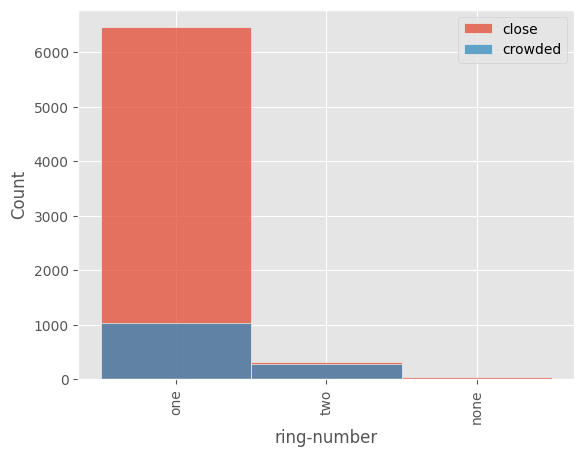

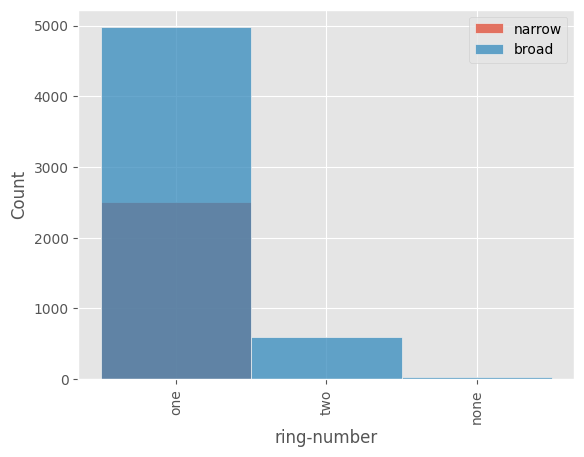

<Figure size 640x480 with 0 Axes>

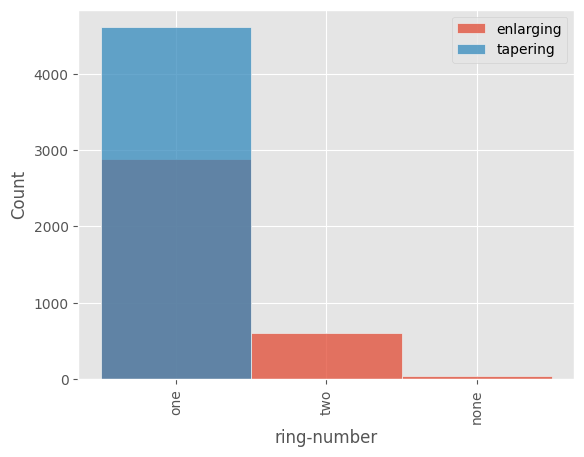

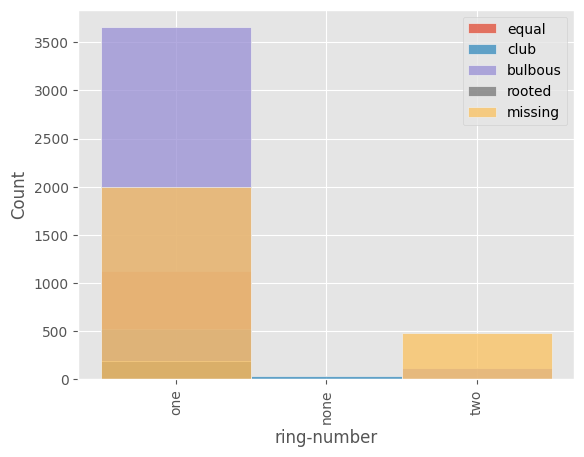

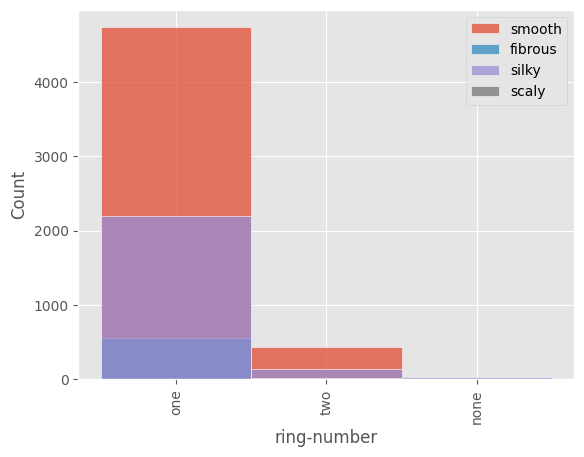

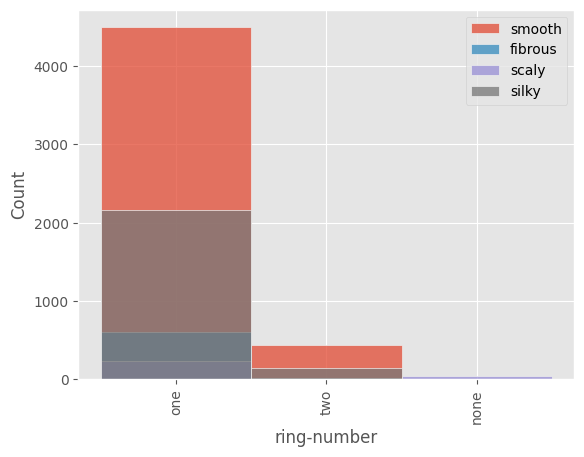

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

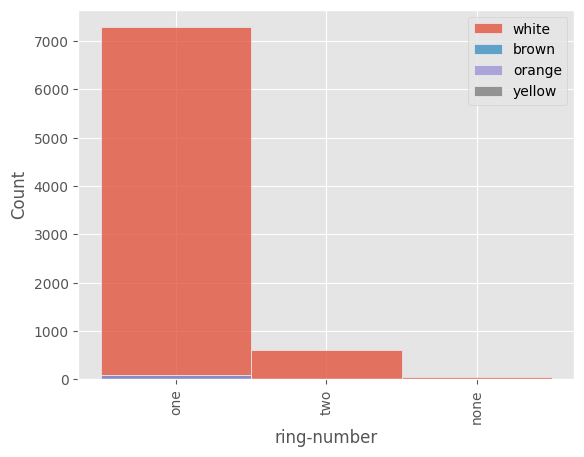

<Figure size 640x480 with 0 Axes>

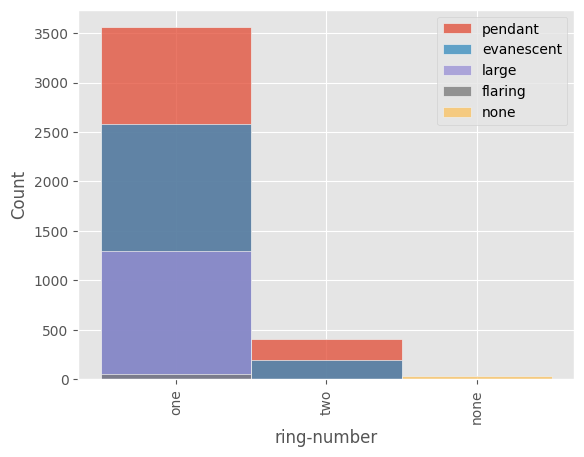

<Figure size 640x480 with 0 Axes>

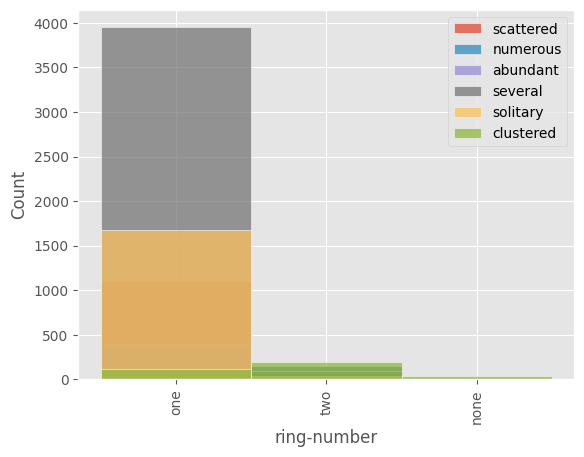

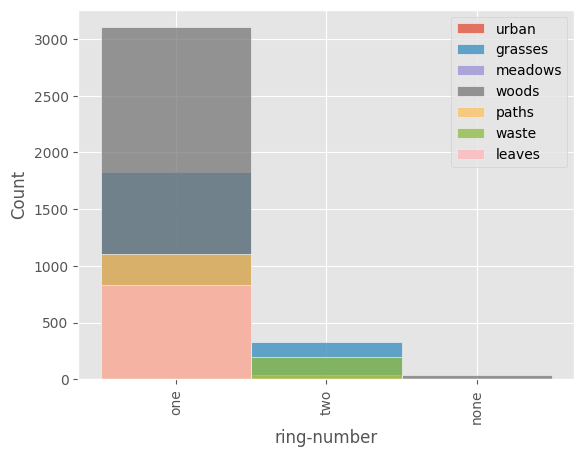

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

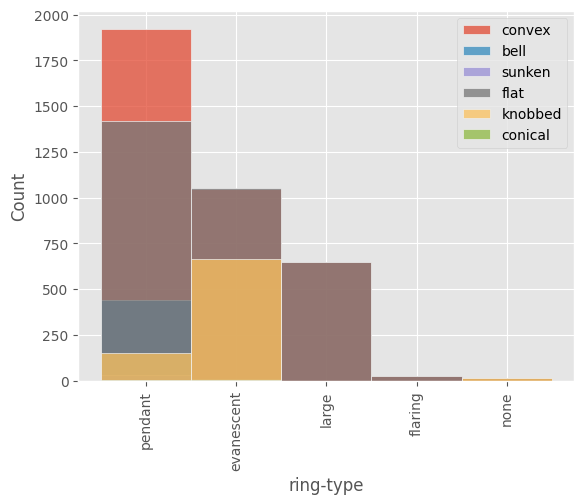

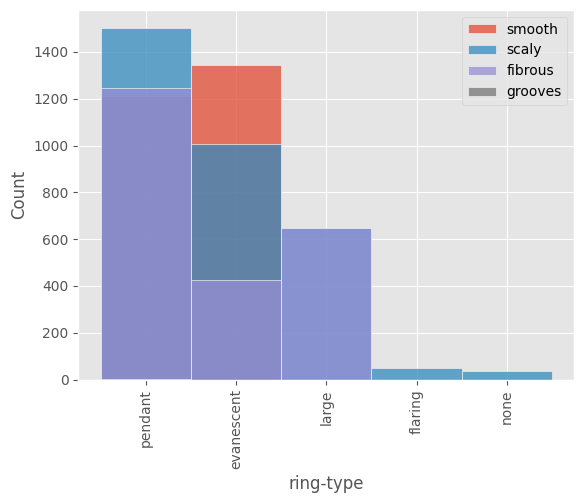

<Figure size 640x480 with 0 Axes>

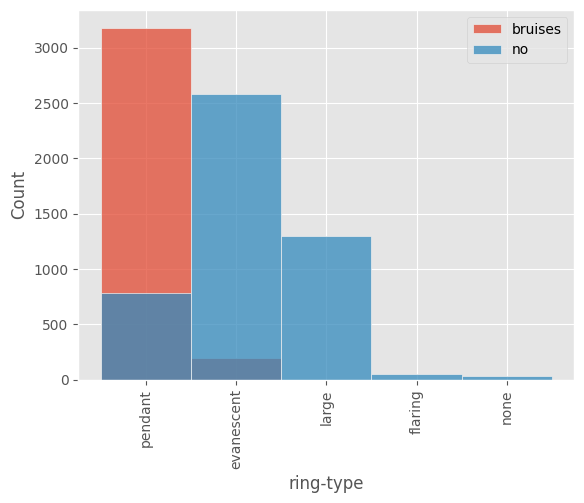

<Figure size 640x480 with 0 Axes>

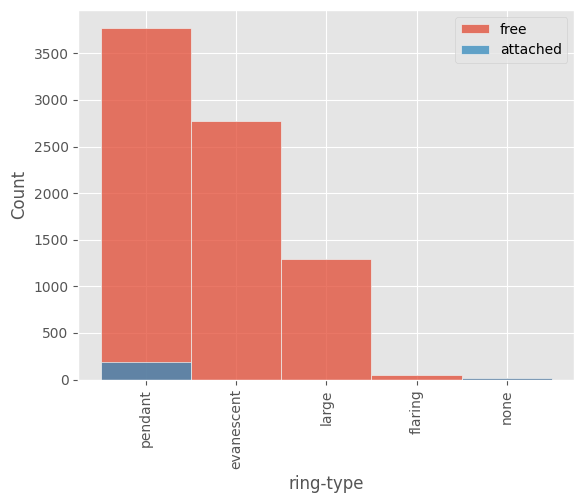

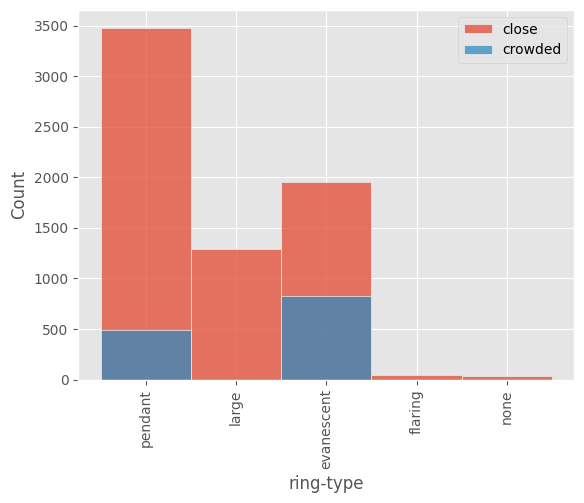

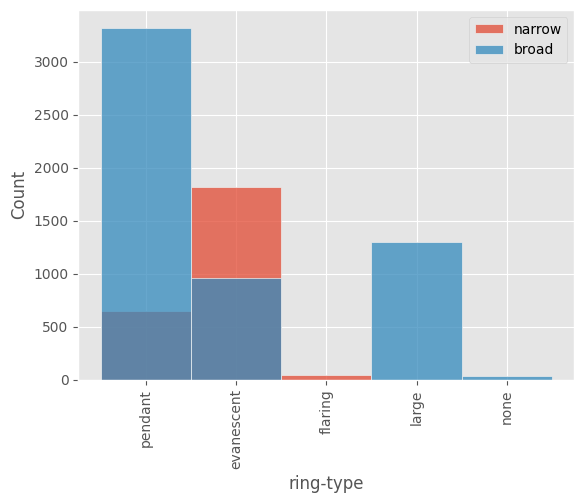

<Figure size 640x480 with 0 Axes>

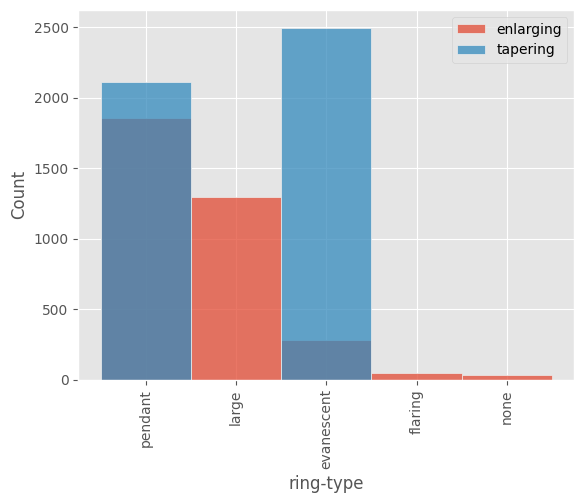

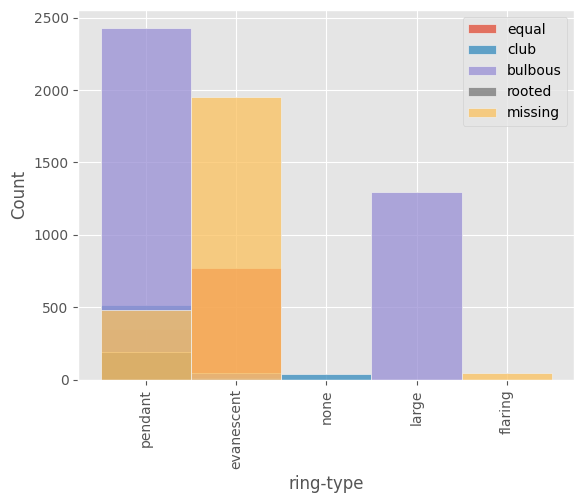

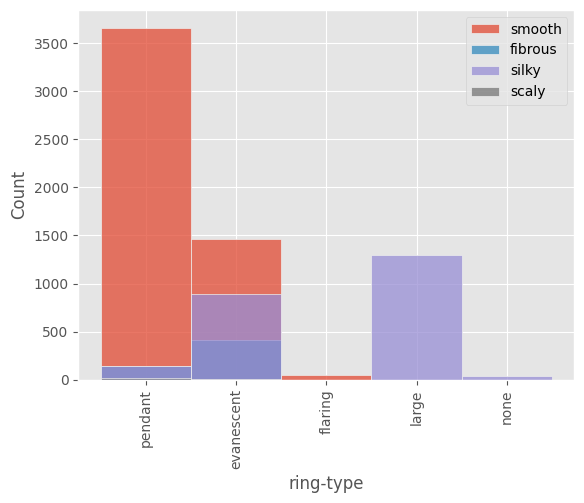

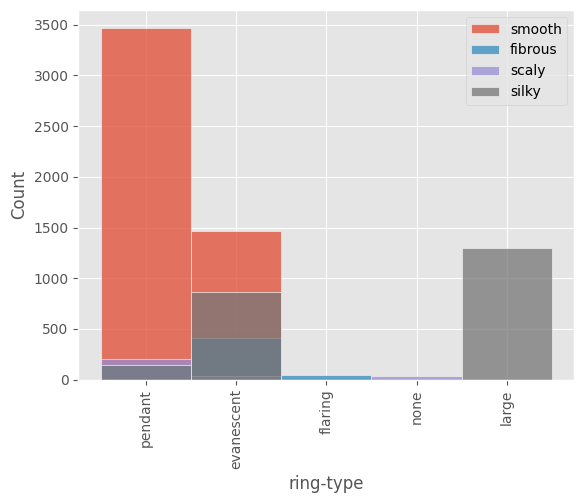

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

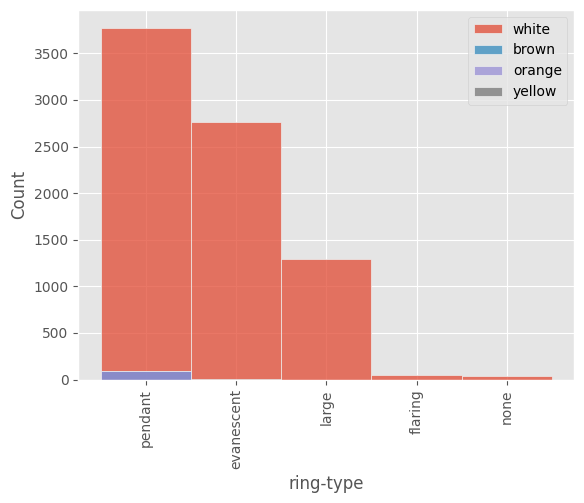

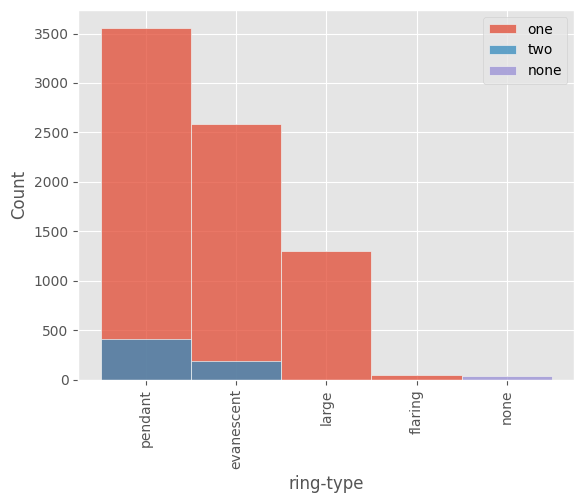

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

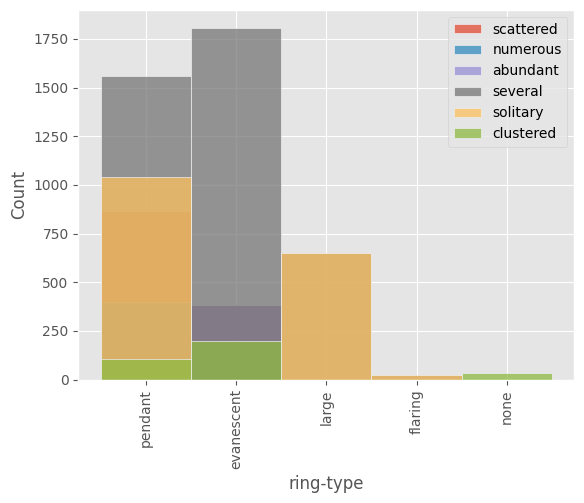

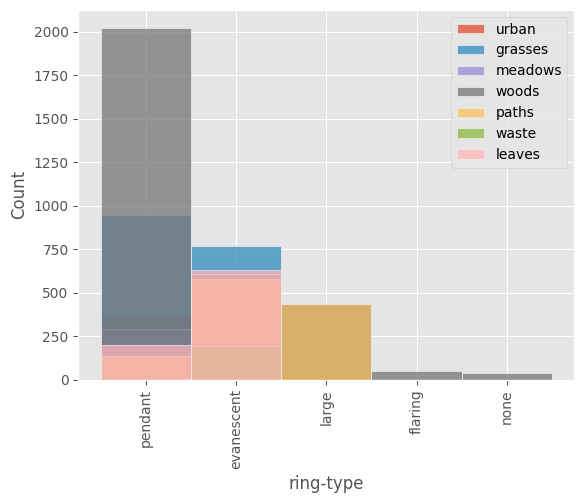

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

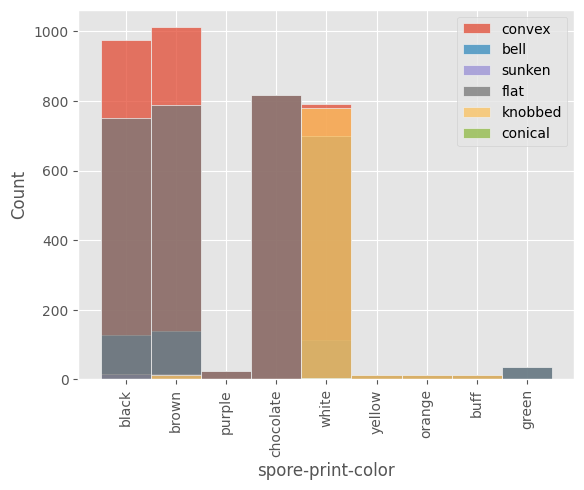

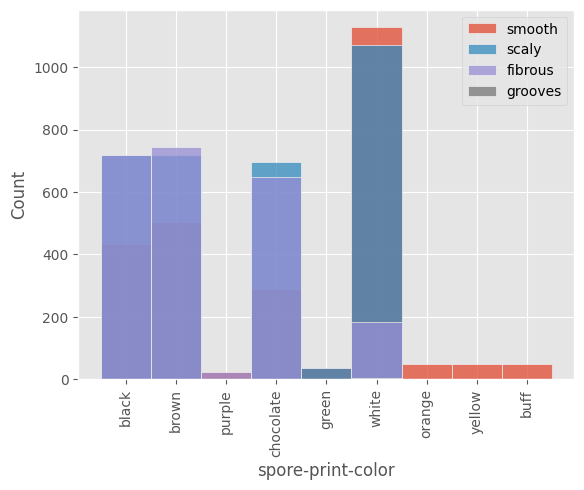

<Figure size 640x480 with 0 Axes>

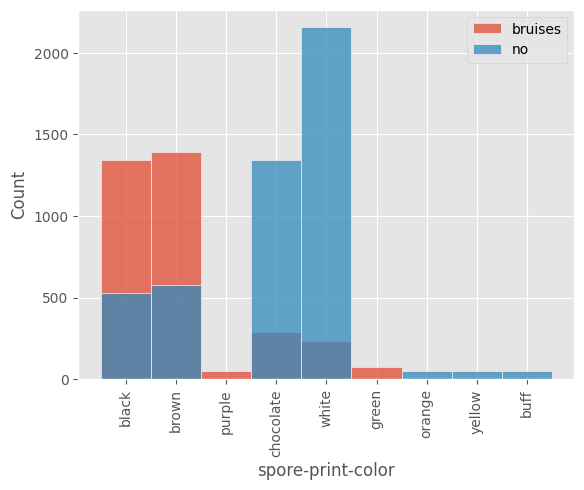

<Figure size 640x480 with 0 Axes>

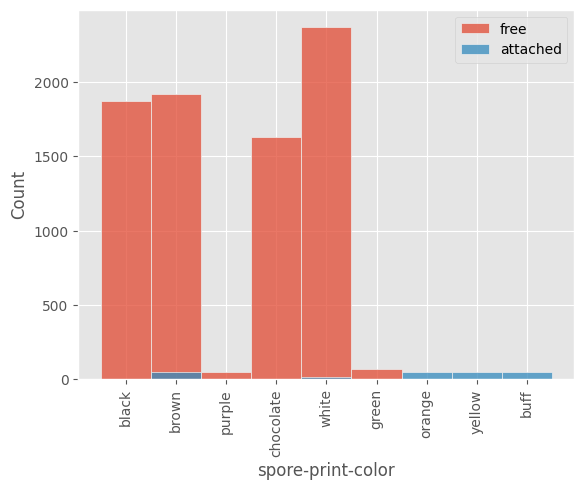

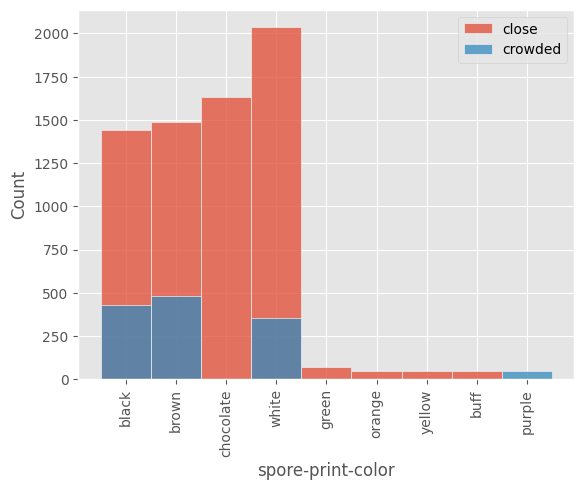

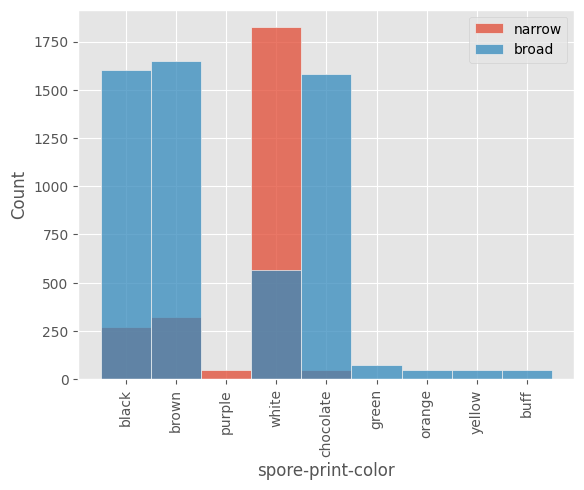

<Figure size 640x480 with 0 Axes>

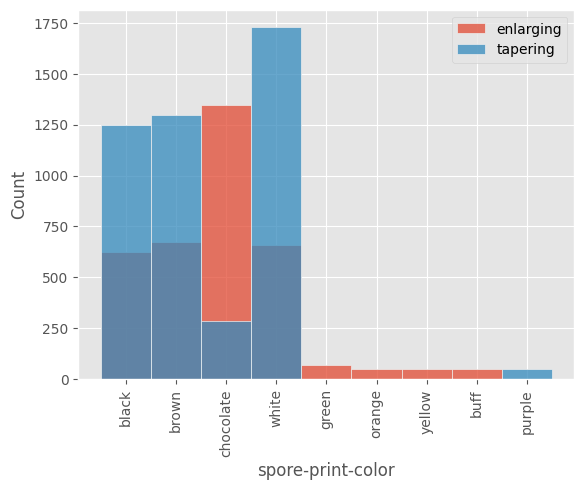

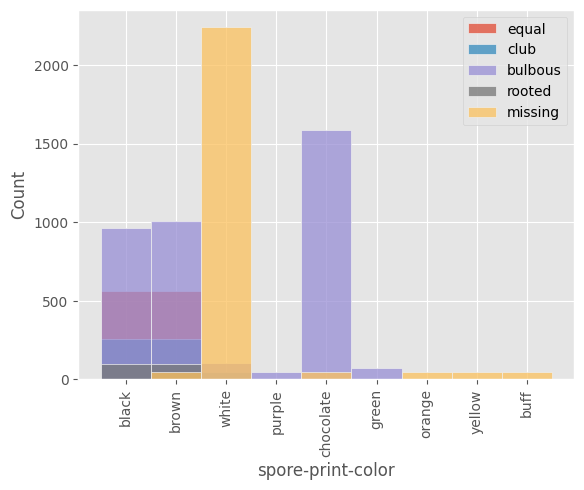

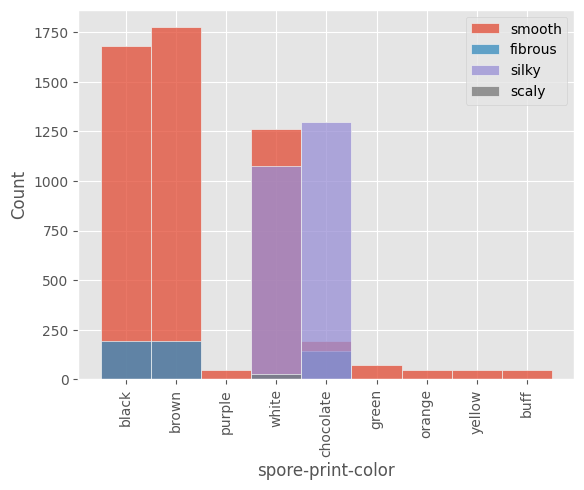

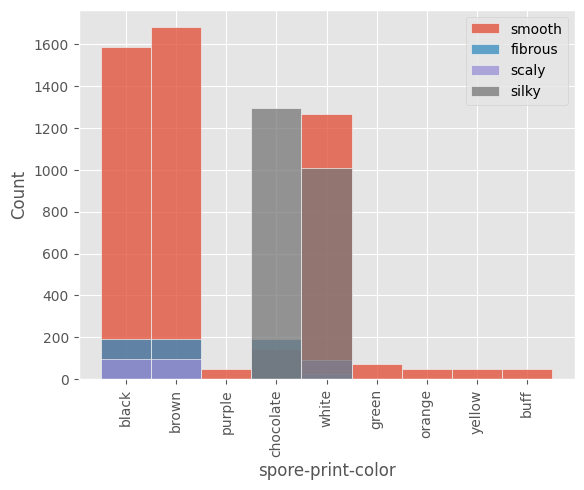

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

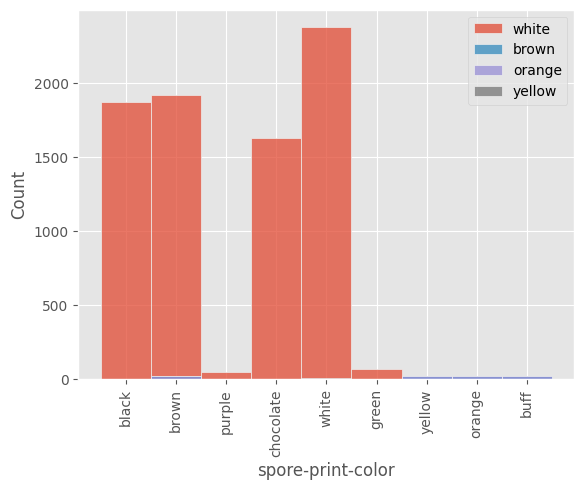

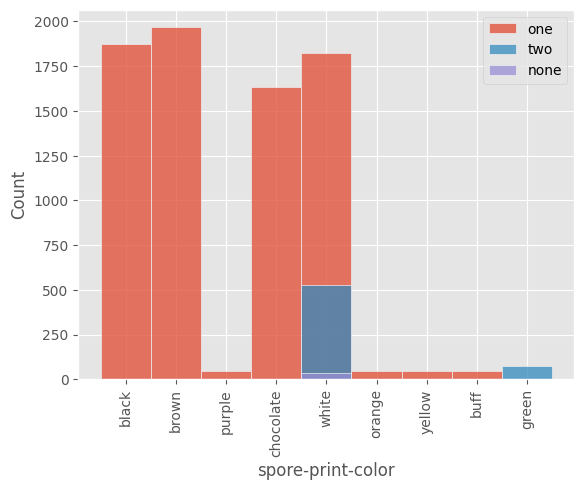

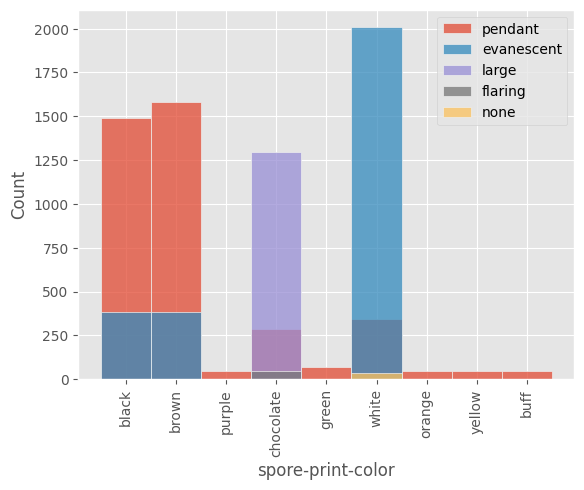

<Figure size 640x480 with 0 Axes>

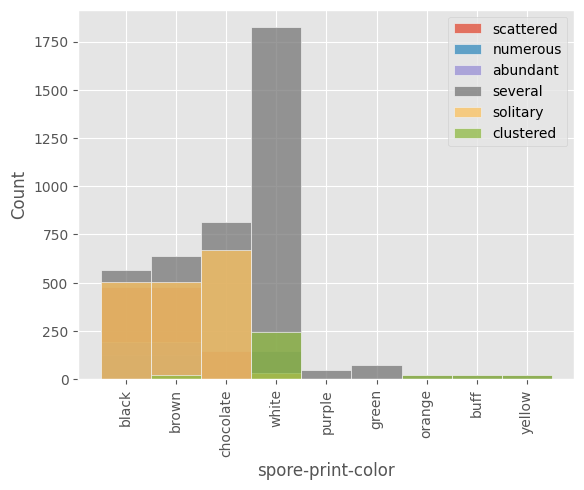

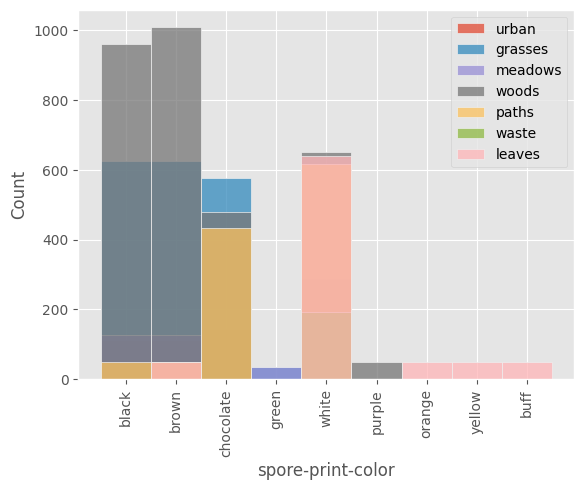

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

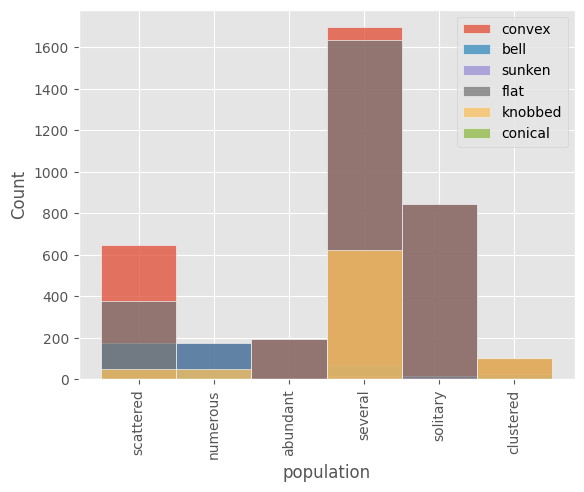

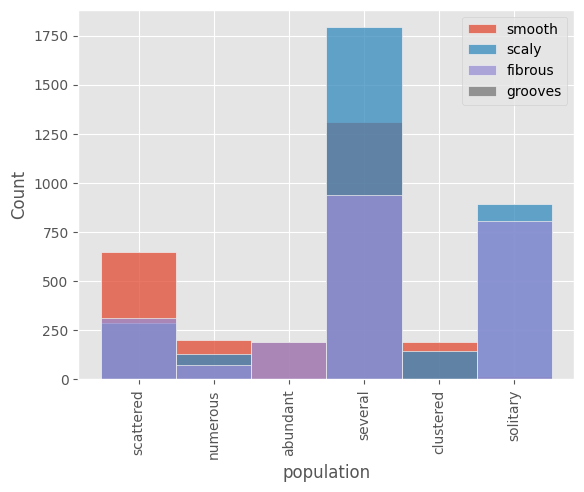

<Figure size 640x480 with 0 Axes>

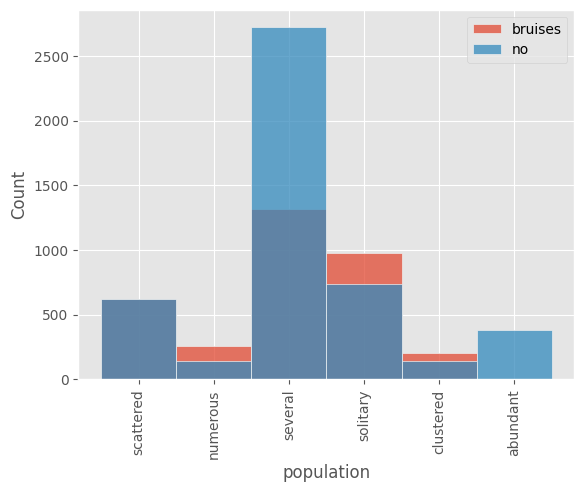

<Figure size 640x480 with 0 Axes>

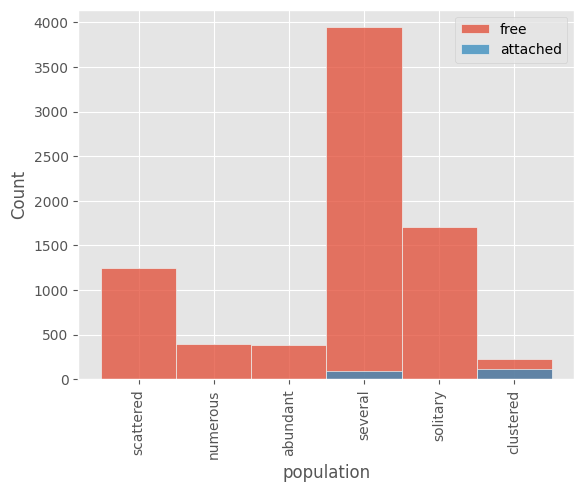

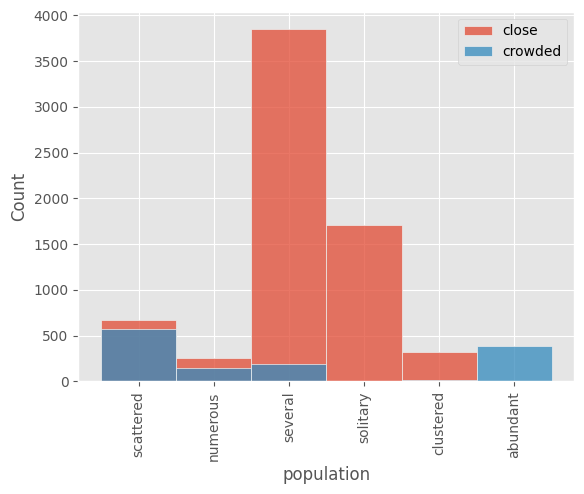

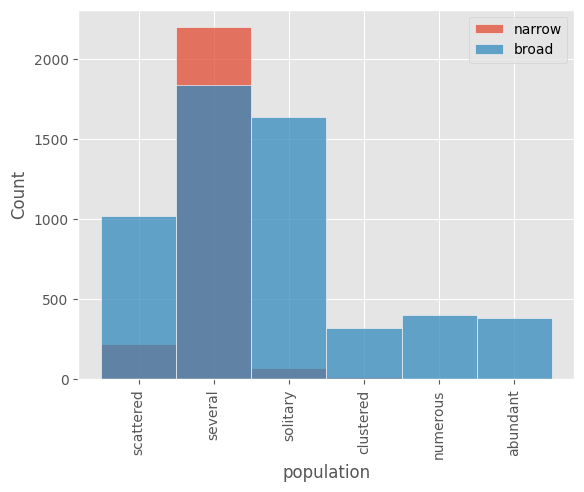

<Figure size 640x480 with 0 Axes>

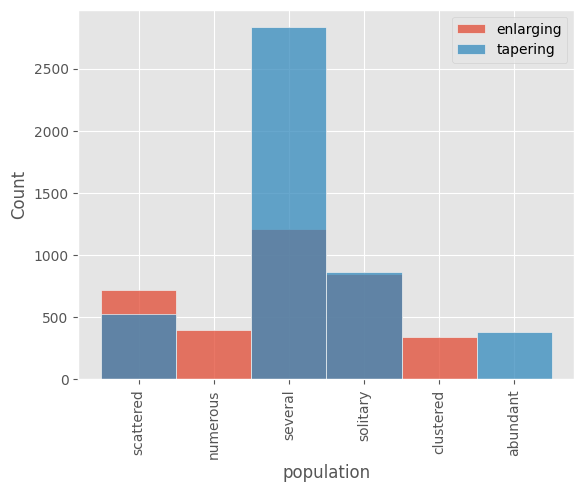

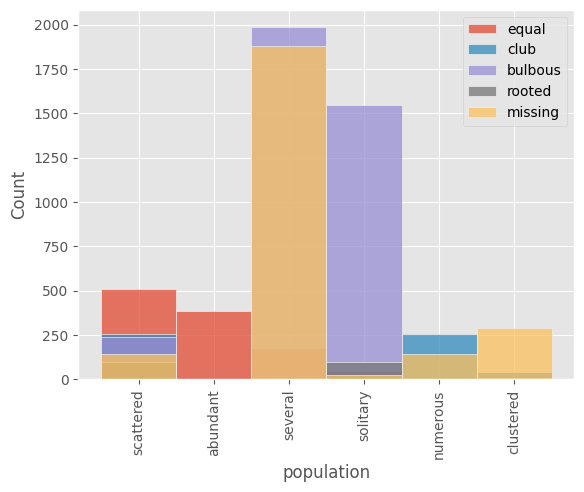

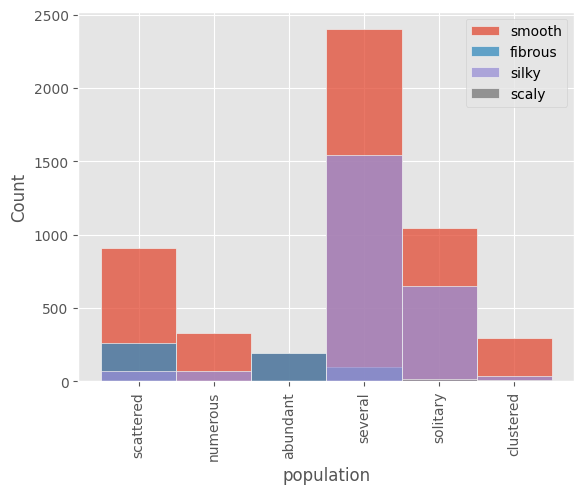

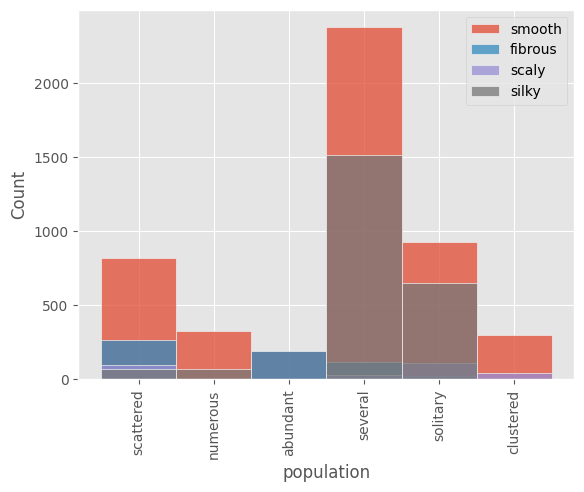

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

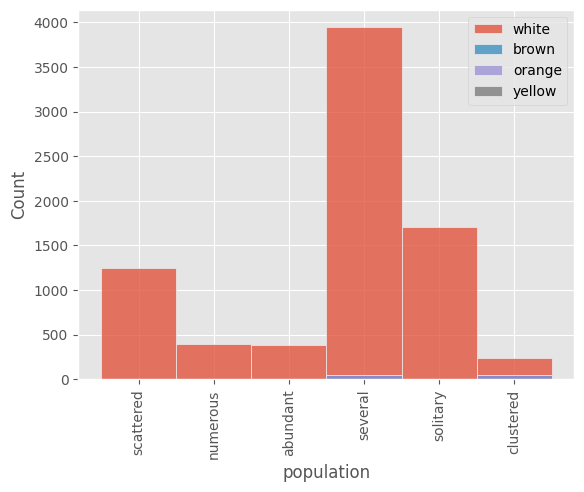

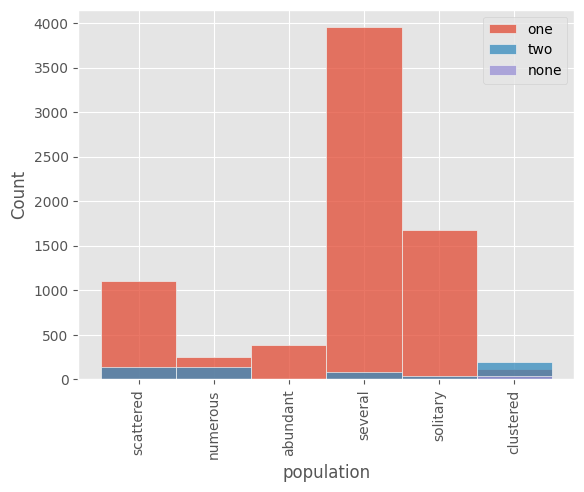

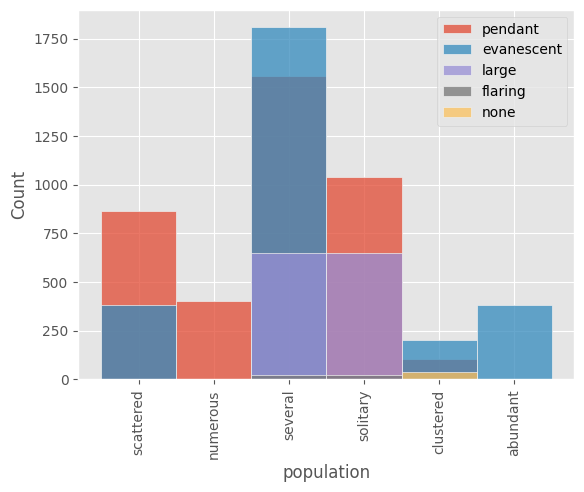

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

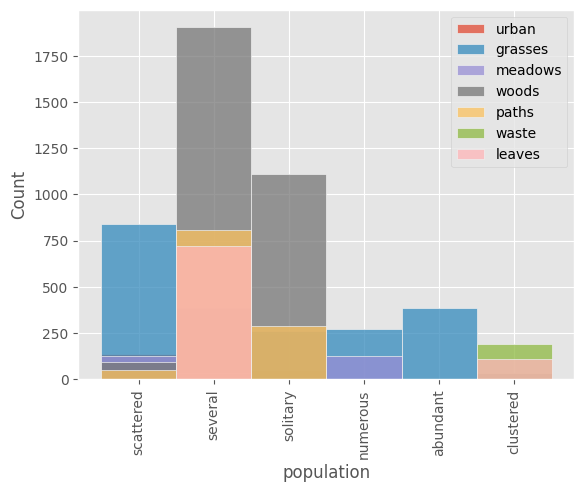

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

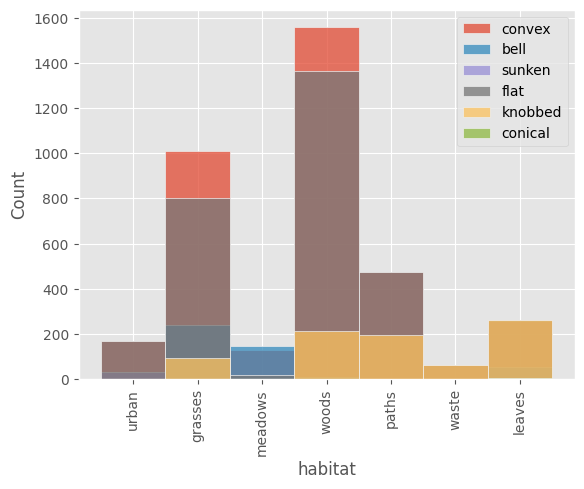

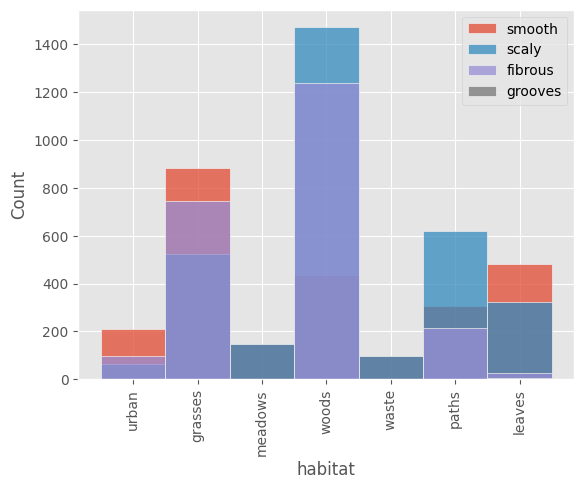

<Figure size 640x480 with 0 Axes>

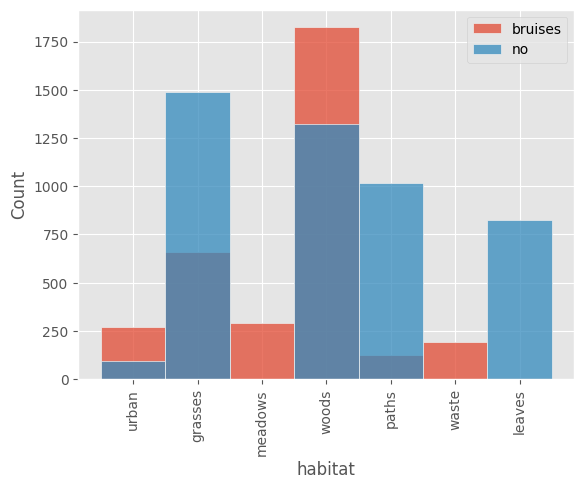

<Figure size 640x480 with 0 Axes>

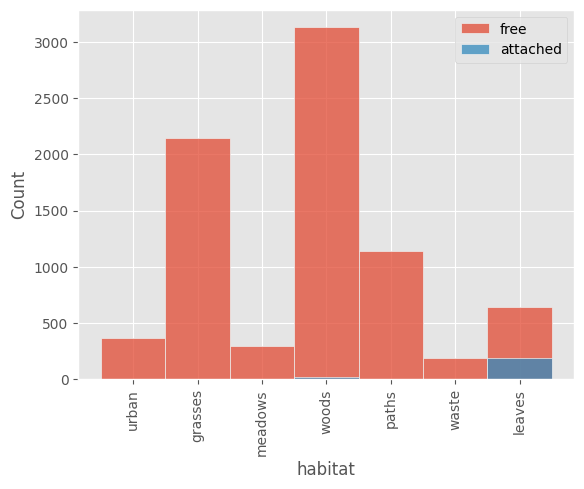

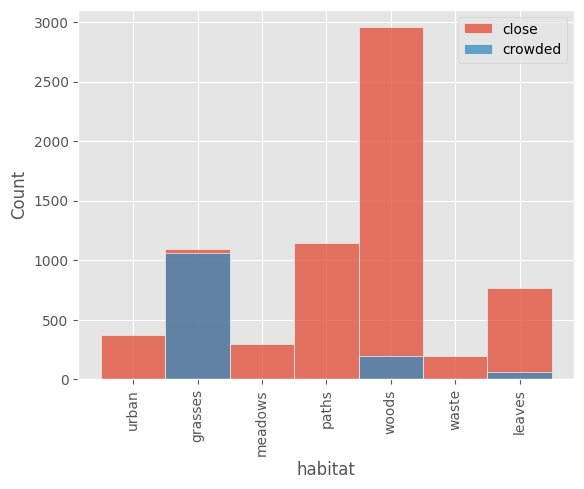

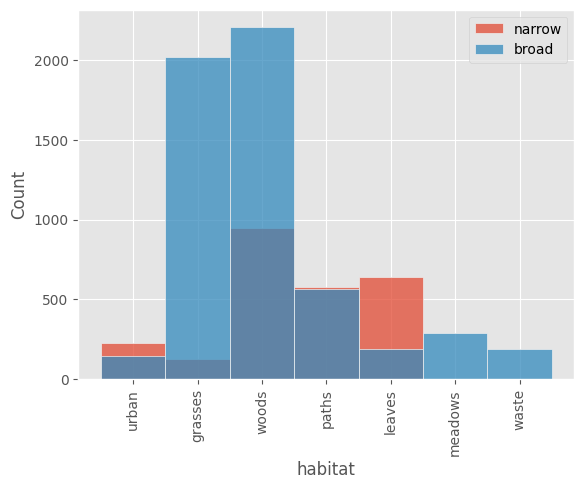

<Figure size 640x480 with 0 Axes>

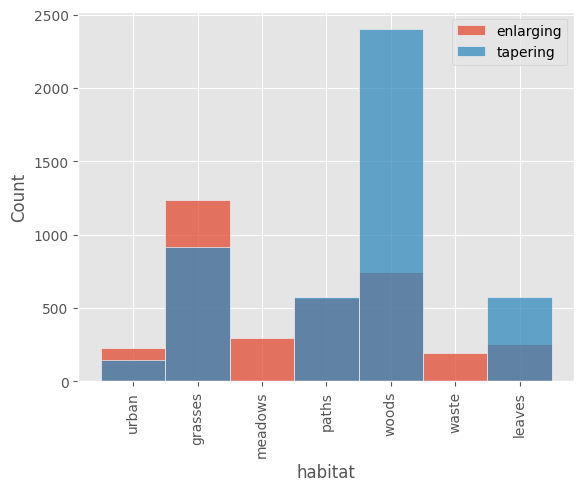

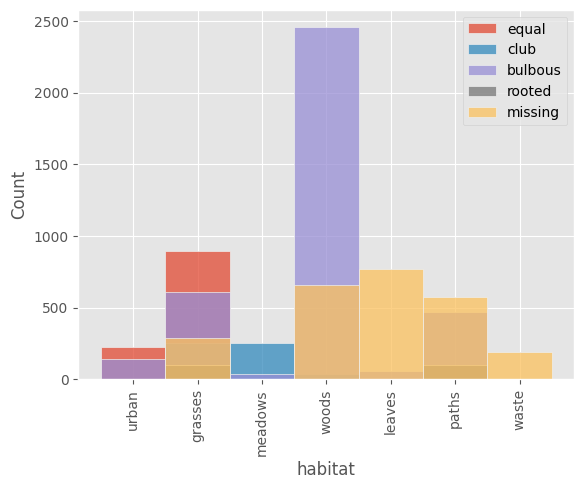

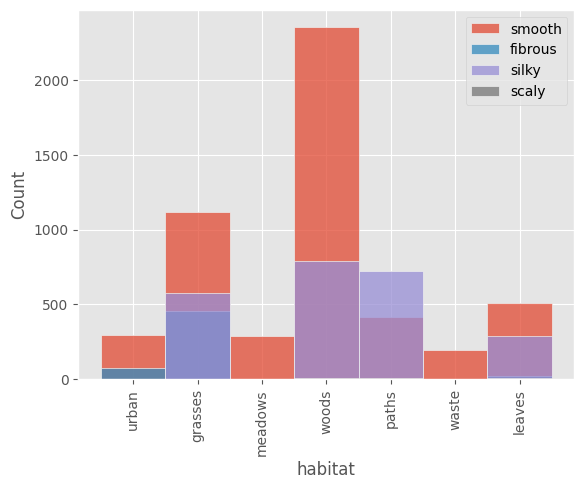

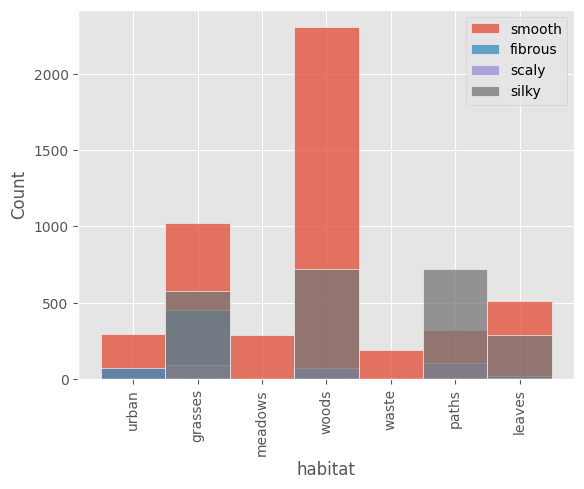

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

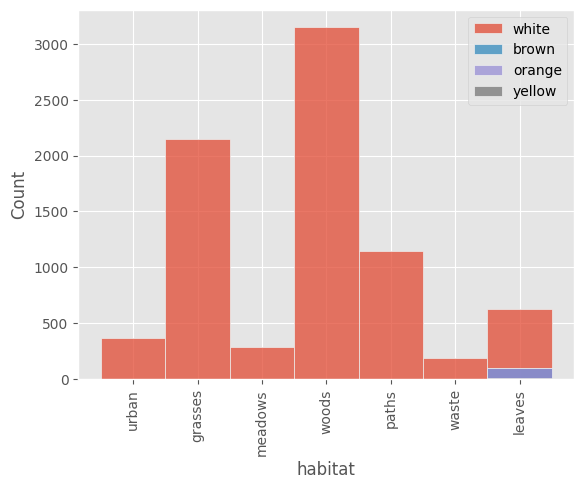

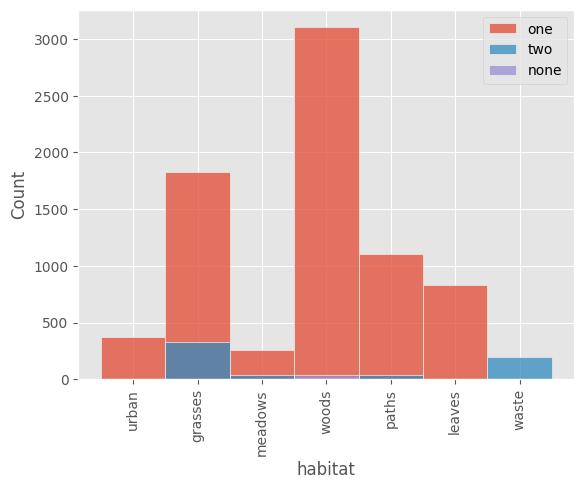

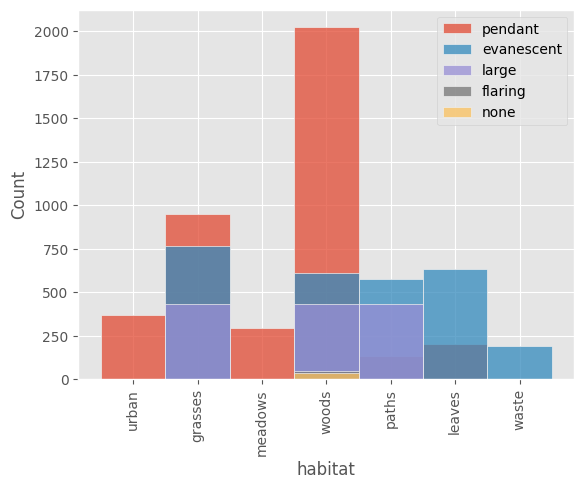

<Figure size 640x480 with 0 Axes>

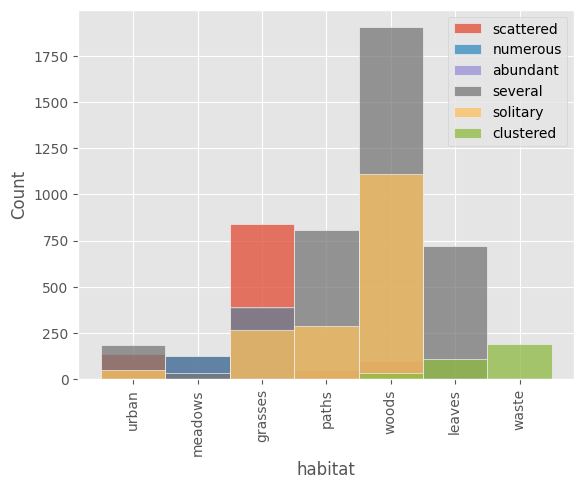

<Figure size 640x480 with 0 Axes>

In [24]:
for col in df.select_dtypes(include=['object']):           
    plt.figure()   
    for col2 in df.select_dtypes(include=['object']):
        plt.figure() 
        if len(df[col2].unique()) <9 and col !=col2 and col != 'class' and col2 != 'class' :
            for cat in df[col2].unique():
                #Data_A=Data[Data['column_y']==A]
                sns.histplot(df[df[col2]==cat][col],kde=False,label=cat)
            plt.legend()
            plt.xticks(rotation = 90)

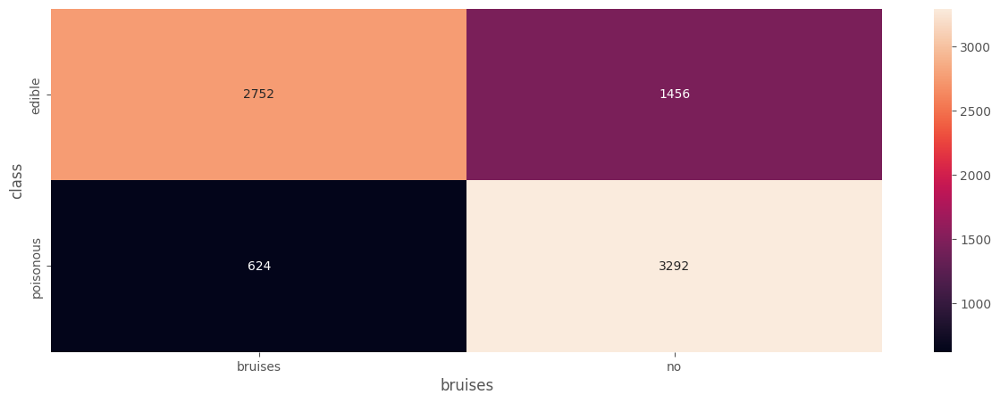

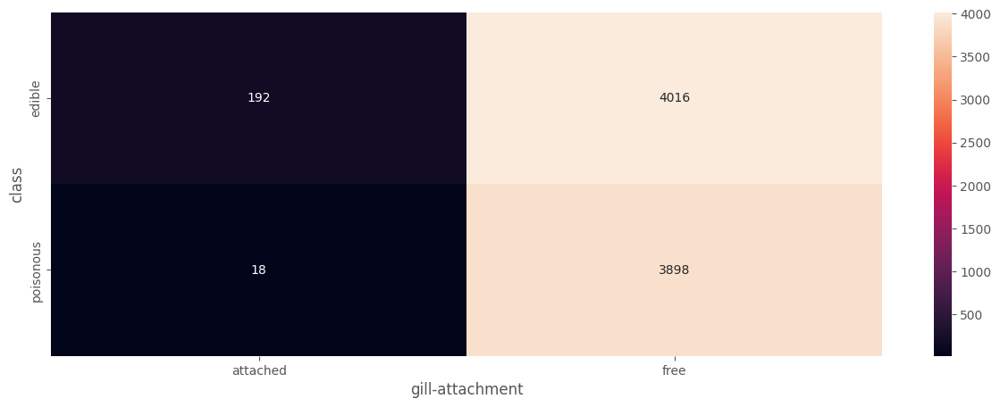

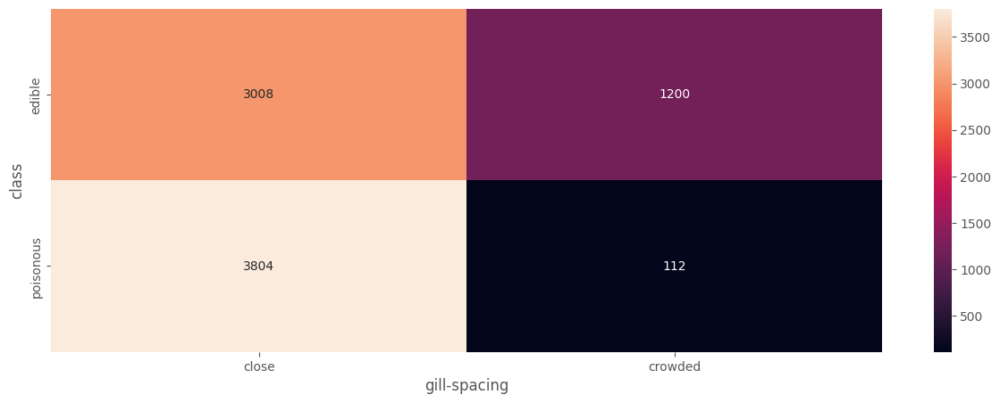

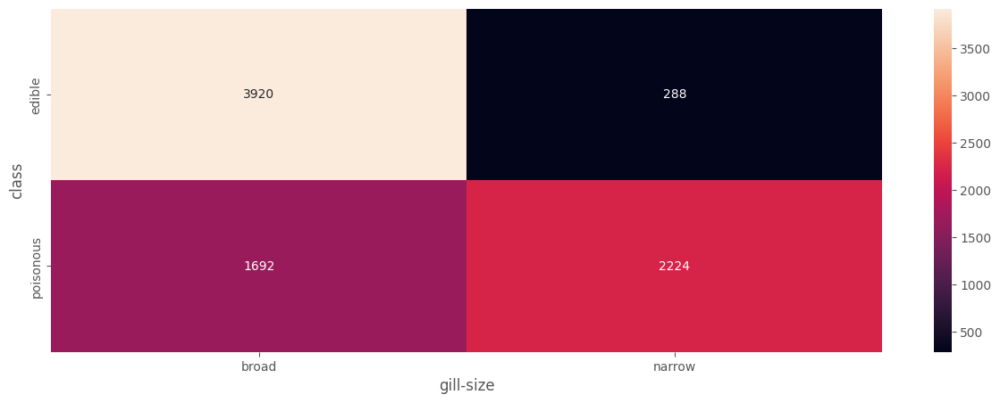

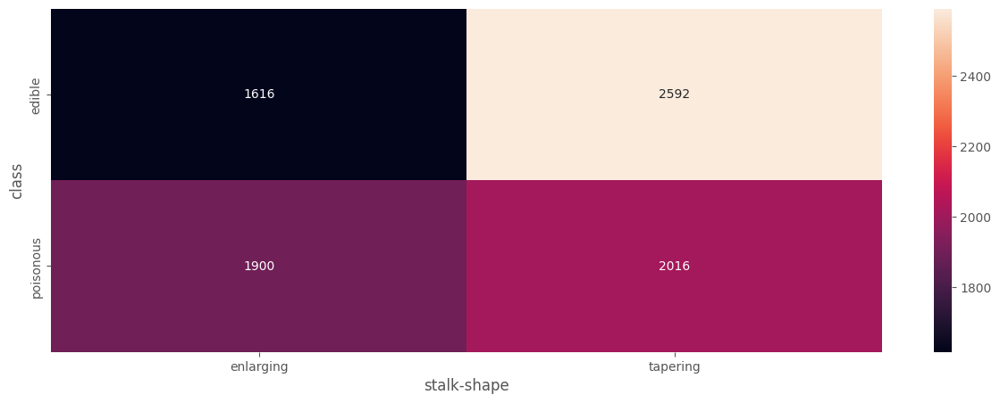

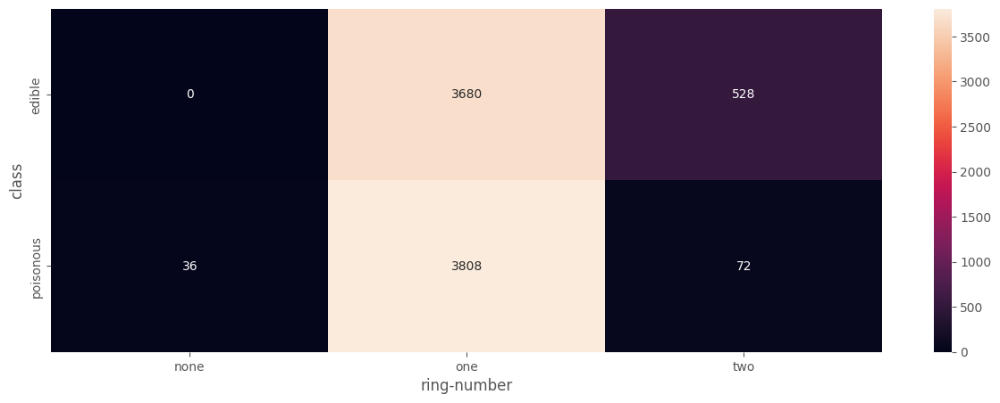

In [25]:
for col in df.select_dtypes(include=['object']):
    if len(df[col].unique()) <4 and col != 'class' :
        plt.figure(figsize=(15,5))
        sns.heatmap(pd.crosstab(df['class'],df[col]), annot=True, fmt='d') 

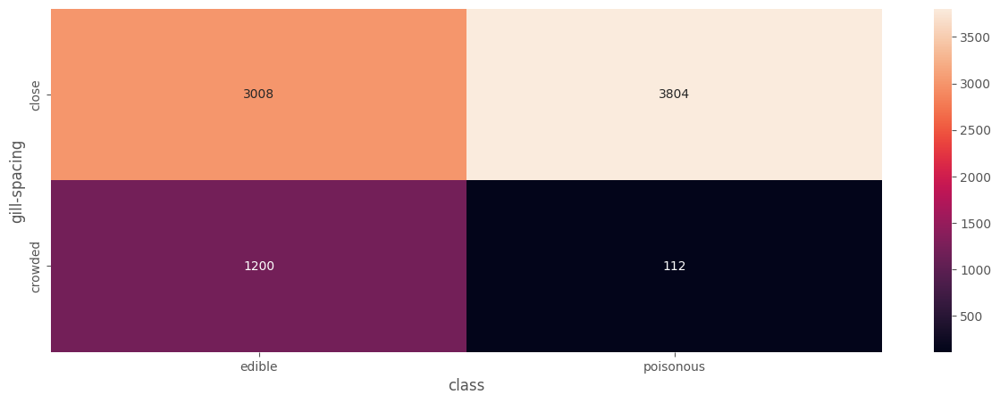

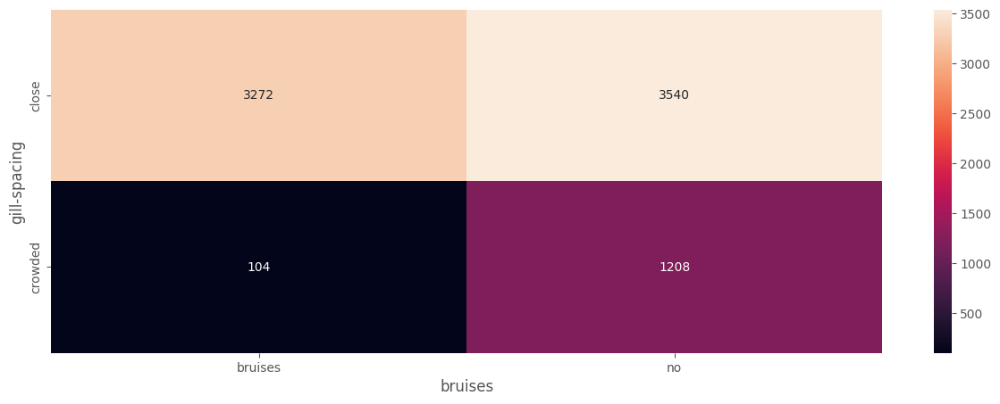

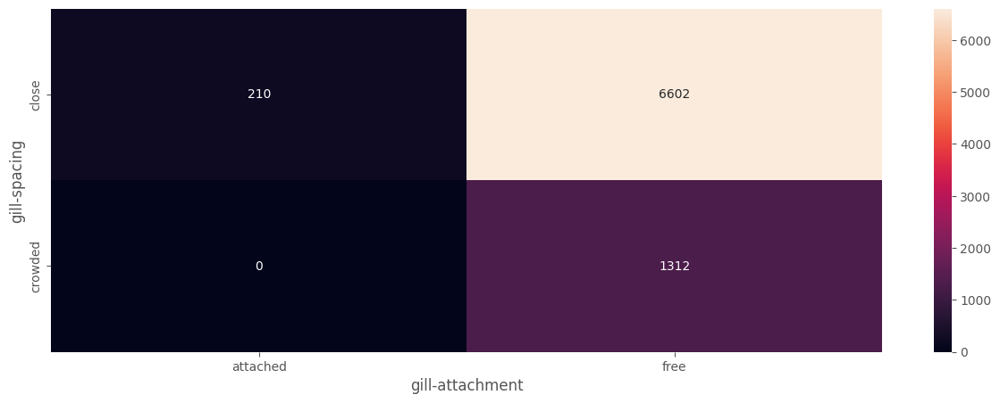

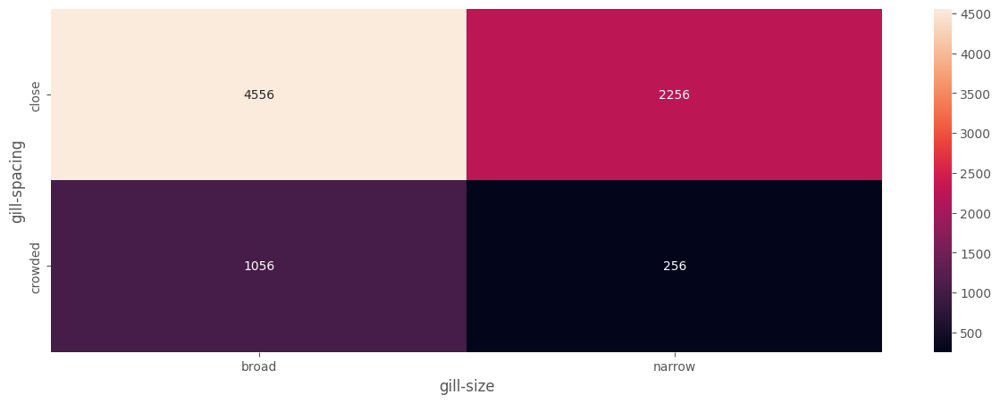

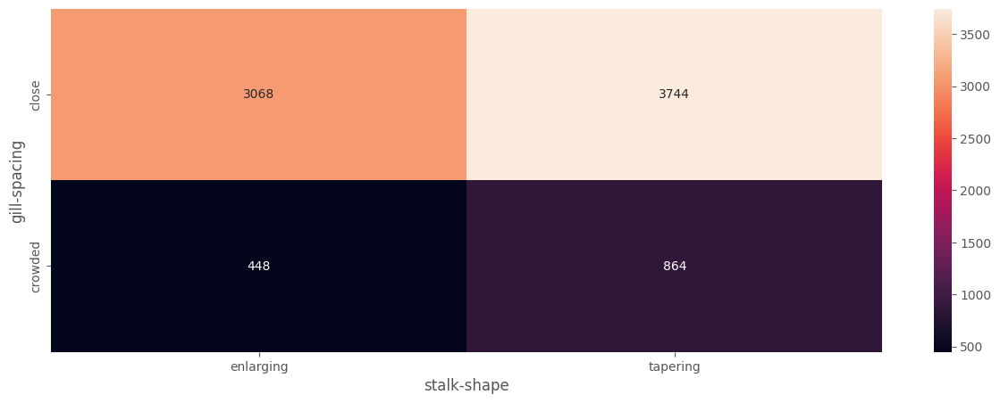

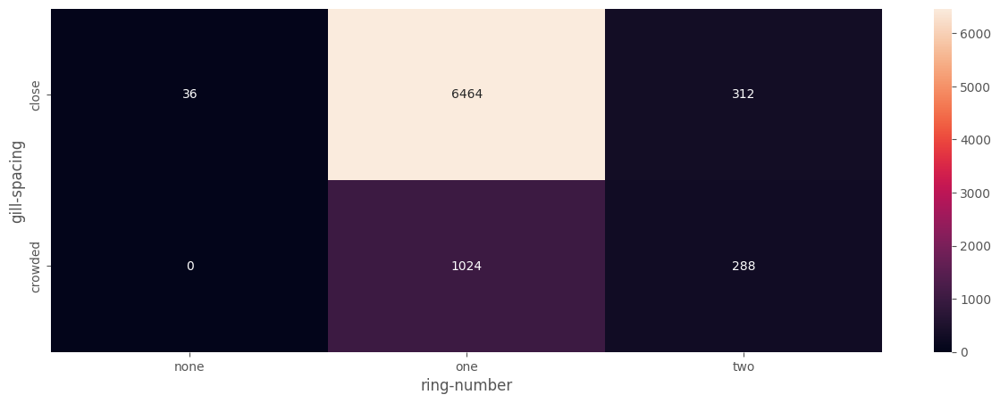

In [27]:
#Get matrice of nbr apparition and not correlation matrix (use it only for object<3 of col1 and object column2)
for col in df.select_dtypes(include=['object']):
    if len(df[col].unique()) <4 and col != 'gill-spacing' :
        plt.figure(figsize=(15,5))
        sns.heatmap(pd.crosstab(df['gill-spacing'],df[col]), annot=True, fmt='d') 

In [28]:
close_sum = df[(df['class'] =='poisonous')&(df['gill-spacing']=='close')]['gill-spacing'].count()
close_percent = df[(df['gill-spacing']=='close')]['gill-spacing'].count()
crowded_sum = df[(df['class'] =='poisonous')&(df['gill-spacing']=='crowded')]['gill-spacing'].count()
crowded_percen=df[(df['gill-spacing']=='crowded')]['gill-spacing'].count()

total = pd.DataFrame([close_sum,crowded_sum], columns=['Total']).rename(index={0: 'close_poisonous', 1: 'crowded_poisonous'})
percent = pd.DataFrame([close_sum/close_percent,crowded_sum/crowded_percen], columns=['percent']).rename(index={0: 'close_poisonous', 1: 'crowded_poisonous'})

Data = pd.concat([total, percent], axis=1)
Data

,Total,percent
close_poisonous,3804,0.558426
crowded_poisonous,112,0.085366


# [Step 6 : Data Cleaning]()<a id="7"></a> <br>

- Encodage : (Only for object column)

In [29]:
from sklearn.preprocessing import LabelEncoder
def encodage(data):
    cod_dict = {}
    for col in data.select_dtypes('object'):
        cod_dict[col] = LabelEncoder()
        print(cod_dict.keys())
        print('classed found : ' , list(cod_dict[col].fit(data[col]).classes_))
        #Create a label (category) encoder object
        data[col] = cod_dict[col].fit_transform(data[col])
        print('Updates dataframe is : \n' ,data )
    #for inverse transform not important
    # data['score0'] = cod_dict['score0'].inverse_transform(data['score0'])         
    # print('Inverse Transform  : \n' ,data)
    return data

- - Train_test_split

<Axes: title={'center': 'Data_test'}, ylabel='count'>

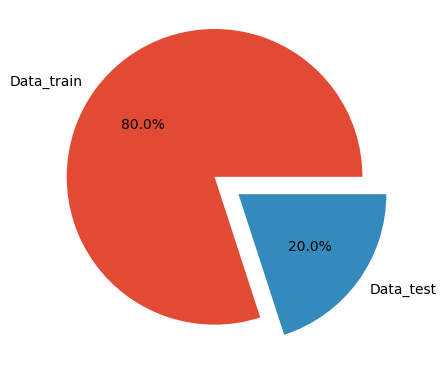

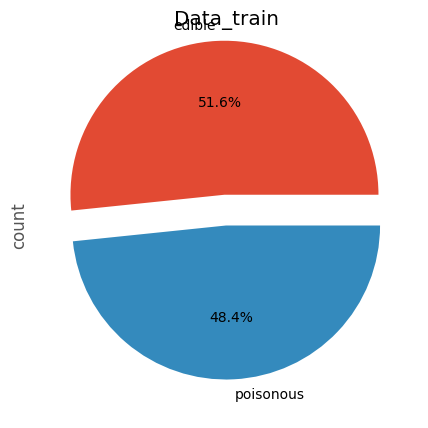

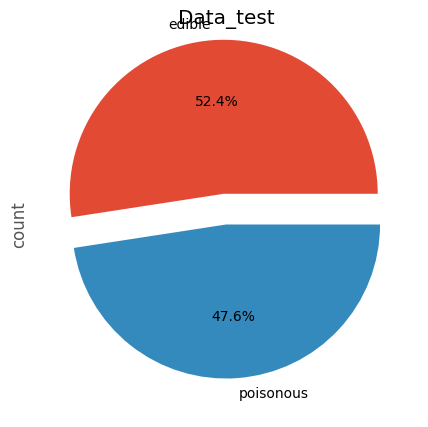

In [30]:
from sklearn.model_selection import train_test_split
Data_train , Data_test = train_test_split(df, test_size=0.2, random_state=0)
#chek if train_size==1-0.2 of all rows
plt.pie((Data_train.shape[0],Data_test.shape[0]), labels=('Data_train', 'Data_test'), autopct='%1.1f%%', explode =(0.2,0))
################################################(use it only for object target class )
#chek train['column_y'] class equilibre or not 
plt.figure(figsize=(15,5))
plt.title('Data_train')
Data_train['class'].value_counts().plot.pie(autopct='%1.1f%%', explode =(0.2,0))
#chek test['column_y'] class equilibre or not
plt.figure(figsize=(15,5))
plt.title('Data_test')
Data_test['class'].value_counts().plot.pie(autopct='%1.1f%%', explode =(0.2,0))

In [31]:
from sklearn.preprocessing import StandardScaler
def prep(data):
    # only for column object use it
    data = encodage(data) 
    # alwayse use it
    X = data.drop('class',axis=1)
    y = data['class']
    # only for target classification
    print(y.value_counts())
    return X,y
X_train, y_train = prep(Data_train)
X_test, y_test = prep(Data_test)

dict_keys(['class'])
classed found :  ['edible', 'poisonous']
Updates dataframe is : 
       class cap-shape cap-surface cap-color  bruises   odor gill-attachment  \
7434      0   knobbed      smooth      gray       no   none            free   
7725      0    convex     fibrous     white       no   none            free   
783       0    convex      smooth     white  bruises  anise            free   
1928      0      flat      smooth     white       no   none            free   
7466      1   knobbed       scaly       red       no  fishy            free   
...     ...       ...         ...       ...      ...    ...             ...   
4931      0    convex       scaly       red  bruises   none            free   
3264      1    convex     fibrous      gray       no   foul            free   
1653      0    convex      smooth      gray       no   none            free   
2607      0      flat     fibrous     brown  bruises   none            free   
2732      0    convex       scaly      gray 

# [Step 7: Model Building (If Applicable):]()<a id="8"></a> <br>

- Train the model

In [32]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X_train, y_train)


DecisionTreeClassifier()

# [Step 8: Model Evaluation:]()<a id="9"></a> <br>
- Evaluate the model's performance on the testing set using relevant metrics.

In [33]:
score = model.score(X_test,y_test)
print(score)
y_pred = model.predict(X_test)

0.9858461538461538


accuracy_score :  0.9858461538461538
confusion_matrix :  [[852   0]
 [ 23 750]]
f1_score :  0.9858461538461538
classification_report :                precision    recall  f1-score   support

           0       0.97      1.00      0.99       852
           1       1.00      0.97      0.98       773

    accuracy                           0.99      1625
   macro avg       0.99      0.99      0.99      1625
weighted avg       0.99      0.99      0.99      1625

recall_score :  [1.        0.9702458]
precision_score :  [0.97371429 1.        ]


<Axes: >

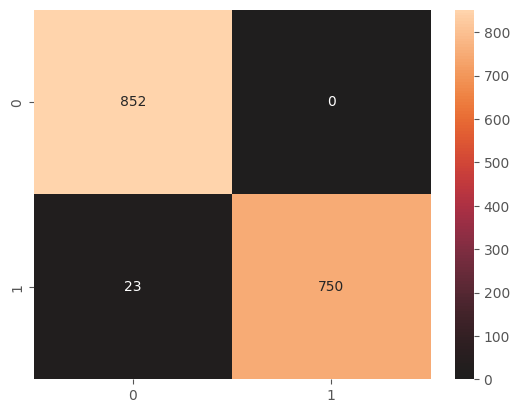

In [34]:
from sklearn.metrics import precision_score, accuracy_score,confusion_matrix, f1_score, recall_score, precision_recall_curve, classification_report

def scoring(y_test,y_pred):
    # Accuracy : acc= -((y-y_pred)**2/(y-y_mean)**2)  #this model describe in % the variation of y
    acc=accuracy_score(y_test, y_pred)        

    #best score is with Diagonal matrix   #visualisation of result               [[TP FP]
    cm = confusion_matrix(y_test, y_pred)                                        #[FN TN]]        

    # F1 Score : 2*(precision*recall)/(precision +recall) #average= can be : None,binary,micro,weighted,samples
    f1 = f1_score(y_test, y_pred, average='micro')         

    # Classification report :    #get (accuracy acc, score f1, cm)
    cr = classification_report(y_test,y_pred)

    # Recall Score : (Sensitivity) (TP / float(TP + FN)) == 1/1+2  #average= can be : None,binary,macro,weighted,samples
    rs = recall_score(y_test, y_pred, average=None)        

    # Precision Score : (Specificity) (TP / float(TP + FP))
    ps = precision_score(y_test, y_pred, average=None)
    return acc,cm,f1,cr,rs,ps

#compare (accuracy acc, score f1, cm)
scoring(y_test,y_pred)              
print("accuracy_score : " , scoring(y_test,y_pred)[0])
print("confusion_matrix : ",  scoring(y_test,y_pred)[1] )
print("f1_score : " , scoring(y_test,y_pred)[2] )
print("classification_report : " , scoring(y_test,y_pred)[3] )
print("recall_score : " , scoring(y_test,y_pred)[4] )
print("precision_score : " , scoring(y_test,y_pred)[5] )
#visualisation of result : best score is with Diagonal matrix
cm = scoring(y_test,y_pred)[1] 
sns.heatmap(cm, center=True, annot=True, fmt="d")     

# [Step 9: Make Pipline:]()<a id="10"></a> <br>

In [35]:
def prep2(data):
    # alwayse use it
    X = data.drop('class',axis=1)
    y = data['class']
    return X,y
X_train, y_train = prep2(Data_train)
X_test, y_test = prep2(Data_test)

In [36]:
from sklearn.preprocessing import PolynomialFeatures,RobustScaler, StandardScaler,OneHotEncoder
#MinMaxScaler,[Normalizer(copy=True, norm=''l1'or'max'')modif suivant row,MaxAbsScaler(copy=True)modif suivant columns,FunctionTransformer(func=fun1 or lambda x: x**0.1,validate = True),Binarizer(threshold = 1.0),
from sklearn.impute import SimpleImputer,KNNImputer,MissingIndicator

from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline, make_union

# Use of all models in order to eliminate overfitting => RadForst, AdBoost, SVM, KNN 
num_features = [col for col in df.select_dtypes(exclude=['object']) if col != 'class']
categ_features = [col for col in df.select_dtypes(include=['object']) if col != 'class']
#Eliminate nan val+StandardScaler
num_pipeline_norm = make_pipeline(KNNImputer(),RobustScaler())
#pas besoin de normalisation (RobustScaler()) (SimpleImputer(missing_values=np.nan, strategy='mean',fill_value=-9)
num_pipeline = make_pipeline(KNNImputer())
# strategy = 'most_frequent',mean,median,constant with fill_value=-99
categ_pipeline = make_pipeline(KNNImputer(),OneHotEncoder())

preprocessor_norm = make_column_transformer((num_pipeline_norm,num_features),(categ_pipeline,categ_features))
preprocessor = make_column_transformer((num_pipeline,num_features),(categ_pipeline,categ_features))
#Model Classificat#=================================#=========================================
import xgboost as xgb
mod_XGB = make_pipeline(preprocessor_norm,PolynomialFeatures(),xgb.XGBClassifier())
from sklearn.linear_model import LogisticRegression,SGDClassifier
mod_LOG = make_pipeline(preprocessor_norm,PolynomialFeatures(),LogisticRegression(penalty='l2',solver='sag',C=1.0,random_state=33))
mod_SGD = make_pipeline(preprocessor_norm,PolynomialFeatures(),SGDClassifier(random_state=0))
from sklearn.svm import SVC
mod_SVM = make_pipeline(preprocessor_norm,PolynomialFeatures(), SVC(random_state=0))         #must use Scaling standard => -1< X_train <1 & mean=0 & std=1
from sklearn.tree import DecisionTreeClassifier
mod_tree = make_pipeline(preprocessor_norm,PolynomialFeatures(), DecisionTreeClassifier(criterion='gini',max_depth=3,random_state=33))  
from sklearn.neighbors import KNeighborsClassifier
mod_KNN = make_pipeline(preprocessor_norm,PolynomialFeatures(), KNeighborsClassifier())      #Scaling MinMax => 1< X_train <0   
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier, AdaBoostClassifier
mod_RadForst = make_pipeline(preprocessor,PolynomialFeatures(),RandomForestClassifier(random_state=0))    
mod_Gradient = make_pipeline(preprocessor,PolynomialFeatures(),GradientBoostingClassifier(n_estimators=100,max_depth=3,random_state=33) )  
mod_AdBoost = make_pipeline(preprocessor,PolynomialFeatures(),AdaBoostClassifier(random_state=0))

models = {'XGB':mod_XGB,'LOG':mod_LOG,'SGD':mod_SGD,'SVM':mod_SVM,'tree':mod_tree,'KNN':mod_KNN,'RadForst':mod_RadForst,'Gradient':mod_Gradient,'AdBoost':mod_AdBoost}
#Fitting Classificat#=================================#=========================================
accuracy_dict = {}
for nam, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    # Store accuracy in dictionary
    accuracy_dict[nam] = scoring(y_test, y_pred)[0]
    print('result of model nam : ' , nam)
    #compare (accuracy acc, score f1, cm)         
    print("accuracy_score : " , scoring(y_test,y_pred)[0])
    print("confusion_matrix : ",  scoring(y_test,y_pred)[1] )
    print("f1_score : " , scoring(y_test,y_pred)[2] )
    print("classification_report : " , scoring(y_test,y_pred)[3] )
    print("recall_score : " , scoring(y_test,y_pred)[4] )
    print("precision_score : " , scoring(y_test,y_pred)[5] )
# Find the model with the best accuracy
best_model = max(accuracy_dict, key=accuracy_dict.get)
print(f"The best model is {best_model} with an accuracy of {accuracy_dict[best_model]}")

result of model nam :  XGB
accuracy_score :  1.0
confusion_matrix :  [[852   0]
 [  0 773]]
f1_score :  1.0
classification_report :                precision    recall  f1-score   support

           0       1.00      1.00      1.00       852
           1       1.00      1.00      1.00       773

    accuracy                           1.00      1625
   macro avg       1.00      1.00      1.00      1625
weighted avg       1.00      1.00      1.00      1625

recall_score :  [1. 1.]
precision_score :  [1. 1.]


c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


result of model nam :  LOG
accuracy_score :  1.0
confusion_matrix :  [[852   0]
 [  0 773]]
f1_score :  1.0
classification_report :                precision    recall  f1-score   support

           0       1.00      1.00      1.00       852
           1       1.00      1.00      1.00       773

    accuracy                           1.00      1625
   macro avg       1.00      1.00      1.00      1625
weighted avg       1.00      1.00      1.00      1625

recall_score :  [1. 1.]
precision_score :  [1. 1.]
result of model nam :  SGD
accuracy_score :  1.0
confusion_matrix :  [[852   0]
 [  0 773]]
f1_score :  1.0
classification_report :                precision    recall  f1-score   support

           0       1.00      1.00      1.00       852
           1       1.00      1.00      1.00       773

    accuracy                           1.00      1625
   macro avg       1.00      1.00      1.00      1625
weighted avg       1.00      1.00      1.00      1625

recall_score :  [1. 1.]
preci

- GridSearchCV

In [37]:
# Optimisation(hyperparametres) GridSearch :#=============================#========================
from sklearn.model_selection import GridSearchCV #or RandomizedSearchCV
hyper_params = {'polynomialfeatures__degree':[2,3,4]}          
grid = GridSearchCV(mod_XGB, hyper_params,cv=4).fit(X_train,y_train)    #cv=3ou4ou5 == ndr of split
# grid = RandomizedSearchCV(mod_SVM, hyper_params, scoring='recall',cv=4, n_iter=40).fit(X_train,y_train)   #n_iter == 40 iteration by chance
print(grid.best_score_)                      #get best score in GridSearchCV
print(grid.best_params_)                     #get best parametres
model_grid = grid.best_estimator_            #get best model
# 'Fit :
model_grid.fit(X_train,y_train)
y_pred = model_grid.predict(X_test)
# 'Classification_report:
scoring(y_test,y_pred)                           #compare (accuracy acc, score f1, cm)

In [15]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test , predictions)

0.9827727645611156

# **Random Forest Model**

In [17]:
rf.fit(x_train , y_train)
rf.score(x_train , y_train)

0.992085824832923